# Functional Comparison of ASN with WS and C. Elegans

This notebook generates 24 different ASN networks with 300 nodes, each of which has differing parameters (Average Path length, Wire Dispersion and Centroid Dispersion). 

We then find the average degree for each ASN network, and use that as 2k to generate corresponding grid-like, small-world and random Watts-Strogatz networks.

We also load a sample C. Elegans network for comparison.

In [1]:
cd "C:\Users\aloe8475\Dropbox (Sydney Uni)\Data\ASN_simulation\Python\edamame"

C:\Users\aloe8475\Dropbox (Sydney Uni)\Data\ASN_simulation\Python\edamame


In [2]:
from scipy.io import loadmat, savemat
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import datetime
import networkx as nx
from edamame import *
from tqdm import tqdm_notebook
import os
import edamame.core.wires as wires
from random import choice
import warnings
from IPython.core.debugger import set_trace
import nct
import bct

warnings.filterwarnings('ignore')

## Generate 300nw ASN + C. Elegans:

In [3]:
cElegans=loadmat(r"C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Data\Organic Networks Connectomes\celegans277neurons.mat")

In [4]:
#set up dictionary for celegans:
Elegans={'adj_matrix':[],'G':[],'Accuracy':{'Linear Transformation':[],'Mackey Glass':{'Cheat Steps':[],'Accuracy Value':[]},'MNIST':[]},'Graph Theory':{'Small World':[],'Modularity':[],'CCoeff':[],'MZ':[],'PCoeff':[],'PL':[]}}

In [5]:
elegansMat=cElegans['celegans277matrix']
elegansGraph = nx.from_numpy_array(elegansMat)
Elegans['adj_matrix']=elegansMat
Elegans['G']=elegansGraph

In [6]:
wires.generate_wires_distribution

<function edamame.core.wires.generate_wires_distribution(number_of_wires=1500, wire_av_length=14.0, wire_dispersion=5.0, centroid_dispersion=1200.0, gennorm_shape=5, Lx=3000.0, Ly=3000.0, this_seed=None)>

In [7]:
#Set Paramaters for network generation: Centroid Dispersion, Wire Dispersion + Length of Wires
this_seed=1779#np.random.randint(10000)#5772
params={'Centroid':np.arange(100,400,50),'Wire Dispersion':[1.0, 2.5, 5.0, 7.5, 10.0, 25.0, 50.0, 75.0, 100.0, 250.0],'Length':np.arange(100,300,25)}
numNetworks=len(params['Centroid'])+len(params['Wire Dispersion'])+len(params['Length']) #all parameters)
ASN300=[None]*numNetworks

#Generate networks based on params 
for i in range(numNetworks):
    #loop through different parameter sets:
    if i < len(params['Centroid']):
        ASN300[i]=wires.generate_wires_distribution(300,this_seed=this_seed,wire_dispersion=10,centroid_dispersion=params['Centroid'][i],wire_av_length=150)
        count = 0
        while ASN300[i]==None: #make sure the networks aren't empty
            count=count+1
            randSeed2=np.random.randint(count,100000) #size = number of networks of each size
            ASN300[i]=wires.generate_wires_distribution(300,wire_dispersion=10,centroid_dispersion=params['Centroid'][i],this_seed=randSeed2,wire_av_length=150)#, max_iters=2)
    elif i >= len(params['Centroid']) and i < len(params['Centroid'])+len(params['Wire Dispersion']):
        ASN300[i]=wires.generate_wires_distribution(300,this_seed=this_seed,centroid_dispersion=350,wire_dispersion=params['Wire Dispersion'][i-len(params['Centroid'])],wire_av_length=150)
        count = 0;
        while ASN300[i]==None: #make sure the networks aren't empty
            count=count+1
            randSeed2=np.random.randint(count,100000) #size = number of networks of each size
            ASN300[i]=wires.generate_wires_distribution(300,centroid_dispersion=350,wire_dispersion=params['Wire Dispersion'][i-6],this_seed=randSeed2,wire_av_length=150)#, max_iters=2)
                    
    else:
        ASN300[i]=wires.generate_wires_distribution(300,this_seed=this_seed,centroid_dispersion=350,wire_dispersion=10,wire_av_length=params['Length'][i-(len(params['Centroid'])+len(params['Wire Dispersion']))],)
        count = 0;
        while ASN300[i]==None: #make sure the networks aren't empty
            count=count+1
            randSeed2=np.random.randint(count,100000) #size = number of networks of each size
            ASN300[i]=wires.generate_wires_distribution(300,centroid_dispersion=350,wire_dispersion=10,wire_av_length=params['Length'][i-16],this_seed=randSeed2)#, max_iters=2) 

In [8]:
#set up accuracy dictionary for ASN
for i in range(len(ASN300)):
    ASN300[i].update({'Accuracy':{'Linear Transformation':[],'Mackey Glass':[],'MNIST':[]}})

In [9]:
len(ASN300)

24

In [10]:
this_seed

1779

In [11]:
# this_seed2=700
# ASN100=edamame.core.generateNetwork(100,this_seed=this_seed2)
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

In [12]:
#Select Largest Components
def select_largest_component_new(wires_dict):
    """
    Find and select largest connected component of the original graph G.
    Throws away unconnected components and updates all the keys in wires_dict 
    """
#     def connected_component_subgraphs(G):
#         for c in nx.connected_components(G):
#             yield G.subgraph(c)
    
    wires_dict['G'] = max(connected_component_subgraphs(wires_dict['G']), key=len)
#     set_trace()
    nw = len(wires_dict['G'].nodes())
    nj = len(wires_dict['G'].edges())   
    
    logging.info("The largest component has %5d nodes and %6d edges", nw, nj)

    # Replace values in the dictionary
    wires_dict['number_of_wires']     = nw
    wires_dict['number_of_junctions'] = nj
    wires_dict['xa'] = wires_dict['xa'][wires_dict['G'].nodes()] 
    wires_dict['ya'] = wires_dict['ya'][wires_dict['G'].nodes()] 
    wires_dict['xb'] = wires_dict['xb'][wires_dict['G'].nodes()] 
    wires_dict['yb'] = wires_dict['yb'][wires_dict['G'].nodes()]
    wires_dict['xc'] = wires_dict['xc'][wires_dict['G'].nodes()] 
    wires_dict['yc'] = wires_dict['yc'][wires_dict['G'].nodes()]
 
    # Keep old edge_list
    old_edge_list = [(ii, kk) for ii, kk in  zip(wires_dict['edge_list'][:, 0], wires_dict['edge_list'][:, 1])]
    # Remove old edge list
    wires_dict = wires.remove_key(wires_dict, 'edge_list') 
    # Save indices of intersections in the old graph
    ind_dict = {key:value for value,key in enumerate(old_edge_list)}
    new_edge_list = sorted([kk if kk[0] < kk[1] else (kk[1], kk[0]) for kk in wires_dict['G'].edges()], key=lambda x: x[0])
    # Find intersection between the two sets
    inter = set(ind_dict).intersection(new_edge_list)
    # Retrieve edge indices/positions from the old list
    edges_idx = [ind_dict[idx] for idx in inter]
       
    # These have length equal to number of junctions -- only get the ones we need
    wires_dict['xi'] = wires_dict['xi'][edges_idx] 
    wires_dict['yi'] = wires_dict['yi'][edges_idx] 
    
    # Get contiguous numbering of nodes
    # Build node mapping 
    node_mapping    = {key:value for value, key in enumerate(sorted(wires_dict['G'].nodes()))}
    # This  step also renames edges list
    wires_dict['G'] =  nx.relabel_nodes(wires_dict['G'] , node_mapping)

    # Swap node vertices if vertex 0 is larger than vertex 1, then sort by first element
    wires_dict['edge_list'] = np.asarray(sorted([kk if kk[0] < kk[1] else (kk[1], kk[0]) for kk in wires_dict['G'].edges()], key=lambda x: x[0]))
    
    # Save adjacency matrix of new graph
    wires_dict = wires.remove_key(wires_dict, 'adj_matrix') 
    wires_dict = wires.generate_adj_matrix(wires_dict)

    wire_distances = wires.cdist(np.array([wires_dict['xc'], wires_dict['yc']]).T, np.array([wires_dict['xc'], wires_dict['yc']]).T, metric='euclidean')    
    wires_dict['wire_distances'] = wire_distances

    return wires_dict 

In [13]:
# nwEdges100=np.array(np.sum(ASN100['adj_matrix'])/2)

#Detect junctions, create adj matrix and graph, and store number of junctions
nwEdges300=[None]*len(ASN300)
for i in range(len(ASN300)):
    print('Network ' + str(i))
    ASN300[i]=wires.detect_junctions(ASN300[i])
    ASN300[i]=wires.generate_adj_matrix(ASN300[i])
    ASN300[i]=wires.generate_graph(ASN300[i])
    ASN300[i]=select_largest_component_new(ASN300[i])
    nwEdges300[i]=np.array(np.sum(ASN300[i]['adj_matrix'])/2)

2020-03-26 13:00:11,610:INFO:Detecting junctions


Network 0


2020-03-26 13:00:12,676:INFO:Finished detecting junctions
2020-03-26 13:00:12,759:INFO:The largest component has   300 nodes and  11334 edges
2020-03-26 13:00:12,960:INFO:Detecting junctions


Network 1


2020-03-26 13:00:13,825:INFO:Finished detecting junctions
2020-03-26 13:00:13,871:INFO:The largest component has   300 nodes and   5779 edges
2020-03-26 13:00:13,940:INFO:Detecting junctions


Network 2


2020-03-26 13:00:14,745:INFO:Finished detecting junctions
2020-03-26 13:00:14,769:INFO:The largest component has   300 nodes and   3425 edges
2020-03-26 13:00:14,805:INFO:Detecting junctions


Network 3


2020-03-26 13:00:15,583:INFO:Finished detecting junctions
2020-03-26 13:00:15,605:INFO:The largest component has   298 nodes and   2220 edges
2020-03-26 13:00:15,636:INFO:Detecting junctions


Network 4


2020-03-26 13:00:16,466:INFO:Finished detecting junctions
2020-03-26 13:00:16,482:INFO:The largest component has   295 nodes and   1543 edges
2020-03-26 13:00:16,509:INFO:Detecting junctions


Network 5


2020-03-26 13:00:17,261:INFO:Finished detecting junctions
2020-03-26 13:00:17,272:INFO:The largest component has   291 nodes and   1160 edges
2020-03-26 13:00:17,291:INFO:Detecting junctions


Network 6


2020-03-26 13:00:18,001:INFO:Finished detecting junctions
2020-03-26 13:00:18,011:INFO:The largest component has   291 nodes and   1170 edges
2020-03-26 13:00:18,032:INFO:Detecting junctions


Network 7


2020-03-26 13:00:18,750:INFO:Finished detecting junctions
2020-03-26 13:00:18,760:INFO:The largest component has   291 nodes and   1164 edges
2020-03-26 13:00:18,780:INFO:Detecting junctions


Network 8


2020-03-26 13:00:19,484:INFO:Finished detecting junctions
2020-03-26 13:00:19,495:INFO:The largest component has   291 nodes and   1158 edges
2020-03-26 13:00:19,512:INFO:Detecting junctions


Network 9


2020-03-26 13:00:20,223:INFO:Finished detecting junctions
2020-03-26 13:00:20,234:INFO:The largest component has   291 nodes and   1156 edges
2020-03-26 13:00:20,253:INFO:Detecting junctions


Network 10


2020-03-26 13:00:20,942:INFO:Finished detecting junctions
2020-03-26 13:00:20,953:INFO:The largest component has   291 nodes and   1160 edges
2020-03-26 13:00:20,972:INFO:Detecting junctions


Network 11


2020-03-26 13:00:21,799:INFO:Finished detecting junctions
2020-03-26 13:00:21,811:INFO:The largest component has   290 nodes and   1151 edges
2020-03-26 13:00:21,830:INFO:Detecting junctions


Network 12


2020-03-26 13:00:22,547:INFO:Finished detecting junctions
2020-03-26 13:00:22,558:INFO:The largest component has   288 nodes and   1117 edges
2020-03-26 13:00:22,577:INFO:Detecting junctions


Network 13


2020-03-26 13:00:23,403:INFO:Finished detecting junctions
2020-03-26 13:00:23,415:INFO:The largest component has   291 nodes and   1060 edges
2020-03-26 13:00:23,431:INFO:Detecting junctions


Network 14


2020-03-26 13:00:24,132:INFO:Finished detecting junctions
2020-03-26 13:00:24,143:INFO:The largest component has   271 nodes and   1086 edges
2020-03-26 13:00:24,163:INFO:Detecting junctions


Network 15


2020-03-26 13:00:24,866:INFO:Finished detecting junctions
2020-03-26 13:00:24,879:INFO:The largest component has   199 nodes and    998 edges
2020-03-26 13:00:24,896:INFO:Detecting junctions


Network 16


2020-03-26 13:00:25,604:INFO:Finished detecting junctions
2020-03-26 13:00:25,612:INFO:The largest component has   224 nodes and    452 edges
2020-03-26 13:00:25,624:INFO:Detecting junctions


Network 17


2020-03-26 13:00:26,362:INFO:Finished detecting junctions
2020-03-26 13:00:26,373:INFO:The largest component has   266 nodes and    785 edges
2020-03-26 13:00:26,388:INFO:Detecting junctions


Network 18


2020-03-26 13:00:27,093:INFO:Finished detecting junctions
2020-03-26 13:00:27,104:INFO:The largest component has   291 nodes and   1160 edges
2020-03-26 13:00:27,121:INFO:Detecting junctions


Network 19


2020-03-26 13:00:27,836:INFO:Finished detecting junctions
2020-03-26 13:00:27,851:INFO:The largest component has   295 nodes and   1542 edges
2020-03-26 13:00:27,875:INFO:Detecting junctions


Network 20


2020-03-26 13:00:28,612:INFO:Finished detecting junctions
2020-03-26 13:00:28,631:INFO:The largest component has   295 nodes and   2013 edges
2020-03-26 13:00:28,662:INFO:Detecting junctions


Network 21


2020-03-26 13:00:29,409:INFO:Finished detecting junctions
2020-03-26 13:00:29,432:INFO:The largest component has   299 nodes and   2533 edges
2020-03-26 13:00:29,469:INFO:Detecting junctions


Network 22


2020-03-26 13:00:30,221:INFO:Finished detecting junctions
2020-03-26 13:00:30,246:INFO:The largest component has   300 nodes and   3106 edges
2020-03-26 13:00:30,284:INFO:Detecting junctions


Network 23


2020-03-26 13:00:31,053:INFO:Finished detecting junctions
2020-03-26 13:00:31,081:INFO:The largest component has   300 nodes and   3725 edges


In [14]:
avgDegree300=[None]*len(nwEdges300)
for i in range(len(nwEdges300)):
    avgDegree300[i]=nwEdges300[i]/300
# avgDegree100=nwEdges100/100

In [15]:
# fwASN100=nx.floyd_warshall_numpy(ASN100['G'])
fwASN300=[None]*len(ASN300)
for i in range(len(ASN300)):
    fwASN300[i]=nx.floyd_warshall_numpy(ASN300[i]['G'])

In [16]:
#export adj matrices to calculate small worldness in matlab:
adj_mats={"AdjMat":[]}
for i in range(len(ASN300)):
    adj_mats['AdjMat'].append(ASN300[i]['adj_matrix'])
savemat(r'C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Analysis\Functional Connectivity\Functional Tasks\300nwASN.mat',adj_mats)

## Generate WS: 

In [17]:
# ws100=[]
ws300=[[None]*2 for i in range(len(ASN300))]
this_seed=np.random.randint(1000) #595
for i in range(len(ASN300)):
    for beta in range(2):
#           print(str(i)+' '+str(beta))
#         ws100.append(nx.watts_strogatz_graph(100,int(np.round(avgDegree100)),beta,seed=this_seed))
        if np.round(avgDegree300[i]) < 1.5:
            k=2
        else:
            k=int(np.round(avgDegree300[i]))
        temp=nx.watts_strogatz_graph(300,k,beta,seed=this_seed)
#         set_trace()        
        ws300[i][beta]=max(connected_component_subgraphs(temp), key=len)


In [18]:
WS_Grid=[None]*len(ws300)
WS_Random=[None]*len(ws300)
for i in range(len(ws300)):
    WS_Grid[i]={'adj_matrix':[],'G':[],'Accuracy':{'Linear Transformation':[],'Mackey Glass':[],'MNIST':[]},'Graph Theory':{'Small World':[],'Modularity':[],'CCoeff':[],'MZ':[],'PCoeff':[],'PL':[]}}
    WS_Random[i]={'adj_matrix':[],'G':[],'Accuracy':{'Linear Transformation':[],'Mackey Glass':[],'MNIST':[]},'Graph Theory':{'Small World':[],'Modularity':[],'CCoeff':[],'MZ':[],'PCoeff':[],'PL':[]}}

In [19]:
for i in range(len(ws300)):
    WS_Grid[i]['adj_matrix']=nx.adj_matrix(ws300[i][0])
    WS_Random[i]['adj_matrix']=nx.adj_matrix(ws300[i][1])
    WS_Grid[i]['G']=ws300[i][0]
    WS_Random[i]['G']=ws300[i][1]

In [20]:
#export adj matrices to calculate small worldness in matlab:
adj_mats={"AdjMat_Grid":[],"AdjMat_Random":[]}
for i in range(len(WS_Grid)):
    adj_mats['AdjMat_Grid'].append(WS_Grid[i]['adj_matrix'])
    adj_mats['AdjMat_Random'].append(WS_Random[i]['adj_matrix'])
savemat(r'C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Analysis\Functional Connectivity\Functional Tasks\300_WS.mat',adj_mats)

## Graph Theory Measures:

### ASN

In [21]:
for i in range(len(ASN300)):
    ASN300[i].update({'Graph Theory':{'Small World':[],'Modularity':[],'CCoeff':[],'MZ':[],'PCoeff':[],'PL':[]}})

In [22]:
# Small Worldness: 
# ------------------------------------
# CALCULATED IN MATLAB: smallworldness.m 
# found in C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Analysis\Functional Connectivity\Functional Tasks
# ------------------------------------
temp=loadmat(r'C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Analysis\Functional Connectivity\Functional Tasks\300nwASN_smallworld.mat')
smallworld=temp['smallworld'][0]
del temp

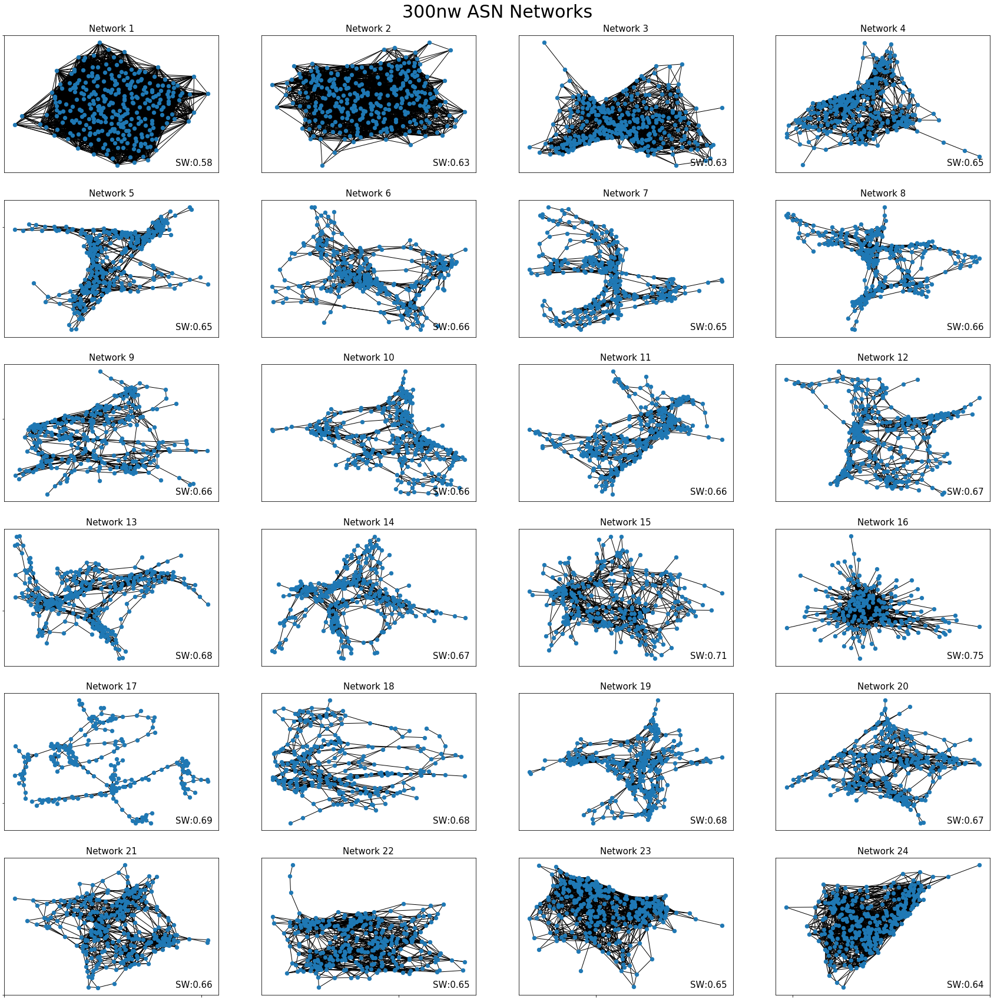

In [23]:
#Plot Networks
fig1=plt.figure(figsize=(30,30))

ax=[None]*len(ASN300)
axBig = fig1.add_subplot(111)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
plt.title('300nw ASN Networks',fontsize=30,pad=30)
# plt.xlabel('PCoeff',fontsize=30,labelpad=15)
# plt.ylabel('MZ',fontsize=30,labelpad=15)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1) #change rows and columns to be factors of ASN300 length
    nx.draw_networkx(ASN300[i]['G'],node_size=40,with_labels=False)
    ax[i].set_title('Network ' + str(i+1),fontsize=15)
    plt.text(0.8,0.05,'SW:'+"{0:.2f}".format(smallworld[i]),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot
#     ax[i].set_ylim(-1.5,1.5)
#     ax[i].set_xlim(-1.5,1.5)

In [24]:
# Modularity, PCoeff, Small Worldness & MZ:
ci = [None]*len(ASN300)
pcoeff= [None]*len(ASN300)
mz= [None]*len(ASN300)

for i in range(len(ASN300)):
    ci[i],q=nct.community_louvain(ASN300[i]['adj_matrix'])
    pcoeff[i]=bct.participation_coef(ASN300[i]['adj_matrix'],ci[i])
    mz[i]=bct.module_degree_zscore(ASN300[i]['adj_matrix'],ci[i])
    ASN300[i]['Graph Theory']['Modularity']=ci[i]
    ASN300[i]['Graph Theory']['PCoeff']=pcoeff[i]
    ASN300[i]['Graph Theory']['MZ']=mz[i]
    ASN300[i]['Graph Theory']['Small World']=smallworld[i]

In [25]:
def community_layout(g, partition):
    """
    Compute the layout for a modular graph.


    Arguments:
    ----------
    g -- networkx.Graph or networkx.DiGraph instance
        graph to plot

    partition -- dict mapping int node -> int community
        graph partitions


    Returns:
    --------
    pos -- dict mapping int node -> (float x, float y)
        node positions

    """

    pos_communities = _position_communities(g, partition, scale=3.)

    pos_nodes = _position_nodes(g, partition, scale=1.)

    # combine positions
    pos = dict()
    for node in g.nodes():
        pos[node] = pos_communities[node] + pos_nodes[node]

    return pos

def _position_communities(g, partition, **kwargs):

    # create a weighted graph, in which each node corresponds to a community,
    # and each edge weight to the number of edges between communities
    between_community_edges = _find_between_community_edges(g, partition)

    communities = set(partition.values())
    hypergraph = nx.DiGraph()
    hypergraph.add_nodes_from(communities)
    for (ci, cj), edges in between_community_edges.items():
        hypergraph.add_edge(ci, cj, weight=len(edges))

    # find layout for communities
    pos_communities = nx.spring_layout(hypergraph, **kwargs)

    # set node positions to position of community
    pos = dict()
    for node, community in partition.items():
        pos[node] = pos_communities[community]

    return pos

def _find_between_community_edges(g, partition):

    edges = dict()

    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]

        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def _position_nodes(g, partition, **kwargs):
    """
    Positions nodes within communities.
    """

    communities = dict()
    for node, community in partition.items():
        try:
            communities[community] += [node]
        except KeyError:
            communities[community] = [node]

    pos = dict()
    for ci, nodes in communities.items():
        subgraph = g.subgraph(nodes)
        pos_subgraph = nx.spring_layout(subgraph, **kwargs)
        pos.update(pos_subgraph)

    return pos

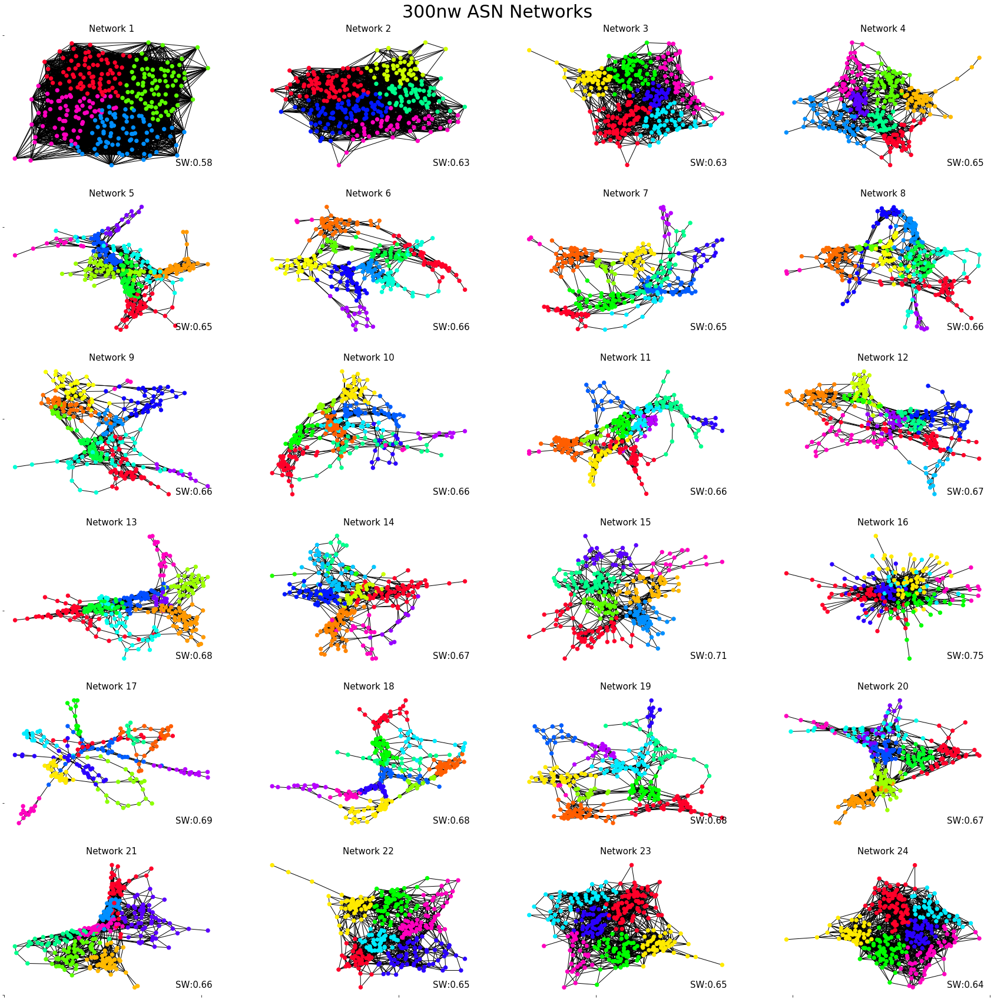

In [26]:
### MODULARITY
from community import community_louvain

fig1=plt.figure(figsize=(30,30))

ax=[None]*len(ASN300)
axBig = fig1.add_subplot(111)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
plt.title('300nw ASN Networks',fontsize=30,pad=30)
# plt.xlabel('PCoeff',fontsize=30,labelpad=15)
# plt.ylabel('MZ',fontsize=30,labelpad=15)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1)
    g=ASN300[i]['G']
    ax[i].set_title('Network ' + str(i+1),fontsize=15)
    partition = community_louvain.best_partition(g)
    pos = community_layout(g, partition)
    nx.draw(g, node_color=list(partition.values()),cmap=plt.cm.gist_rainbow,node_size=40);
    plt.text(0.8,0.05,'SW:'+"{0:.2f}".format(smallworld[i]),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot

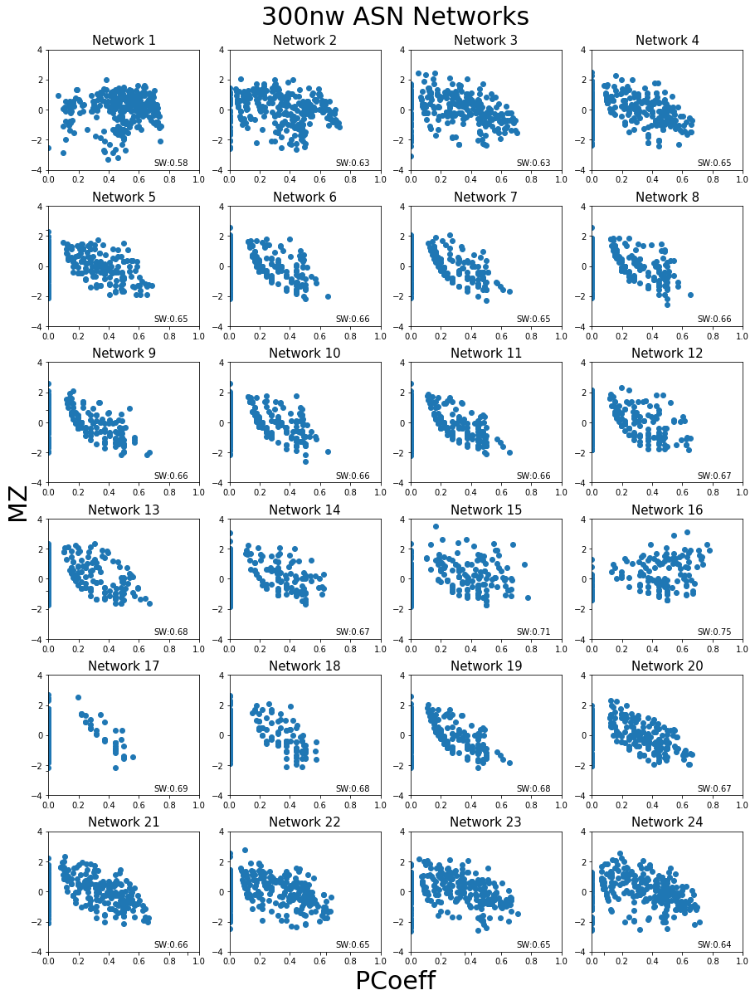

In [27]:
#Plot Participation Coefficient vs MZ
fig1=plt.figure(figsize=(15,20))

ax=[None]*numNetworks
axBig = fig1.add_subplot(111)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
plt.title('300nw ASN Networks',fontsize=30,pad=30)
plt.xlabel('PCoeff',fontsize=30,labelpad=15)
plt.ylabel('MZ',fontsize=30,labelpad=15)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1)
    fig1.subplots_adjust(hspace=.3)
    ax[i].set_title('Network ' + str(i+1),fontsize=15)
    plt.scatter(pcoeff[i],mz[i])
    plt.text(0.7,-3.7,'SW:'+"{0:.2f}".format(smallworld[i]))
    ax[i].set_ylim(-4,4)
    ax[i].set_xlim(0,1)

### C. Elegans

In [28]:
#Small world calculated on C Elegans Matrix in smallworld.m in MATLAB
temp=loadmat(r'C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Analysis\Functional Connectivity\Functional Tasks\cElegans_smallworld.mat')
smallworld_elegans=temp['cElegansSW'][0]
del temp

Text(0.7, 0.1, 'SW:0.55')

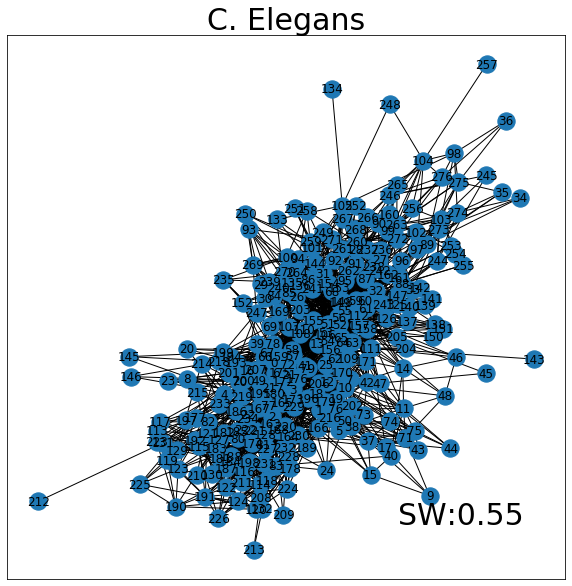

In [29]:
#Plot Networks
fig1=plt.figure(figsize=(10,10))

ax=fig1.gca()
plt.title('C. Elegans',fontsize=30)
nx.draw_networkx(elegansGraph)
plt.text(0.7,0.1,'SW:'+"{0:.2f}".format(smallworld_elegans[0]),transform=ax.transAxes,fontsize=30) #this plots Smallworldness as text in a relative position on each subplot
#     ax[i].set_ylim(-1.5,1.5)
#     ax[i].set_xlim(-1.5,1.5)

In [30]:
# Modularity, PCoeff, Small Worldness & MZ:
ci = []
pcoeff= []
mz= []

ci,q=nct.community_louvain(elegansMat)
pcoeff=bct.participation_coef(elegansMat,ci)
mz=bct.module_degree_zscore(elegansMat,ci)
Elegans['Graph Theory']['MZ']=mz
Elegans['Graph Theory']['PCoeff']=pcoeff
Elegans['Graph Theory']['Modularity']=ci
Elegans['Graph Theory']['Small World']=smallworld_elegans

(0, 1)

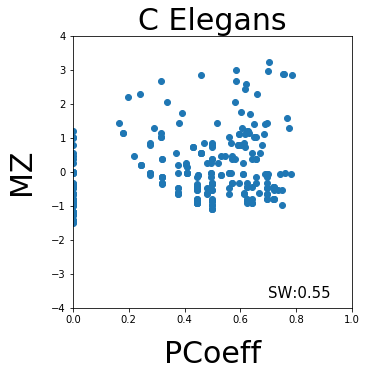

In [31]:
fig1=plt.figure(figsize=(5,5))

plt.title('C Elegans',fontsize=30)
plt.xlabel('PCoeff',fontsize=30,labelpad=15)
plt.ylabel('MZ',fontsize=30,labelpad=15)
plt.scatter(pcoeff,mz)
plt.text(0.7,-3.7,'SW:'+"{0:.2f}".format(smallworld_elegans[0]),fontsize=15)
plt.ylim(-4,4)
plt.xlim(0,1)

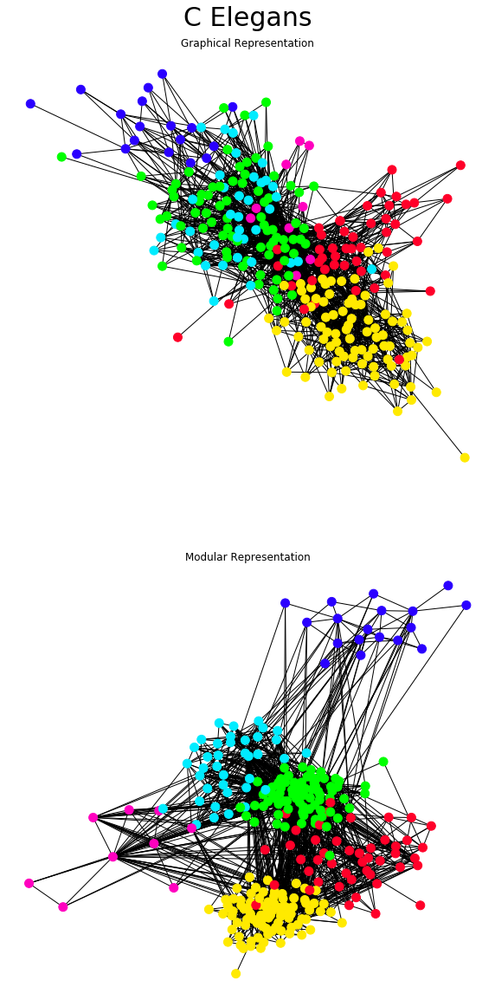

In [32]:
### MODULARITY
from community import community_louvain
fig2=plt.figure(figsize=(10,20))
plt.title('C Elegans',fontsize=30,pad=30)

ax=[None]*2
axBig = fig2.add_subplot(111)
axBig.set_yticklabels([])
plt.xticks([], [])
plt.yticks([], [])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
g=Elegans['G']
partition = community_louvain.best_partition(g)
pos = community_layout(g, partition)

ax[0]=fig2.add_subplot(2, 1, 1)
ax[0].set_title('Graphical Representation')
nx.draw(g,node_color=list(partition.values()),cmap=plt.cm.gist_rainbow,node_size=100);
ax[1]=fig2.add_subplot(2, 1, 2)
ax[1].set_title('Modular Representation')
nx.draw(g, pos,node_color=list(partition.values()),cmap=plt.cm.gist_rainbow,node_size=100);

### Watts-Strogatz Random

In [33]:
temp=loadmat(r'C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Analysis\Functional Connectivity\Functional Tasks\300_WS_smallworld.mat')
smallworld_random=temp['smallworld_random'][0]
del temp

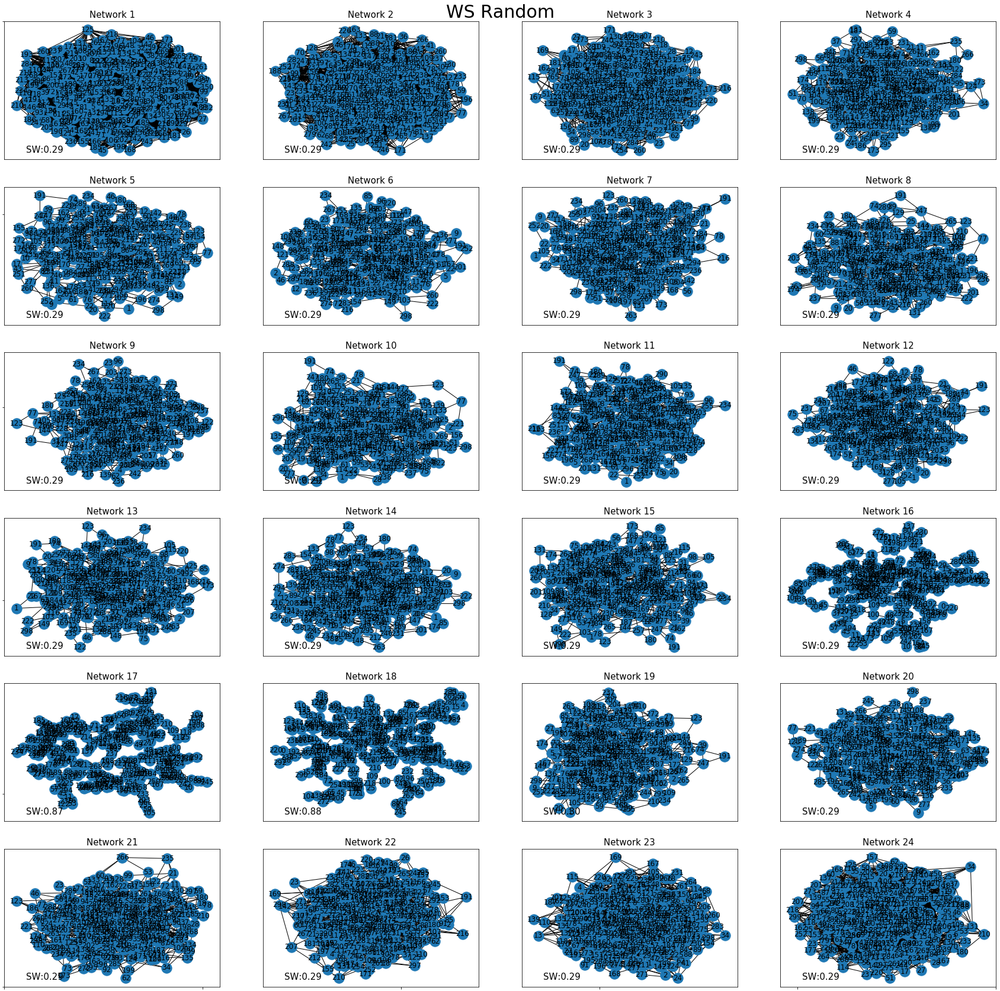

In [34]:
#Plot Networks
fig1=plt.figure(figsize=(30,30))

ax=[None]*len(WS_Random)
axBig = fig1.add_subplot(111)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
plt.title('WS Random',fontsize=30)
# plt.xlabel('PCoeff',fontsize=30,labelpad=15)
# plt.ylabel('MZ',fontsize=30,labelpad=15)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1)
    ax[i].set_title('Network ' + str(i+1),fontsize=15)
    nx.draw_networkx(WS_Random[i]['G'])
    plt.text(0.1,0.05,'SW:'+"{0:.2f}".format(smallworld_random[i]),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot
#     ax[i].set_ylim(-1.5,1.5)
#     ax[i].set_xlim(-1.5,1.5)

In [189]:
# Modularity, PCoeff, Small Worldness & MZ:
ci = [None]*len(WS_Random)
pcoeff= [None]*len(WS_Random)
mz= [None]*len(WS_Random)

for i in range(len(WS_Random)):
    adjmat=np.asarray(WS_Random[i]['adj_matrix'].todense().astype(float))
    ci[i],q=nct.community_louvain(adjmat)
    pcoeff[i]=bct.participation_coef(adjmat,ci[i])
    mz[i]=bct.module_degree_zscore(adjmat,ci[i])
    WS_Random[i]['Graph Theory']['Modularity']=ci[i]
    WS_Random[i]['Graph Theory']['PCoeff']=pcoeff[i]
    WS_Random[i]['Graph Theory']['MZ']=mz[i]
    WS_Random[i]['Graph Theory']['Small World']=smallworld_random[i]

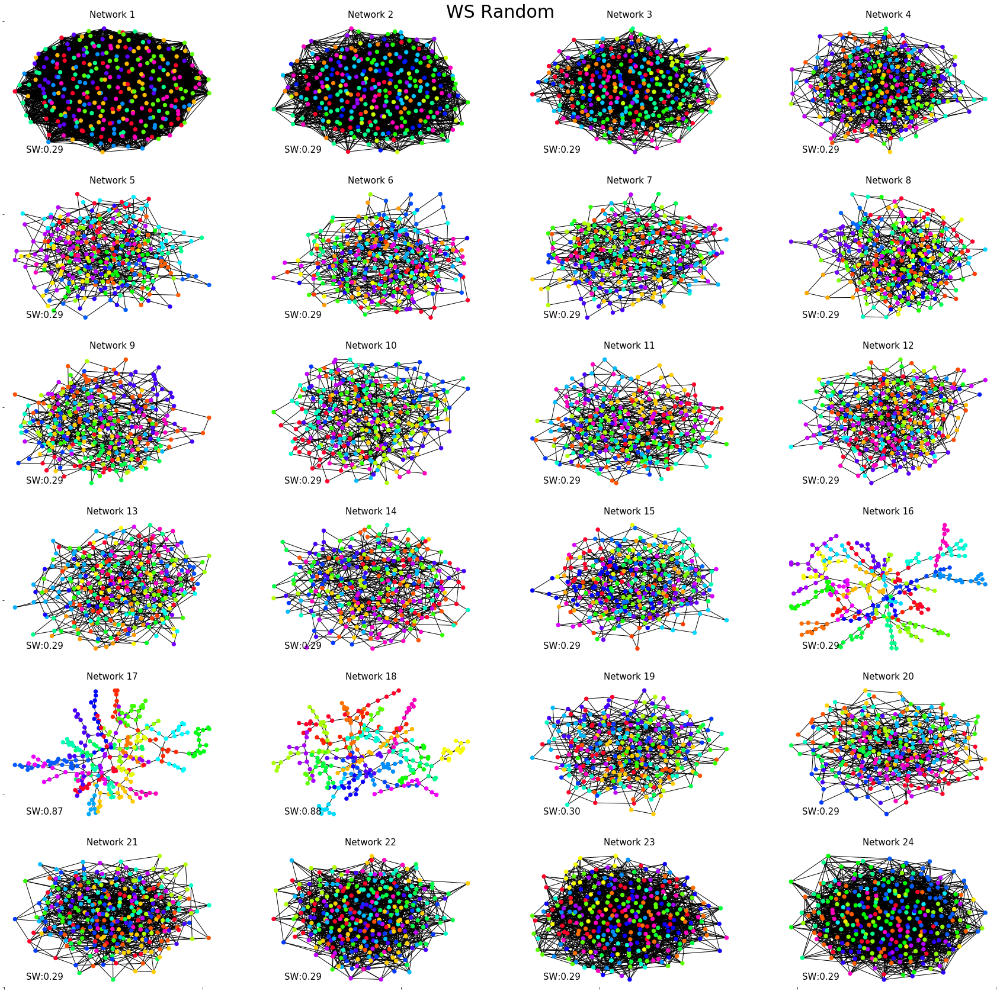

In [36]:
### MODULARITY
from community import community_louvain

fig1=plt.figure(figsize=(30,30))

ax=[None]*len(WS_Random)
axBig = fig1.add_subplot(111)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
plt.title('WS Random',fontsize=30)
# plt.xlabel('PCoeff',fontsize=30,labelpad=15)
# plt.ylabel('MZ',fontsize=30,labelpad=15)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1)
    g=WS_Random[i]['G']
    ax[i].set_title('Network ' + str(i+1),fontsize=15)
    partition = community_louvain.best_partition(g)
    pos = community_layout(g, partition)
    nx.draw(g, node_color=list(partition.values()),cmap=plt.cm.gist_rainbow,node_size=40);
    plt.text(0.1,0.05,'SW:'+"{0:.2f}".format(smallworld_random[i]),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot

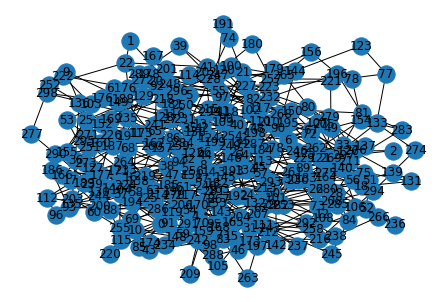

In [37]:
nx.draw(WS_Random[6]['G'],with_labels=True)

### Watts-Strogatz Grid

In [38]:
temp=loadmat(r'C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Analysis\Functional Connectivity\Functional Tasks\300_WS_smallworld.mat')
smallworld_grid=temp['smallworld_grid'][0]
del temp

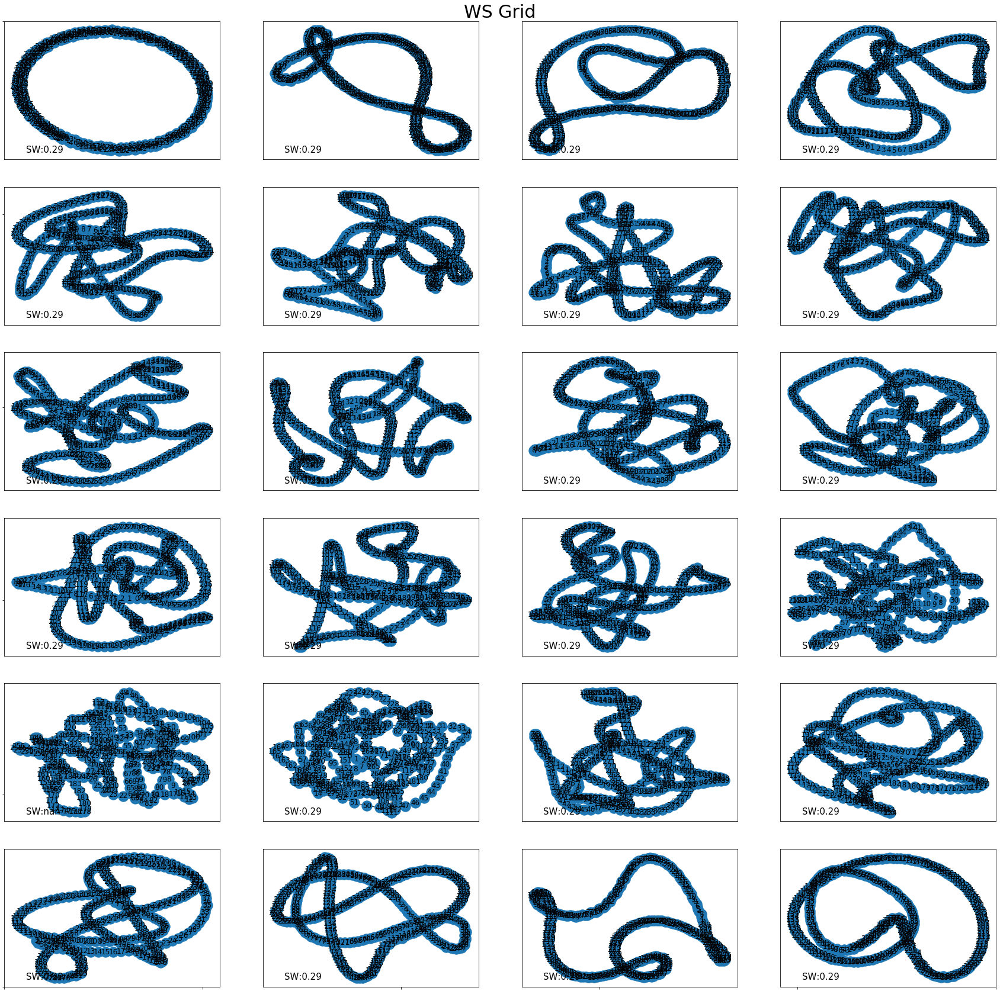

In [39]:
#Plot Networks
fig1=plt.figure(figsize=(30,30))

ax=[None]*len(WS_Random)
axBig = fig1.add_subplot(111)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
plt.title('WS Grid',fontsize=30)
# plt.xlabel('PCoeff',fontsize=30,labelpad=15)
# plt.ylabel('MZ',fontsize=30,labelpad=15)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1)
    nx.draw_networkx(WS_Grid[i]['G'])
    plt.text(0.1,0.05,'SW:'+"{0:.2f}".format(smallworld_grid[i]),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot
#     ax[i].set_ylim(-1.5,1.5)
#     ax[i].set_xlim(-1.5,1.5)

In [190]:
# Modularity, PCoeff, Small Worldness & MZ:
ci = [None]*len(WS_Grid)
pcoeff= [None]*len(WS_Grid)
mz= [None]*len(WS_Grid)

for i in range(len(WS_Grid)):
    adjmat=np.asarray(WS_Grid[i]['adj_matrix'].todense().astype(float))
    ci[i],q=nct.community_louvain(adjmat)
    pcoeff[i]=bct.participation_coef(adjmat,ci[i])
    mz[i]=bct.module_degree_zscore(adjmat,ci[i])
    WS_Grid[i]['Graph Theory']['Modularity']=ci[i]
    WS_Grid[i]['Graph Theory']['PCoeff']=pcoeff[i]
    WS_Grid[i]['Graph Theory']['MZ']=mz[i]
    WS_Grid[i]['Graph Theory']['Small World']=smallworld_grid[i]

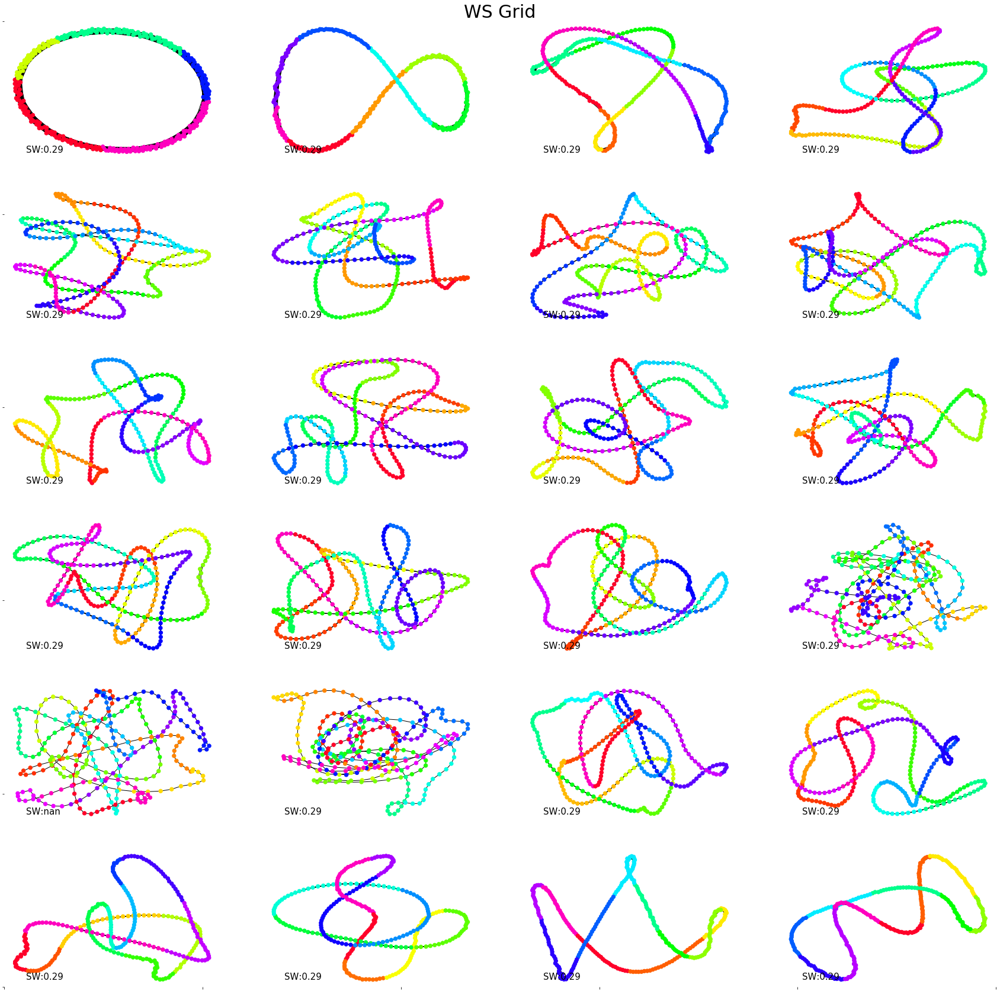

In [41]:
### MODULARITY
from community import community_louvain

fig1=plt.figure(figsize=(30,30))

ax=[None]*len(WS_Grid)
axBig = fig1.add_subplot(111)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
plt.title('WS Grid',fontsize=30)
# plt.xlabel('PCoeff',fontsize=30,labelpad=15)
# plt.ylabel('MZ',fontsize=30,labelpad=15)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1)
    g=WS_Grid[i]['G']

    partition = community_louvain.best_partition(g)
    pos = community_layout(g, partition)
    nx.draw(g, node_color=list(partition.values()),cmap=plt.cm.gist_rainbow,node_size=40);
    plt.text(0.1,0.05,'SW:'+"{0:.2f}".format(smallworld_grid[i]),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot

In [42]:
smallworld_grid

array([0.29289322, 0.29289322, 0.29289322, 0.29289322, 0.29289322,
       0.29289322, 0.29289322, 0.29289322, 0.29289322, 0.29289322,
       0.29289322, 0.29289322, 0.29289322, 0.29289322, 0.29289322,
       0.29289322,        nan, 0.29289322, 0.29289322, 0.29289322,
       0.29289322, 0.29289322, 0.29289322, 0.29289322])

In [43]:
smallworld

array([0.57881351, 0.63441604, 0.6314505 , 0.64722678, 0.65354199,
       0.6614191 , 0.65427676, 0.65531078, 0.65787848, 0.65716374,
       0.66166765, 0.67282647, 0.67825795, 0.67404955, 0.70858706,
       0.75475495, 0.6857322 , 0.67688921, 0.6825291 , 0.67046343,
       0.66105078, 0.64565472, 0.64770291, 0.6409797 ])

# Task 1: Linear  Transformation

In [44]:
#Regression
def NOKEVregression(target,absV): 
    inputx=np.vstack((np.ones(len(target)),absV)).T
    a1=np.linalg.lstsq(inputx,target)
    return a1

In [55]:
#Subgraph AdjMat
def getOnGraph(network, this_TimeStamp = 0):
    edgeList = network.connectivity.edge_list
    adjMat = np.zeros((network.numOfWires, network.numOfWires))
    adjMat[edgeList[:,0], edgeList[:,1]] = network.junctionSwitch[this_TimeStamp,:]
    adjMat[edgeList[:,1], edgeList[:,0]] = network.junctionSwitch[this_TimeStamp,:]
    onGraph = nx.from_numpy_array(adjMat)
    
    return onGraph

In [56]:
#Communicability + Current Matrices
def commCurr(sim):

    currMat = np.zeros((sim.numOfWires,sim.numOfWires))
    edgeList = sim.connectivity.edge_list
    currMat[edgeList[:,0], edgeList[:,1]] = sim.junctionVoltage[-1,:]/sim.junctionResistance[-1,:]
    currMat = currMat + currMat.T
    currGraph = nx.from_numpy_array(currMat)
    subGraph = getOnGraph(sim, sim.TimeVector.size-1)

    components = [i for i in nx.connected_components(subGraph)]

    max_ind = np.argmax([len(i) for i in nx.connected_components(subGraph)])
    currGraph = nx.subgraph(currGraph, components[max_ind])
    currGraph = nx.from_numpy_array(nx.adjacency_matrix(currGraph).todense())
    currMat = np.array(nx.adjacency_matrix(currGraph).todense())

    commu = nx.communicability(currGraph)
    subSize = len(currGraph)
    commu_Mat = np.array([commu[k][j] for k in range(subSize) for j in range(subSize)]).reshape(subSize,subSize)
    
    return commu_Mat, currMat

## ASN Networks:

In [61]:
#Instantiate Variables       
stimulus=[[],[]]
accSqu=[]
#    accTri=[]
#    accSaw=[]
#    accDbl=[]
maxSqu=[]
#    maxTri=[]
#    maxSaw=[]
#    maxDbl=[]
dt = 1e-2
f=0.5
Time=5
onAmp=[1.5,2,4,4,6,6,8,6,6,6,6,6,4,4,4,4,6,4,4,4,4,3,2,1.5]

#Choose Electrode Pattern
for i in range(len(onAmp)):
    stimulus[0].append((stimulus__(biasType='AC',onAmp=onAmp[i],TimeVector=np.arange(0,Time,dt),f=f)))
    stimulus[1].append((stimulus__(biasType='Drain',TimeVector=np.arange(0,Time,dt)))) #we don't want this drain to be active during training
    
#Initialise Output Variables
period=[]
TimeVector=[]
voltage=[]
conductance=[]
switches=[]
results=[None]*len(ASN300)
ResultSqu=[None]*len(ASN300)

# Voltage=[None]*len(ASN300)
# Switches=[None]*len(ASN300)



nodesList=[None]*len(ASN300)
#Run Simulations
for i in range(len(ASN300)): #for each network
    nwSqu = []
    print('Network ' + str(i))
    #Run Simulations
#     results=[]
    # Connectivity=connectivity__('700nw_14533junctions.mat')
    stimulus2 = [item for item in stimulus] #go through each list in the list and find the ith item
#     set_trace()
    results[i]=runSim(connectivity__(wires_dict=ASN300[i]),stimulus=stimulus2, contactMode='farthest', T = Time, dt = 0.001, onAmp = onAmp[i], biasType='AC',f=f,junctionMode='tunneling')
    #wires_dict=newNetworkTest[chosenNetwork])
    results[i].frequency=f
    results[i].dt=0.001
    period=1/f

    TimeVector=results[i].TimeVector
    voltage=results[i].wireVoltage
    conductance=results[i].conductance
    switches=results[i].junctionSwitch

    stepNodes=len(ASN300[i])-1 #first use all nodes
    sizes2=len(ASN300[i])
    nwOutputs = [None]* int(sizes2/stepNodes)
            
    outputNodes2=[]

    for k in range(stepNodes,sizes2+1,stepNodes): #stepping up nodes
        np.random.seed(69)

        outputNodes2.append(voltage[:,np.random.choice(len(voltage[0,:]),size=k,replace=False)]) #take all the times (:) for a random j nodes

        nwOutputs=outputNodes2 #Length of nwOutputs is k (list)

    target1=[None]*len(nwOutputs)
    target2=[None]*len(nwOutputs)
    target3=[None]*len(nwOutputs)
    target4=[None]*len(nwOutputs)
    target5=[None]*len(nwOutputs)

    for j in range(len(nwOutputs)):
        target1[j] = (onAmp[i] * (-np.sign(TimeVector % period - period/2)))
        target2[j] = (4*onAmp[i]/period * abs((TimeVector-period/4) % period - period/2) - onAmp[i])
        target3[j] = (onAmp[i]/period * (TimeVector % period))
        target4[j] = (onAmp[i]*np.sin(4*np.pi*(1/period)*TimeVector))


#        nwTri     = np.zeros(len(nwOutputs))
#        nwSaw     = np.zeros(len(nwOutputs))
#        nwDbl     = np.zeros(len(nwOutputs))
#     nwMG      = [[None]*networksLoad,[None]*len(nwOutputs[0])]

#        ResultTri=[]
#        ResultSaw=[]
    accuracy=[]
#        accuracyTri=[]
#        accuracySaw=[]
#        accuracyDbl=[]
    output=[]
    mSqu=[]
#        mTri=[]
#        mSaw=[]
#        mDbl=[]
    
    if len(ASN300[i]['G']) >= 250:
        nodesList[i]=[50,100,150,200,250,len(ASN300[i]['G'])]#range(50, len(ws300[i][0])+1,50)
    elif len(ASN300[i]['G']) >= 200 and len(ASN300[i]['G']) < 250:
        nodesList[i]=[50,100,150,200,len(ASN300[i]['G'])]#range(50, len(ws300[i][0])+1,50)  
    elif len(ASN300[i]['G']) >= 150 and len(ASN300[i]['G']) < 200:
        nodesList[i]=[50,100,150,len(ASN300[i]['G'])]#range(50, len(ws300[i][0])+1,50)  
    elif len(ASN300[i]['G']) >= 100 and len(ASN300[i]['G']) < 150:
        nodesList[i]=[50,100,len(ASN300[i]['G'])]#range(50, len(ws300[i][0])+1,50)  
                     
#     set_trace()

    for j in nodesList[i]: #range(50, len(ws300[i][0])+1,50): #loop through sets of nodes 
        print('Running Regression: ' + str(j) + ' nodes')
        ResultSqu=[]
        ResultSqu = nonLinearTrans(results[i],'Square',j, repeats=50) #simulation, type of signal, number of nodes to sample from, number of linear regression repetitions (take avg)
    # OLD WAY: NOKEVregression(target1[j],nwOutputs[j].T)[0]
    # OLD WAY: outputx=np.vstack((np.ones(len(target1[j])),nwOutputs[j].T)).T
    # temp=np.dot(outputx,ResultSqu)
    # MSE=np.mean((target1[j]-temp)**2)
    # rnMSE=np.sqrt(np.sum((target1[j]-temp)**2)/np.sum((target1[j])**2))
        nwSqu.append(ResultSqu['accuracy'])       
    ASN300[i]['Accuracy']['Linear Transformation']=nwSqu

Network 0


2020-03-26 13:57:26,056:INFO:First current path [183, 57, 37, 280, 97] formed at time = 0.474 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Network 1


2020-03-26 13:57:54,894:INFO:First current path [272, 132, 151, 161, 74, 57, 183] formed at time = 0.512 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Network 2


2020-03-26 13:58:16,699:INFO:First current path [58, 188, 278, 70, 295, 101, 81, 272, 132] formed at time = 0.422 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Network 3


2020-03-26 13:58:38,087:INFO:First current path [182, 202, 289, 14, 11, 129, 128, 247, 278, 81, 209, 270, 132] formed at time = 0.543 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Network 4


2020-03-26 13:59:11,006:INFO:First current path [97, 281, 253, 132, 62, 98, 189, 173, 77, 164, 68, 288, 201, 181] formed at time = 0.434 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 295 nodes
Network 5


2020-03-26 13:59:38,123:INFO:First current path [149, 179, 152, 225, 195, 35, 236, 15, 165, 287, 32, 191, 173, 24, 89, 145, 196] formed at time = 0.478 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 291 nodes
Network 6


2020-03-26 14:00:10,313:INFO:First current path [149, 179, 152, 147, 168, 59, 265, 132, 204, 39, 19, 13, 92, 206, 220, 198, 178] formed at time = 0.412 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 291 nodes
Network 7


2020-03-26 14:00:45,785:INFO:First current path [149, 179, 152, 147, 168, 59, 265, 132, 204, 39, 106, 13, 92, 206, 220, 198, 178] formed at time = 0.492 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 291 nodes
Network 8


2020-03-26 14:01:09,321:INFO:First current path [56, 111, 29, 92, 13, 174, 216, 49, 81, 199, 191, 32, 287, 130, 250, 277, 255] formed at time = 0.476 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 291 nodes
Network 9


2020-03-26 14:01:33,259:INFO:First current path [197, 103, 168, 203, 172, 141, 117, 232, 143, 201, 257, 60, 173, 12, 89, 145, 196] formed at time = 0.475 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 291 nodes
Network 10


2020-03-26 14:01:59,490:INFO:First current path [149, 179, 152, 225, 195, 35, 236, 15, 165, 287, 32, 191, 173, 24, 89, 145, 196] formed at time = 0.478 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 291 nodes
Network 11


2020-03-26 14:02:20,178:INFO:First current path [56, 111, 29, 238, 235, 75, 132, 73, 186, 93, 247, 97, 61, 130, 250, 277, 96] formed at time = 0.476 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 290 nodes
Network 12


2020-03-26 14:02:41,088:INFO:First current path [147, 177, 100, 166, 22, 192, 140, 69, 215, 255, 171, 11, 87, 143, 194] formed at time = 0.567 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 288 nodes
Network 13


2020-03-26 14:03:01,469:INFO:First current path [150, 179, 153, 225, 242, 2, 97, 192, 279, 258, 174, 13, 89, 146, 195] formed at time = 0.562 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 291 nodes
Network 14


2020-03-26 14:03:22,450:INFO:First current path [51, 249, 154, 18, 119, 96, 67, 68, 142, 90, 260] formed at time = 0.45 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 271 nodes
Network 15


2020-03-26 14:03:48,420:INFO:First current path [6, 68, 43, 138, 24, 81, 94] formed at time = 0.343 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 199 nodes
Network 16


2020-03-26 14:04:10,710:INFO:First current path [204, 191, 199, 40, 178, 78, 58, 84, 74, 121, 150, 185, 5, 88, 112, 147, 207, 177, 104, 86, 81, 102, 218, 8, 94, 108, 10, 33, 152, 27] formed at time = 0.75 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 224 nodes
Network 17


2020-03-26 14:04:36,918:INFO:First current path [129, 138, 167, 141, 207, 221, 85, 127, 108, 52, 115, 180, 224, 185, 197, 25, 253, 3, 101, 98] formed at time = 0.735 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 266 nodes
Network 18


2020-03-26 14:05:00,834:INFO:First current path [149, 179, 152, 225, 195, 35, 236, 15, 165, 287, 32, 191, 173, 12, 89, 145, 196] formed at time = 0.638 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 291 nodes
Network 19


2020-03-26 14:05:22,078:INFO:First current path [97, 281, 253, 132, 62, 98, 196, 117, 142, 273, 186, 288, 201, 181] formed at time = 0.568 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 295 nodes
Network 20


2020-03-26 14:05:58,490:INFO:First current path [57, 84, 39, 175, 150, 166, 250, 116, 231, 281, 97] formed at time = 0.463 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 295 nodes
Network 21


2020-03-26 14:06:31,726:INFO:First current path [132, 271, 209, 81, 152, 116, 253, 134, 76, 84, 57, 182] formed at time = 0.64 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Network 22


2020-03-26 14:07:09,160:INFO:First current path [58, 65, 179, 21, 161, 116, 126, 272, 132] formed at time = 0.655 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Network 23


2020-03-26 14:07:50,084:INFO:Unfortunately, no current path is formed in simulation time.


Unfortunately, only 0 current paths found in simulation time.
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


In [67]:
#Current and Communicability Matrices:
commuMatASN=[None]*len(results)
currMatASN=[None]*len(results)
for i in tqdm(range(len(results))):
    commuMatASN[i],currMatASN[i]=commCurr(results[i])

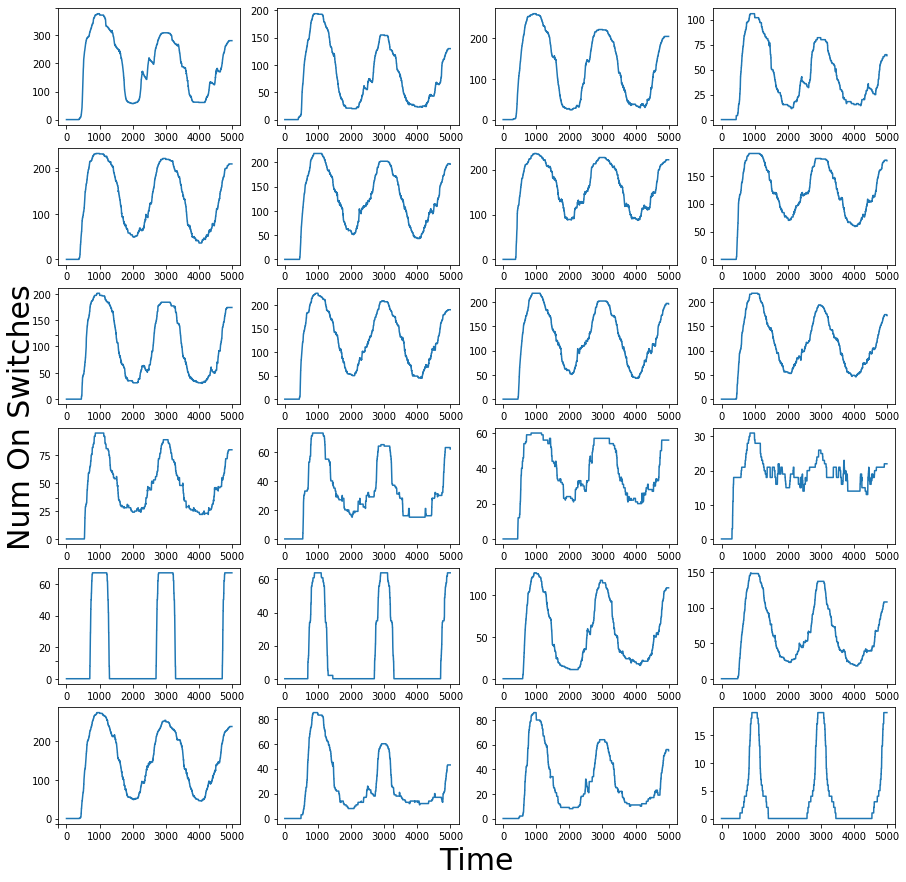

In [68]:
#network junctions switches:
fig1=plt.figure(figsize=(15,15))
ax=[None]*numNetworks
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
plt.xlabel('Time',fontsize=30,labelpad=15)
plt.ylabel('Num On Switches',fontsize=30,labelpad=15)
for i in range(numNetworks):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1)
    plt.plot(np.sum(results[i].junctionSwitch,1))
    #votlage as title 

## WS Networks

In [69]:
#Instantiate Variables       
stimulus=[[],[]]
accSqu=[]
#    accTri=[]
#    accSaw=[]
#    accDbl=[]
maxSqu=[]
#    maxTri=[]
#    maxSaw=[]
#    maxDbl=[]
dt = 1e-2
f=0.5
Time=5
onAmp=[2,2,4,8,8,10,10,10,10,10,10,10,8,8,8,8,8,8,8,4,4,3,2,1.5]

#Choose Electrode Pattern
for i in range(len(onAmp)):
    stimulus[0].append((stimulus__(biasType='AC',onAmp=onAmp[i],TimeVector=np.arange(0,Time,dt),f=f)))
    stimulus[1].append((stimulus__(biasType='Drain',TimeVector=np.arange(0,Time,dt)))) #we don't want this drain to be active during training
    
#Initialise Output Variables
period=[]
TimeVector=[]
voltage=[]
conductance=[]
switches=[]
results_grid=[None]*len(ws300)
results_rand=[None]*len(ws300)

#        nwTri     = np.zeros(len(nwOutputs))
#        nwSaw     = np.zeros(len(nwOutputs))
#        nwDbl     = np.zeros(len(nwOutputs))
#     nwMG      = [[None]*networksLoad,[None]*len(nwOutputs[0])]


#Run Simulations
for i in range(len(ws300)): #for each network
    nwSqu_grid = []
    nwSqu_rand = []
    print('Network ' + str(i))
    #Run Simulations
#     results=[]
    # Connectivity=connectivity__('700nw_14533junctions.mat')
    stimulus2 = [item for item in stimulus] #go through each list in the list and find the ith item
#     set_trace()
    # GRID WS:
    print('Grid')
    results_grid[i]=runSim(connectivity__(graph=ws300[i][0]),stimulus=stimulus2, contactMode='farthest', T = Time, dt = 0.001, onAmp = onAmp[i], biasType='AC',f=f,junctionMode='tunneling')
    # RANDOM WS:
    print('Random')
    results_rand[i]=runSim(connectivity__(graph=ws300[i][1]),stimulus=stimulus2, contactMode='farthest', T = Time, dt = 0.001, onAmp = onAmp[i], biasType='AC',f=f,junctionMode='tunneling')
    # Small World WS:
    # 
    
    results_grid[i].frequency=f
    results_rand[i].frequency=f
    results_grid[i].dt=0.001
    results_rand[i].dt=0.001
    period=1/f

    TimeVector_grid=results_grid[i].TimeVector
    voltage_grid=results_grid[i].wireVoltage
    conductance_grid=results_grid[i].conductance
    switches_grid=results_grid[i].junctionSwitch
    
    TimeVector_rand=results_rand[i].TimeVector
    voltage_rand=results_rand[i].wireVoltage
    conductance_rand=results_rand[i].conductance
    switches_rand=results_rand[i].junctionSwitch

    stepNodes=len(ws300[i][0])-1 #first use all nodes
    sizes2=len(ws300[i][0])
    nwOutputs = [None]* int(sizes2/stepNodes)
            
    outputNodes2_grid=[]
    outputNodes2_rand=[]
    
    for k in range(stepNodes,sizes2+1,stepNodes): #stepping up nodes
        np.random.seed(69)

        outputNodes2_grid.append(voltage_grid[:,np.random.choice(len(voltage_grid[0,:]),size=k,replace=False)]) #take all the times (:) for a random j nodes
        outputNodes2_rand.append(voltage_rand[:,np.random.choice(len(voltage_rand[0,:]),size=k,replace=False)]) #take all the times (:) for a random j nodes
        nwOutputs_grid=outputNodes2_grid #Length of nwOutputs is k (list)
        nwOutputs_rand=outputNodes2_rand

    target1=[None]*len(outputNodes2_rand)
#     target2=[None]*len(nwOutputs)
#     target3=[None]*len(nwOutputs)
#     target4=[None]*len(nwOutputs)
#     target5=[None]*len(nwOutputs)

    for j in range(len(nwOutputs)):
        target1[j] = (onAmp[i] * (-np.sign(TimeVector_grid % period - period/2)))
#         target2[j] = (4*onAmp[i]/period * abs((TimeVector-period/4) % period - period/2) - onAmp[i])
#         target3[j] = (onAmp[i]/period * (TimeVector % period))
#         target4[j] = (onAmp[i]*np.sin(4*np.pi*(1/period)*TimeVector))

    ResultSqu_grid=[]
    ResultSqu_rand=[]
#        ResultTri=[]
#        ResultSaw=[]
    accuracy=[]
#        accuracyTri=[]
#        accuracySaw=[]
#        accuracyDbl=[]
    output=[]
    
    #change this to number of nodes for ws300
#     if len(ws300[i]['G']) >= 250:
#         nodesList=[50,100,150,200,250,len(ws300[i]['G'])]#range(50, len(ws300[i][0])+1,50)
#     elif len(ws300[i]['G']) >= 200 and len(ws300[i]['G']) < 250:
#         nodesList=[50,100,150,200,len(ws300[i]['G'])]#range(50, len(ws300[i][0])+1,50)  
#     elif len(ws300[i]['G']) >= 150 and len(ws300[i]['G']) < 200:
#         nodesList=[50,100,150,len(ws300[i]['G'])]#range(50, len(ws300[i][0])+1,50)  
#     elif len(ws300[i]['G']) >= 100 and len(ws300[i]['G']) < 150:
#         nodesList=[50,100,len(ws300[i]['G'])]#range(50, len(ws300[i][0])+1,50)  
                     
    nodesListWS=[50, 100, 150, 200, 250, 300]
    for j in range(50, len(ws300[i][0])+1,50): #loop through sets of nodes 
        print('Running Regression: ' + str(j) + ' nodes')
        print(' ')
        ResultSqu_grid=nonLinearTrans(results_grid[i],'Square',j, repeats=50)#NOKEVregression(target1[j],nwOutputs_grid[j].T)[0]
        ResultSqu_rand=nonLinearTrans(results_rand[i],'Square',j, repeats=50)#NOKEVregression(results_rand[j],nwOutputs_rand[j].T)[0]
        
#         outputx_grid=np.vstack((np.ones(len(target1[j])),nwOutputs_grid[j].T)).T
#         outputx_rand=np.vstack((np.ones(len(target1[j])),nwOutputs_rand[j].T)).T
        
#         temp=np.dot(outputx_grid,ResultSqu_grid)
#         temp2=np.dot(outputx_rand,ResultSqu_rand)
        
#         MSE=np.mean((target1[j]-temp)**2)
#         MSE2=np.mean((target1[j]-temp2)**2)
        
#         rnMSE=np.sqrt(np.sum((target1[j]-temp)**2)/np.sum((target1[j])**2))
#         rnMSE2=np.sqrt(np.sum((target1[j]-temp2)**2)/np.sum((target1[j])**2))
        nwSqu_grid.append(ResultSqu_grid['accuracy'])#(1 - rnMSE)
        nwSqu_rand.append(ResultSqu_rand['accuracy'])#(1 - rnMSE2)
        #set_trace()
    WS_Random[i]['Accuracy']['Linear Transformation']=nwSqu_rand
    WS_Grid[i]['Accuracy']['Linear Transformation']=nwSqu_grid

Network 0
Grid


2020-03-26 14:32:09,821:INFO:First current path [0, 10, 29, 48, 67, 86, 105, 124, 135] formed at time = 0.615 s.


Random


2020-03-26 14:32:19,499:INFO:First current path [0, 111, 266, 138] formed at time = 0.331 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 1
Grid


2020-03-26 14:32:52,949:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:33:01,053:INFO:First current path [0, 4, 126, 8] formed at time = 0.33 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 2
Grid


2020-03-26 14:33:50,507:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:33:59,677:INFO:First current path [0, 3, 61, 148, 51] formed at time = 0.265 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 3
Grid


2020-03-26 14:34:36,117:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:34:43,266:INFO:First current path [223, 156, 297, 18, 90, 144, 123] formed at time = 0.231 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 4
Grid


2020-03-26 14:35:20,807:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:35:27,494:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.247 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 5
Grid


2020-03-26 14:36:05,644:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:36:12,573:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.219 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 6
Grid


2020-03-26 14:36:48,668:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:36:55,656:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.219 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 7
Grid


2020-03-26 14:37:33,412:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:37:40,902:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.219 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 8
Grid


2020-03-26 14:38:17,054:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:38:24,213:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.219 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 9
Grid


2020-03-26 14:38:58,110:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:39:05,457:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.219 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 10
Grid


2020-03-26 14:39:43,056:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:39:50,219:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.219 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 11
Grid


2020-03-26 14:40:29,545:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:40:36,415:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.219 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 12
Grid


2020-03-26 14:41:12,825:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:41:20,556:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.247 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 13
Grid


2020-03-26 14:41:58,076:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:42:05,239:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.247 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 14
Grid


2020-03-26 14:42:39,418:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:42:46,744:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.247 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 15
Grid


2020-03-26 14:43:32,585:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:43:40,337:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 16
Grid


2020-03-26 14:44:14,774:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:44:21,618:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 17
Grid


2020-03-26 14:44:58,297:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:45:05,423:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 18
Grid


2020-03-26 14:45:41,748:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:45:48,232:INFO:First current path [0, 147, 155, 68, 151, 35, 103, 298] formed at time = 0.247 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 19
Grid


2020-03-26 14:46:22,672:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:46:29,478:INFO:First current path [0, 220, 69, 225, 38, 271, 103, 298] formed at time = 0.36 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 20
Grid


2020-03-26 14:47:06,133:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:47:12,432:INFO:First current path [223, 156, 297, 18, 90, 144, 123] formed at time = 0.336 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 21
Grid


2020-03-26 14:47:50,378:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:47:57,836:INFO:First current path [18, 162, 170, 287, 26, 143] formed at time = 0.352 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 22
Grid


2020-03-26 14:48:42,970:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:48:50,026:INFO:First current path [0, 3, 61, 148, 51] formed at time = 0.39 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 
Network 23
Grid


2020-03-26 14:49:23,444:INFO:Unfortunately, no current path is formed in simulation time.



Unfortunately, only 0 current paths found in simulation time.
Random


2020-03-26 14:49:31,488:INFO:First current path [1, 129, 195, 17, 264] formed at time = 0.465 s.



Running Regression: 50 nodes
 
Running Regression: 100 nodes
 
Running Regression: 150 nodes
 
Running Regression: 200 nodes
 
Running Regression: 250 nodes
 
Running Regression: 300 nodes
 


In [71]:
#Current and Communicability Matrices
currMatGrid=[None]*len(results_grid)
commuMatGrid=[None]*len(results_grid)
currMatRandom=[None]*len(results_rand)
commuMatRandom=[None]*len(results_rand)
for i in tqdm(range(len(results_grid))):
    commuMatGrid[i],currMatGrid[i]=commCurr(results_grid[i])
    commuMatRandom[i],currMatRandom[i]=commCurr(results_rand[i])

### Unpacking Simulations (WS)

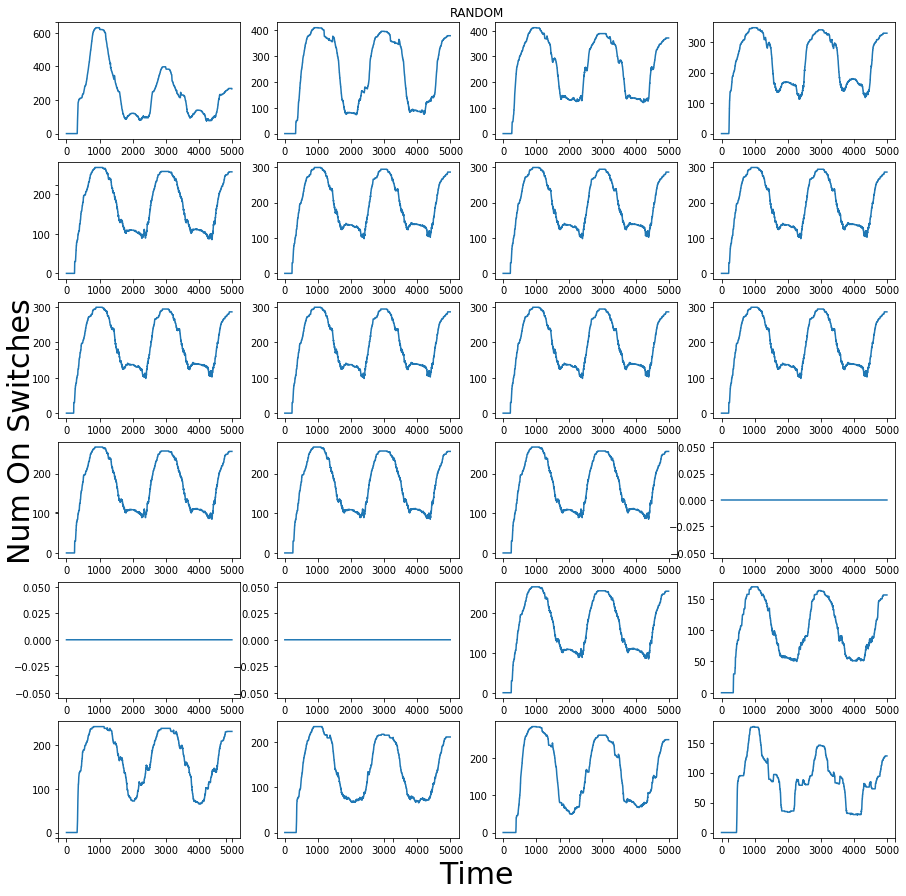

In [72]:
#network junctions switches:
fig1=plt.figure(figsize=(15,15))
plt.title('RANDOM')
ax=[None]*numNetworks
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
plt.xlabel('Time',fontsize=30,labelpad=15)
plt.ylabel('Num On Switches',fontsize=30,labelpad=15)
for i in range(numNetworks):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1)
    plt.plot(np.sum(results_rand[i].junctionSwitch,1))

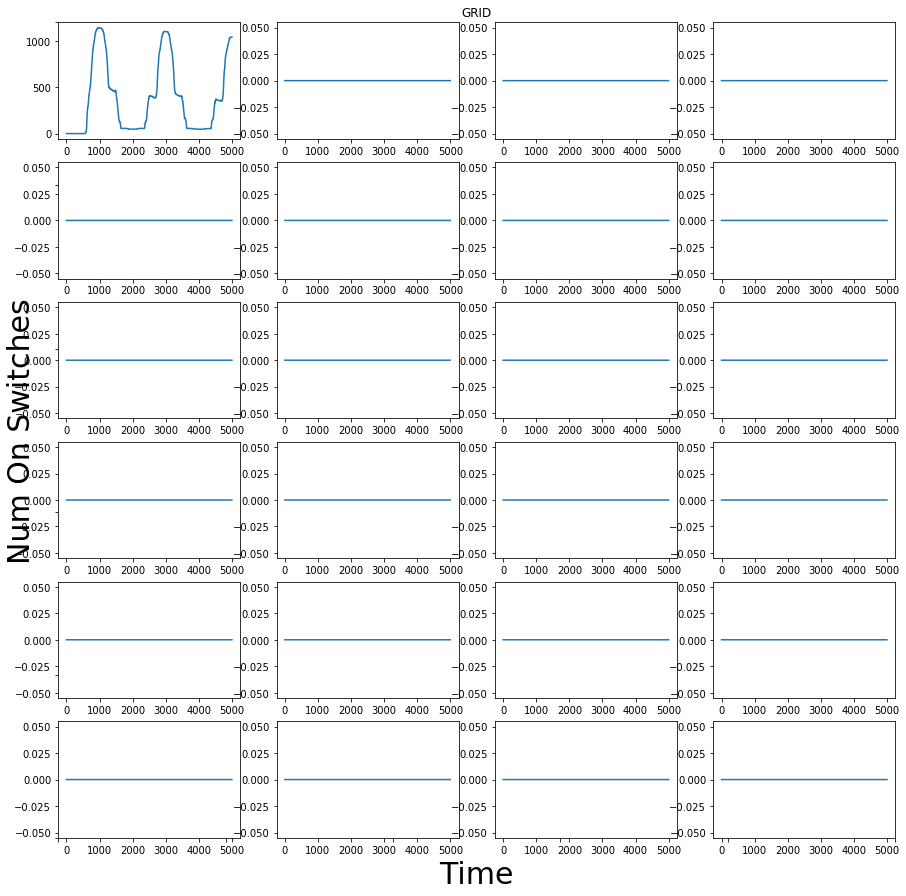

In [73]:
#network junctions switches:
fig1=plt.figure(figsize=(15,15))
plt.title('GRID')
ax=[None]*numNetworks
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
plt.xlabel('Time',fontsize=30,labelpad=15)
plt.ylabel('Num On Switches',fontsize=30,labelpad=15)
for i in range(numNetworks):
    ax[i]=fig1.add_subplot(numNetworks/4, numNetworks/6, i+1)
    plt.plot(np.sum(results_grid[i].junctionSwitch,1))

## C. Elegans

In [74]:
#Instantiate Variables       
stimulus=[[],[]]
accSqu=[]
#    accTri=[]
#    accSaw=[]
#    accDbl=[]
maxSqu=[]
#    maxTri=[]
#    maxSaw=[]
#    maxDbl=[]
dt = 1e-2
f=0.5
Time=5
onAmp=2#[1.5,2,4,4,4,6,6,6,6,6,6,6,4,4,4,4,6,4,4,4,4,3,2,1.5]

#Choose Electrode Pattern

stimulus[0].append((stimulus__(biasType='AC',onAmp=onAmp,TimeVector=np.arange(0,Time,dt),f=f)))
stimulus[1].append((stimulus__(biasType='Drain',TimeVector=np.arange(0,Time,dt)))) #we don't want this drain to be active during training

#Initialise Output Variables
period=[]
TimeVector=[]
voltage=[]
conductance=[]
switches=[]
results=[None]*len([elegansGraph])
# Voltage=[None]*len(ASN300)
# Switches=[None]*len(ASN300)


nwSqu = []*len([elegansGraph])

#Run Simulations
# for i in range(len(ASN300)): #for each network
print('Network C.Elegans')
#Run Simulations
#     results=[]
# Connectivity=connectivity__('700nw_14533junctions.mat')
stimulus2 = [item for item in stimulus] #go through each list in the list and find the ith item
#     set_trace()
results=runSim(connectivity__(graph=elegansGraph),stimulus=stimulus2, contactMode='farthest', T = Time, dt = 0.001, onAmp = onAmp, biasType='AC',f=f,junctionMode='tunneling')
#wires_dict=newNetworkTest[chosenNetwork])
results.frequency=f
results.dt=0.001
period=1/f

TimeVector=results.TimeVector
voltage=results.wireVoltage
conductance=results.conductance
switches=results.junctionSwitch

stepNodes=len(elegansGraph)-1 #first use all nodes
sizes2=len(elegansGraph)
nwOutputs = [None]* int(sizes2/stepNodes)

outputNodes2=[]

for k in range(stepNodes,sizes2+1,stepNodes): #stepping up nodes
    np.random.seed(69)

    outputNodes2.append(voltage[:,np.random.choice(len(voltage[0,:]),size=k,replace=False)]) #take all the times (:) for a random j nodes

    nwOutputs=outputNodes2 #Length of nwOutputs is k (list)

target1=[None]*len(nwOutputs)
#     target2=[None]*len(nwOutputs)
#     target3=[None]*len(nwOutputs)
#     target4=[None]*len(nwOutputs)
#     target5=[None]*len(nwOutputs)

for j in range(len(nwOutputs)):
    target1[j] = (onAmp * (-np.sign(TimeVector % period - period/2)))
#         target2[j] = (4*onAmp[i]/period * abs((TimeVector-period/4) % period - period/2) - onAmp[i])
#         target3[j] = (onAmp[i]/period * (TimeVector % period))
#         target4[j] = (onAmp[i]*np.sin(4*np.pi*(1/period)*TimeVector))


#        nwTri     = np.zeros(len(nwOutputs))
#        nwSaw     = np.zeros(len(nwOutputs))
#        nwDbl     = np.zeros(len(nwOutputs))
#     nwMG      = [[None]*networksLoad,[None]*len(nwOutputs[0])]

ResultSqu=[]
#        ResultTri=[]
#        ResultSaw=[]
accuracy=[]
#        accuracyTri=[]
#        accuracySaw=[]
#        accuracyDbl=[]
output=[]
mSqu=[]
#        mTri=[]
#        mSaw=[]
#        mDbl=[]

# RUN LINEAR TRANSFORMATION
nodesListElegans=[50,100,150,200,250,len(Elegans['G'])]
for j in nodesListElegans: #range(50, len(Elegans['G'])+1,50): #loop through sets of nodes 
    print('Running Regression: ' + str(j) + ' nodes')
    
    ResultSqu=nonLinearTrans(results,'Square',j, repeats=50) #NOKEVregression(target1[j],nwOutputs[j].T)[0]
    
    nwSqu.append(ResultSqu['accuracy'])#(1 - rnMSE)
    
    
#THRESHOLD FOR COMMUNICABILITY MEASURE
results=[results]
# # From Matlab:
# resistance=results.junctionResistance
# for i in range(len(resistance)):
#     if resistance[i]<10000:
#         resistance[i][resistance[i]<10000]=1
# else:
#     resistance[i]=0

Network C.Elegans


2020-03-26 15:02:42,356:INFO:First current path [9, 38, 16, 169, 105, 98, 36] formed at time = 0.509 s.



Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 277 nodes


In [82]:
#Current and Communicability Matrices
commuMatElegans=[None]*len(results)
currMatElegans=[None]*len(results)
# for i in tqdm(range(len(results))):
commuMatElegans,currMatElegans=commCurr(results[0])

In [85]:
Elegans['Accuracy']['Linear Transformation']=nwSqu

In [86]:
Elegans['Accuracy']['Linear Transformation']

[0.6100474965462294,
 0.6673114913196148,
 0.7255443435251304,
 0.7512295227695922,
 0.804422090573996,
 0.8074621275016043]

## Plot Accuracies

In [87]:
Elegans.keys()

dict_keys(['adj_matrix', 'G', 'Accuracy', 'Graph Theory'])

In [88]:
WS_Random[0].keys()

dict_keys(['adj_matrix', 'G', 'Accuracy', 'Graph Theory'])

In [89]:
WS_Grid[0].keys()

dict_keys(['adj_matrix', 'G', 'Accuracy', 'Graph Theory'])

In [90]:
#### 16/03/2020 - TO DO: Add different number of nodes sampled as subplots: 

In [91]:
ASNaccuracy=[[None]*len(ASN300) for i in range(len(nodesList[0]))]
for i in range(len(ASN300)):
    temp=[]
    for j in range(len(ASN300[i]['Accuracy']['Linear Transformation'])):
        temp=ASN300[i]['Accuracy']['Linear Transformation'][j]
        if j == 0:
            ASNaccuracy[0][i]= temp
        elif j == 1:
            ASNaccuracy[1][i]= temp
        elif j == 2:
            ASNaccuracy[2][i]= temp
        elif j == 3:
            ASNaccuracy[3][i]= temp
        elif j == 4:
            ASNaccuracy[4][i]= temp
        elif j == 5:
            ASNaccuracy[5][i]= temp

In [92]:
WS_Randomaccuracy=[[None]*len(WS_Random) for i in range(len(nodesListWS))]
for i in range(len(ASN300)):
    temp=[]
    for j in range(len(WS_Random[i]['Accuracy']['Linear Transformation'])):
        temp=WS_Random[i]['Accuracy']['Linear Transformation'][j]
        if j == 0:
            WS_Randomaccuracy[0][i]= temp
        elif j == 1:
            WS_Randomaccuracy[1][i]= temp
        elif j == 2:
            WS_Randomaccuracy[2][i]= temp
        elif j == 3:
            WS_Randomaccuracy[3][i]= temp
        elif j == 4:
            WS_Randomaccuracy[4][i]= temp
        elif j == 5:
            WS_Randomaccuracy[5][i]= temp

In [93]:
WS_Gridaccuracy=[[None]*len(WS_Grid) for i in range(len(nodesListWS))]
for i in range(len(ASN300)):
    temp=[]
    for j in range(len(WS_Grid[i]['Accuracy']['Linear Transformation'])):
        temp=WS_Grid[i]['Accuracy']['Linear Transformation'][j]
        if j == 0:
            WS_Gridaccuracy[0][i]= temp
        elif j == 1:
            WS_Gridaccuracy[1][i]= temp
        elif j == 2:
            WS_Gridaccuracy[2][i]= temp
        elif j == 3:
            WS_Gridaccuracy[3][i]= temp
        elif j == 4:
            WS_Gridaccuracy[4][i]= temp
        elif j == 5:
            WS_Gridaccuracy[5][i]= temp

In [94]:
Elegans_Accuracy=Elegans['Accuracy']['Linear Transformation']

Text(0.5, 0, 'Network')

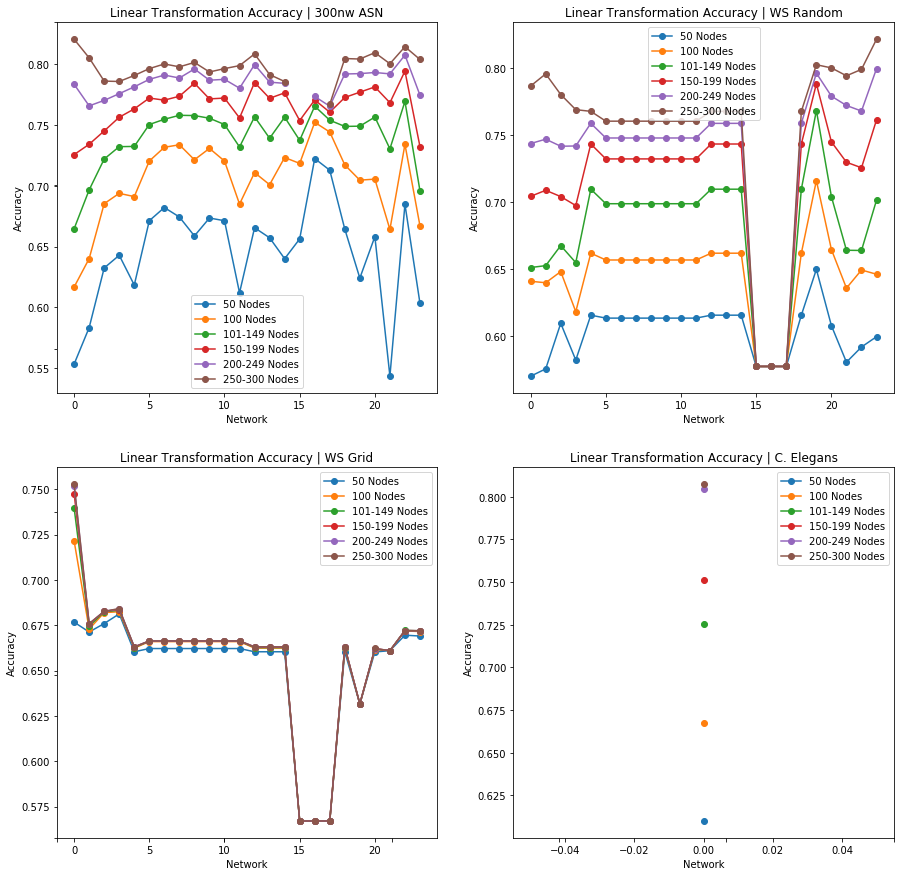

In [95]:
#300nw ASN

labels=['50 Nodes', '100 Nodes', '101-149 Nodes', '150-199 Nodes', '200-249 Nodes', '250-300 Nodes']

fig1=plt.figure(figsize=(15,15))
ax=[None]*4
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
ax[0]=fig1.add_subplot(2, 2, 1)
for i in range(len(ASNaccuracy)):
    plt.title('Linear Transformation Accuracy | 300nw ASN')
    plt.plot(ASNaccuracy[i],'-o',label=labels[i])
# plt.plot(WS_Rand_Accuracy,label='WS Random')
# plt.plot(WS_Grid_Accuracy,label='WS Grid')
# plt.hlines(Elegans_Accuracy,0,24,label='Elegans')
plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Network')


#WS RANDOM
ax[1]=fig1.add_subplot(2, 2, 2)

for i in range(len(WS_Randomaccuracy)):
    plt.title('Linear Transformation Accuracy | WS Random')
    plt.plot(WS_Randomaccuracy[i],'-o',label=labels[i])

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Network')


#WS RANDOM
ax[2]=fig1.add_subplot(2, 2, 3)

for i in range(len(WS_Gridaccuracy)):
    plt.title('Linear Transformation Accuracy | WS Grid')
    plt.plot(WS_Gridaccuracy[i],'-o',label=labels[i])

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Network')

#Elegans 
ax[3]=fig1.add_subplot(2, 2, 4)

for i in range(len(Elegans_Accuracy)):
    plt.title('Linear Transformation Accuracy | C. Elegans')
    plt.plot(Elegans_Accuracy[i],'-o',label=labels[i])

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Network')


### Sort by Small Worldness

In [96]:
#sort networks by small-worldness
ASN_sw_idx=np.argsort(smallworld)
ASN_sw=np.sort(smallworld)
sortedbysw_ASN_Accuracy=[[None]*len(ASN_sw_idx) for i in range(len(ASNaccuracy))]

for i in range(len(ASNaccuracy)):
    for j in range(len(ASN_sw_idx)):
        currentNW=ASN_sw_idx[j]
        sortedbysw_ASN_Accuracy[i][j]=(ASNaccuracy[i][currentNW])
#     sortedbysw_ASN_Accuracy.append([x for _,x in sorted(zip(ASN_sw_idx,ASNaccuracy[i]))])

rand_sw_idx=np.argsort(smallworld_random)
rand_sw=np.sort(smallworld_random)
sortedbysw_WS_Random_Accuracy=[[None]*len(rand_sw_idx) for i in range(len(WS_Randomaccuracy))]
for i in range(len(WS_Randomaccuracy)):
    for j in range(len(rand_sw_idx)):
        currentNW=rand_sw_idx[j]
        sortedbysw_WS_Random_Accuracy[i][j]=(WS_Randomaccuracy[i][currentNW])#([x for _,x in sorted(zip(rand_sw_idx,WS_Randomaccuracy[i]))])

grid_sw_idx=np.argsort(smallworld_grid)
grid_sw=np.sort(smallworld_grid)
sortedbysw_WS_Grid_Accuracy=[[None]*len(grid_sw_idx) for i in range(len(WS_Gridaccuracy))]
# sortedbysw_WS_Grid_Accuracy=[]
for i in range(len(WS_Gridaccuracy)):
    for j in range(len(grid_sw_idx)):
        currentNW=grid_sw_idx[j]
        sortedbysw_WS_Grid_Accuracy[i][j]=(WS_Gridaccuracy[i][currentNW])
#     sortedbysw_WS_Grid_Accuracy.append([x for _,x in sorted(zip(grid_sw_idx,WS_Gridaccuracy[i]))])

Text(0.5, 0, 'Networks Sorted from min Small World to max')

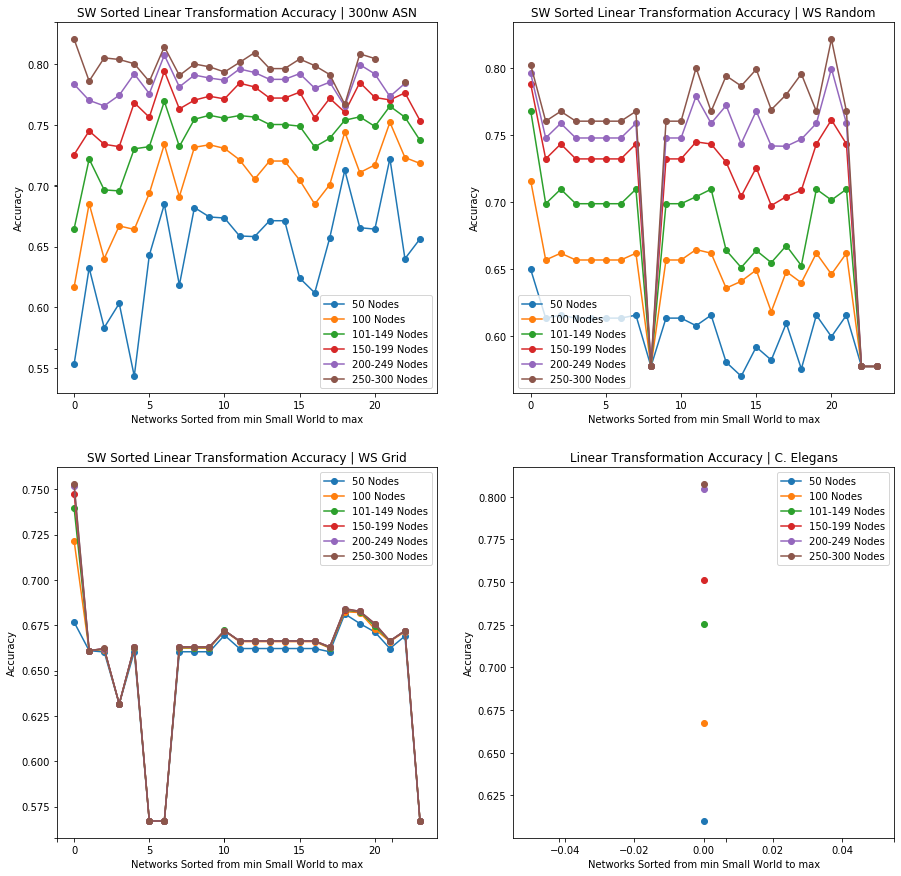

In [99]:
#300nw ASN

labels=['50 Nodes', '100 Nodes', '101-149 Nodes', '150-199 Nodes', '200-249 Nodes', '250-300 Nodes']

fig1=plt.figure(figsize=(15,15))
ax=[None]*4
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
ax[0]=fig1.add_subplot(2, 2, 1)
for i in range(len(sortedbysw_ASN_Accuracy)):
    plt.title('SW Sorted Linear Transformation Accuracy | 300nw ASN')
    plt.plot(sortedbysw_ASN_Accuracy[i],'-o',label=labels[i])
# plt.plot(WS_Rand_Accuracy,label='WS Random')
# plt.plot(WS_Grid_Accuracy,label='WS Grid')
# plt.hlines(Elegans_Accuracy,0,24,label='Elegans')
plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Networks Sorted from min Small World to max')

#WS RANDOM
ax[1]=fig1.add_subplot(2, 2, 2)

for i in range(len(sortedbysw_WS_Random_Accuracy)):
    plt.title('SW Sorted Linear Transformation Accuracy | WS Random')
    plt.plot(sortedbysw_WS_Random_Accuracy[i],'-o',label=labels[i])

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Networks Sorted from min Small World to max')

#WS RANDOM
ax[2]=fig1.add_subplot(2, 2, 3)

for i in range(len(sortedbysw_WS_Grid_Accuracy)):
    plt.title('SW Sorted Linear Transformation Accuracy | WS Grid')
    plt.plot(sortedbysw_WS_Grid_Accuracy[i],'-o',label=labels[i])

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Networks Sorted from min Small World to max')
#Elegans 
ax[3]=fig1.add_subplot(2, 2, 4)

for i in range(len(Elegans_Accuracy)):
    plt.title('Linear Transformation Accuracy | C. Elegans')
    plt.plot(Elegans_Accuracy[i],'-o',label=labels[i])

plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Networks Sorted from min Small World to max')

# plt.figure(figsize=(10,10))
# plt.title('Sorted Linear Transformation Accuracy | ALL nodes sampled')
# plt.plot(sortedbysw_ASN_Accuracy,"o-",label='300nw ASN')
# plt.plot(sortedbysw_WS_Random_Accuracy,"o-",label='WS Random')
# plt.plot(sortedbysw_WS_Grid_Accuracy,"o-",label='WS Grid')
# plt.hlines(Elegans_Accuracy,0,24,label='Elegans')
# plt.legend(loc='lower right')


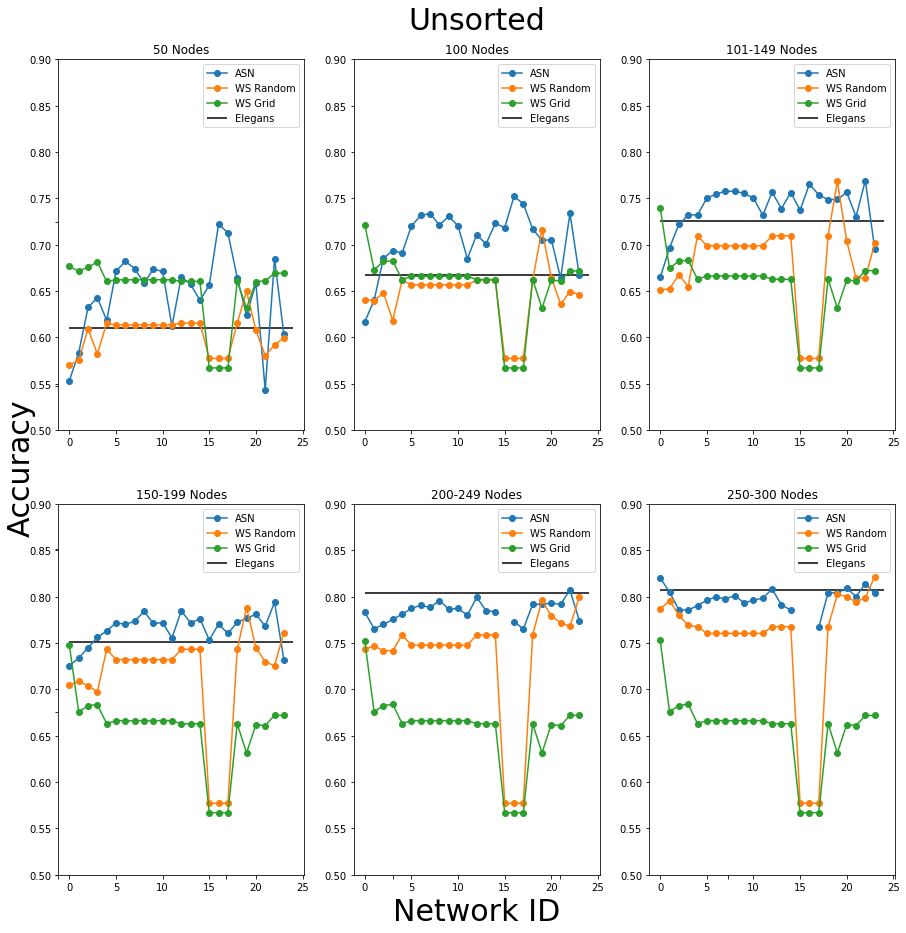

In [100]:
#network junctions switches:
fig1=plt.figure(figsize=(15,15))
ax=[None]*len(nodesList[0])
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
plt.xlabel('Network ID',fontsize=30,labelpad=15)
plt.ylabel('Accuracy',fontsize=30,labelpad=15)
plt.title('Unsorted',fontsize=30,pad=30)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(2, 3, i+1)
    plt.plot(ASNaccuracy[i],'-o',label='ASN')
    plt.plot(WS_Randomaccuracy[i],'-o',label='WS Random')
    plt.plot(WS_Gridaccuracy[i],'-o',label='WS Grid')
    plt.hlines(Elegans_Accuracy[i],0,24,label='Elegans')
    plt.title(str(labels[i]))
    plt.legend()
    plt.ylim(0.5,0.9)


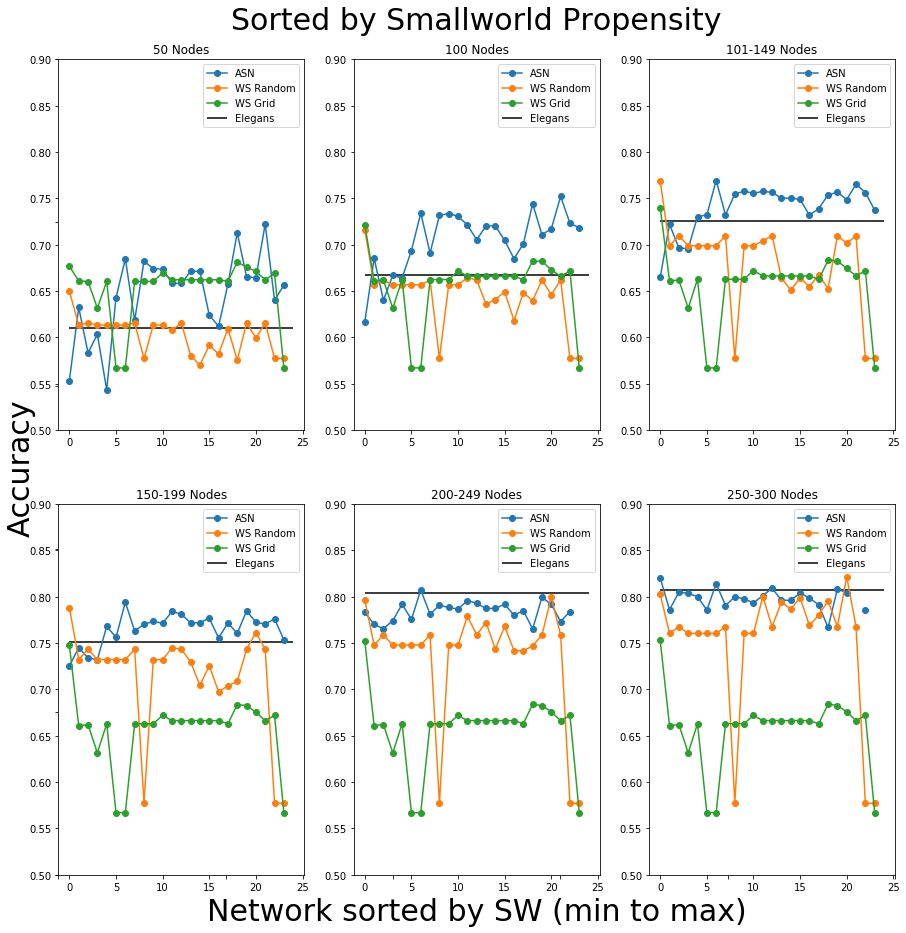

In [101]:
#network junctions switches:
fig1=plt.figure(figsize=(15,15))
ax=[None]*len(nodesList[0])
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
plt.xlabel('Network sorted by SW (min to max)',fontsize=30,labelpad=15)
plt.ylabel('Accuracy',fontsize=30,labelpad=15)
plt.title('Sorted by Smallworld Propensity',fontsize=30,pad=30)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(2, 3, i+1)
    plt.plot(sortedbysw_ASN_Accuracy[i],'-o',label='ASN')
    plt.plot(sortedbysw_WS_Random_Accuracy[i],'-o',label='WS Random')
    plt.plot(sortedbysw_WS_Grid_Accuracy[i],'-o',label='WS Grid')
    plt.hlines(Elegans_Accuracy[i],0,24,label='Elegans')
    plt.title(str(labels[i]))
    plt.legend()
    plt.ylim(0.5,0.9)

In [102]:
ASNsw=[]
WS_Randsw=[]
WS_Gridsw=[]
Eleganssw=[]
for i in range(len(ASN300)):
    ASNsw.append(ASN300[i]['Graph Theory']['Small World'])
    WS_Randsw.append(WS_Random[i]['Graph Theory']['Small World'])
    WS_Gridsw.append(WS_Grid[i]['Graph Theory']['Small World'])

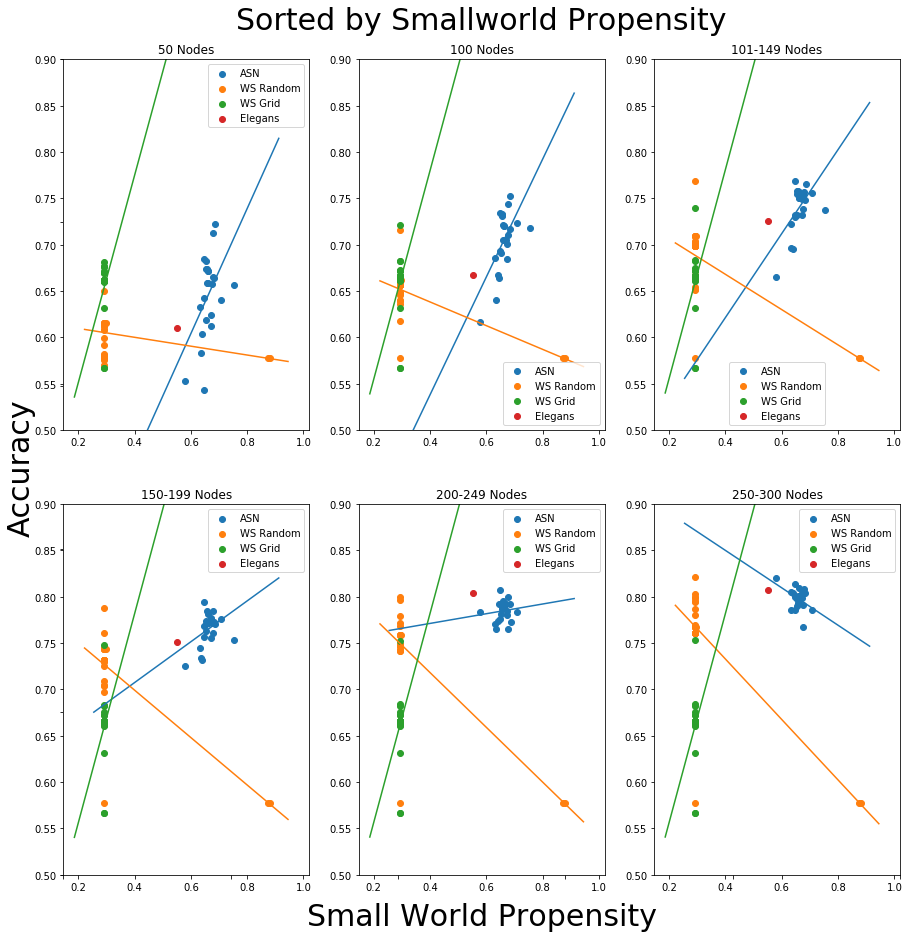

In [103]:
#network junctions switches:
fig1=plt.figure(figsize=(15,15))
ax=[None]*len(nodesList[0])
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
plt.xlabel('Small World Propensity',fontsize=30,labelpad=20)
plt.ylabel('Accuracy',fontsize=30,labelpad=20)
plt.title('Sorted by Smallworld Propensity',fontsize=30,pad=30)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(2, 3, i+1)
    plt.scatter(smallworld,ASNaccuracy[i],label='ASN')#,'-o',label='ASN')
    plt.scatter(smallworld_random,WS_Randomaccuracy[i],label='WS Random')#,'-o',label='WS Random')
    plt.scatter(smallworld_grid,WS_Gridaccuracy[i],label='WS Grid')#,'-o',label='WS Grid')
    plt.scatter(Elegans['Graph Theory']['Small World'],Elegans_Accuracy[i],label='Elegans')#,0,24,label='Elegans')
    plt.title(str(labels[i]))
    plt.legend()
    plt.ylim(0.5,0.9)
    
     # Add correlation line
        #ASN300
    x=np.array(smallworld, dtype=np.float)
    y=np.array(ASNaccuracy[i], dtype=np.float)
    idx = np.isfinite(x) & np.isfinite(y)
    m, b = np.polyfit(x[idx],y[idx], 1)
    X_plot = np.linspace(ax[i].get_xlim()[0],ax[i].get_xlim()[1],100)
    plt.plot(X_plot, m*X_plot + b, '-')
     #WS Random
    x=np.array(smallworld_random, dtype=np.float)
    y=np.array(WS_Randomaccuracy[i], dtype=np.float)
    idx = np.isfinite(x) & np.isfinite(y)
    m, b = np.polyfit(x[idx],y[idx], 1)
    X_plot = np.linspace(ax[i].get_xlim()[0],ax[i].get_xlim()[1],100)
    plt.plot(X_plot, m*X_plot + b, '-')
    
    x=np.array(smallworld_grid, dtype=np.float)
    y=np.array(WS_Gridaccuracy[i], dtype=np.float)
    idx = np.isfinite(x) & np.isfinite(y)
    m, b = np.polyfit(x[idx],y[idx], 1)
    X_plot = np.linspace(ax[i].get_xlim()[0],ax[i].get_xlim()[1],100)
    plt.plot(X_plot, m*X_plot + b, '-')
    
    plt.savefig(r'C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Data\Figures\Functional Connectivity\Linear Transformation Accuracy vs Small World Prop.jpg')


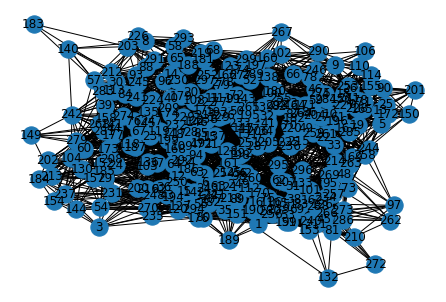

In [104]:
nx.draw(ASN300[1]['G'],with_labels=True) 

In [105]:
ASN_max_accuracy=[None]*len(ASNaccuracy)
for i in range(len(ASNaccuracy)):
    ASN_max_accuracy[i]=np.nanmax(np.array(ASNaccuracy[i], dtype=np.float64))
    
WSRandom_max_accuracy=[None]*len(WS_Randomaccuracy)
for i in range(len(WS_Randomaccuracy)):
    WSRandom_max_accuracy[i]=np.nanmax(np.array(WS_Randomaccuracy[i], dtype=np.float64))

WSGrid_max_accuracy=[None]*len(WS_Gridaccuracy)
for i in range(len(WS_Gridaccuracy)):
    WSGrid_max_accuracy[i]=np.nanmax(np.array(WS_Gridaccuracy[i], dtype=np.float64))

In [106]:
from math import ceil, floor
def float_round(num, places = 0, direction = floor):
    return direction(num * (10**places)) / float(10**places)
print('Highest Accuracy: 50 Nodes, 100 Nodes, 100-150 Nodes, 150-200 Nodes, 200-250 Nodes, 250-300 Nodes')
print("ASN 300nw: " + ', '.join(str(float_round(f, 3, round)) for f in ASN_max_accuracy))
print("WS Random: " +  ', '.join(str(float_round(f, 3, round)) for f in WSRandom_max_accuracy))
print("WS Grid: " +  ', '.join(str(float_round(f, 3, round)) for f in WSGrid_max_accuracy))
print("C Elegans: " + ', '.join(str(float_round(f, 3, round)) for f in Elegans_Accuracy))

Highest Accuracy: 50 Nodes, 100 Nodes, 100-150 Nodes, 150-200 Nodes, 200-250 Nodes, 250-300 Nodes
ASN 300nw: 0.722, 0.752, 0.769, 0.794, 0.807, 0.82
WS Random: 0.65, 0.716, 0.768, 0.788, 0.8, 0.822
WS Grid: 0.681, 0.722, 0.74, 0.748, 0.752, 0.753
C Elegans: 0.61, 0.667, 0.726, 0.751, 0.804, 0.807


In [107]:
#TO DO:

# configuration model random network
# edge swapping random network
# network x - other measures

# Communicability - switches that take into account the lambda value

# Mackey Glass

In [108]:
def runForecastNew(connectivity, multi = 1, shift = 0, 
                training_ratio = 0.3, past_steps = 50,
                cheat_period = 100, cheat_steps = 60,
                save_fig = False,
                disable_tqdm = False,inList = 0, outList=0):

    N = connectivity.numOfWires
    inList = inList#np.argsort(connectivity.xa)[0:20]
    outList = outList#np.argsort(connectivity.xb)[::-1][0:20]
    
    theMat = np.zeros((N+2, N+2))
    theMat[0:N, 0:N] = connectivity.adj_matrix
    theMat[N, inList] = 1
    theMat[inList, N] = 1
    theMat[N+1, outList] = 1
    theMat[outList, N+1] = 1
    theGraph = nx.from_numpy_array(theMat)
    
    Connectivity = connectivity__(graph = theGraph)
    # junctionList = [findJunctionIndex(Connectivity, N+1, i) for i in outList]
    
    SimulationOptions = simulationOptions__(dt = 1e-2, T = 100,
                                        contactMode = 'preSet',
                                        electrodes = [N, N+1])
    signal = mkg_generator(10000, tau = 18, a = 0.2, b = 0.1, dt = 0.1)*multi+shift
    SimulationOptions.stimulus[0] = stimulus__(biasType = 'Custom', TimeVector = SimulationOptions.TimeVector, customSignal = signal)
    JunctionState = junctionState__(Connectivity.numOfJunctions, mode = 'binary', collapse = True)

    sim1, weight1, measure1 = forecast(SimulationOptions, Connectivity, JunctionState,
                                   training_ratio, past_steps, forecast_on = True, measure_type = 'voltage', 
                                   past_signal = True, pre_activate = False, 
                                   cheat_on = True, cheat_period = cheat_period, cheat_steps = cheat_steps,
                                   update_weight = False, update_stepsize = 100, disable_tqdm = disable_tqdm)
    
    RNMSE = getRNMSE(sim1.forecast[sim1.predict_index]-shift, sim1.stimulus[0].signal[sim1.predict_index]-shift)
    sim1.forecastParams = dict(numOfWires = sim1.numOfWires,
                                numOfJunctions = sim1.numOfJunctions,
                                multi = multi, shift = shift,
                                training_ratio = training_ratio,
                                past_steps = past_steps,
                                cheat_period = cheat_period,
                                forecast_steps = cheat_period - cheat_steps,
                                cheat_steps = cheat_steps)
    if save_fig and (RNMSE < 0.5):
        plt.figure()
        plotForecastPanel(sim1)
        import time
        filename = time.strftime("%Y-%m-%d-%H%M%S") + '_RNMSE_' + str(np.round(RNMSE, 4)) + '.png'
        plt.savefig(filename)
    
    logging.info(f'RNMSE = {RNMSE}')
    return RNMSE


In [109]:
accuracy={'ASN300':[None]*len(ASN300),'Elegans':[],'WS Grid 300':[None]*len(ASN300),'WS Random 300':[None]*len(ASN300)}

## 300nw ASNs

In [110]:
ASN_con_300=[None]*len(ASN300)
for i in range(len(ASN300)):
    ASN_con_300[i]=connectivity__(wires_dict=ASN300[i])   
# ASN_con_100=connectivity__(wires_dict=ASN100)   

In [126]:
cheatSteps=range(10,61,10)
mse300_cheat=[[None]*len(ASN_con_300) for i in range(len(cheatSteps))]

for i in range(len(ASN_con_300)): #number of networks
    for j in range(len(cheatSteps)): #number of cheat steps
        print('Network ' + str(i))
        print('Cheat Steps ' + str(cheatSteps[j]))        
        #run forcast on network j for i cheat steps 
        mse300_cheat[j][i]=runForecast(ASN_con_300[i], multi = 1, shift = 0, 
                        training_ratio = 0.3, past_steps = 50,
                        cheat_period = 100, cheat_steps = cheatSteps[j],
                        save_fig = False,
                        disable_tqdm = False)

Network 0
Cheat Steps 10


2020-03-26 15:40:10,336:INFO:RNMSE = 6.99952649847044e+140



Network 0
Cheat Steps 20


2020-03-26 15:40:37,582:INFO:RNMSE = 6.797675514432113e+138



Network 0
Cheat Steps 30


2020-03-26 15:41:03,199:INFO:RNMSE = 3.4629981660851967e+34



Network 0
Cheat Steps 40


2020-03-26 15:41:27,147:INFO:RNMSE = 0.084574681730799



Network 0
Cheat Steps 50


2020-03-26 15:41:51,191:INFO:RNMSE = 0.05926130855061509



Network 0
Cheat Steps 60


2020-03-26 15:42:15,143:INFO:RNMSE = 0.03142859644751953



Network 1
Cheat Steps 10


2020-03-26 15:42:37,714:INFO:RNMSE = inf



Network 1
Cheat Steps 20


2020-03-26 15:43:06,443:INFO:RNMSE = 6.069016514073376e+136



Network 1
Cheat Steps 30


2020-03-26 15:43:31,148:INFO:RNMSE = 6.277300506864475e+141



Network 1
Cheat Steps 40


2020-03-26 15:43:57,480:INFO:RNMSE = 1.22296129852372e+78



Network 1
Cheat Steps 50


2020-03-26 15:44:13,880:INFO:RNMSE = 0.06022226405801999



Network 1
Cheat Steps 60


2020-03-26 15:44:30,625:INFO:RNMSE = 0.030438082566865348



Network 2
Cheat Steps 10


2020-03-26 15:44:45,468:INFO:RNMSE = 1.159932911334576e+148



Network 2
Cheat Steps 20


2020-03-26 15:45:00,139:INFO:RNMSE = 2.713707783444291e+130



Network 2
Cheat Steps 30


2020-03-26 15:45:15,057:INFO:RNMSE = 4.632883715407279e+77



Network 2
Cheat Steps 40


2020-03-26 15:45:29,988:INFO:RNMSE = 17.906125951721958



Network 2
Cheat Steps 50


2020-03-26 15:45:45,523:INFO:RNMSE = 0.06652770618279895



Network 2
Cheat Steps 60


2020-03-26 15:46:00,670:INFO:RNMSE = 0.0465731540034368



Network 3
Cheat Steps 10


2020-03-26 15:46:14,894:INFO:RNMSE = 3.4491438366307525e+113



Network 3
Cheat Steps 20


2020-03-26 15:46:28,939:INFO:RNMSE = 3.768156370106556e+100



Network 3
Cheat Steps 30


2020-03-26 15:46:42,857:INFO:RNMSE = 2.0078505104873713e+86



Network 3
Cheat Steps 40


2020-03-26 15:46:56,774:INFO:RNMSE = 1.8871386601573288e+76



Network 3
Cheat Steps 50


2020-03-26 15:47:11,139:INFO:RNMSE = 0.07862809080579933



Network 3
Cheat Steps 60


2020-03-26 15:47:25,260:INFO:RNMSE = 0.09120367176074612



Network 4
Cheat Steps 10


2020-03-26 15:47:39,395:INFO:RNMSE = 1.458590610675409e+118



Network 4
Cheat Steps 20


2020-03-26 15:47:53,062:INFO:RNMSE = 1.0185230661486398e+100



Network 4
Cheat Steps 30


2020-03-26 15:48:06,765:INFO:RNMSE = 2.721713678508163e+91



Network 4
Cheat Steps 40


2020-03-26 15:48:20,255:INFO:RNMSE = 7.171115657651738e+38



Network 4
Cheat Steps 50


2020-03-26 15:48:33,886:INFO:RNMSE = 0.1804079087978523



Network 4
Cheat Steps 60


2020-03-26 15:48:47,654:INFO:RNMSE = 0.08664689180149075



Network 5
Cheat Steps 10


2020-03-26 15:49:00,832:INFO:RNMSE = 4.723828157306061e+26



Network 5
Cheat Steps 20


2020-03-26 15:49:14,150:INFO:RNMSE = 1.0488026641874646



Network 5
Cheat Steps 30


2020-03-26 15:49:27,898:INFO:RNMSE = 10.913969568730378



Network 5
Cheat Steps 40


2020-03-26 15:49:41,781:INFO:RNMSE = 50.774397156937475



Network 5
Cheat Steps 50


2020-03-26 15:49:55,496:INFO:RNMSE = 3.307730731158969



Network 5
Cheat Steps 60


2020-03-26 15:50:08,895:INFO:RNMSE = 0.45753516407670364



Network 6
Cheat Steps 10


2020-03-26 15:50:22,117:INFO:RNMSE = 2.4053049180866822e+20



Network 6
Cheat Steps 20


2020-03-26 15:50:35,499:INFO:RNMSE = 0.3973185003474378



Network 6
Cheat Steps 30


2020-03-26 15:50:48,781:INFO:RNMSE = 0.7426057865004505



Network 6
Cheat Steps 40


2020-03-26 15:51:02,159:INFO:RNMSE = 0.5683691055150705



Network 6
Cheat Steps 50


2020-03-26 15:51:15,566:INFO:RNMSE = 0.2781283339520155



Network 6
Cheat Steps 60


2020-03-26 15:51:28,924:INFO:RNMSE = 0.2954408823361531



Network 7
Cheat Steps 10


2020-03-26 15:51:42,594:INFO:RNMSE = 1.1953038626328894e+51



Network 7
Cheat Steps 20


2020-03-26 15:51:56,252:INFO:RNMSE = 0.10969842510174971



Network 7
Cheat Steps 30


2020-03-26 15:52:09,636:INFO:RNMSE = 0.07573421700658295



Network 7
Cheat Steps 40


2020-03-26 15:52:23,015:INFO:RNMSE = 0.08194042141608562



Network 7
Cheat Steps 50


2020-03-26 15:52:36,341:INFO:RNMSE = 0.05560020297665583



Network 7
Cheat Steps 60


2020-03-26 15:52:49,725:INFO:RNMSE = 0.042544790000875334



Network 8
Cheat Steps 10


2020-03-26 15:53:03,094:INFO:RNMSE = 24.146542447875785



Network 8
Cheat Steps 20


2020-03-26 15:53:16,593:INFO:RNMSE = 0.5524165247191927



Network 8
Cheat Steps 30


2020-03-26 15:53:30,029:INFO:RNMSE = 1.3056836097482039



Network 8
Cheat Steps 40


2020-03-26 15:53:43,853:INFO:RNMSE = 0.256348566143543



Network 8
Cheat Steps 50


2020-03-26 15:53:57,782:INFO:RNMSE = 0.1948696654570118



Network 8
Cheat Steps 60


2020-03-26 15:54:11,203:INFO:RNMSE = 0.11565225536361058



Network 9
Cheat Steps 10


2020-03-26 15:54:24,887:INFO:RNMSE = 1.9251692701873892e+16



Network 9
Cheat Steps 20


2020-03-26 15:54:38,427:INFO:RNMSE = 0.13033955332285677



Network 9
Cheat Steps 30


2020-03-26 15:54:51,870:INFO:RNMSE = 0.07854574434500451



Network 9
Cheat Steps 40


2020-03-26 15:55:05,314:INFO:RNMSE = 0.06634076789788364



Network 9
Cheat Steps 50


2020-03-26 15:55:18,873:INFO:RNMSE = 0.04843317235904506



Network 9
Cheat Steps 60


2020-03-26 15:55:32,351:INFO:RNMSE = 0.03422499497897687



Network 10
Cheat Steps 10


2020-03-26 15:55:46,522:INFO:RNMSE = 4.723828157306061e+26



Network 10
Cheat Steps 20


2020-03-26 15:56:00,443:INFO:RNMSE = 1.0488026641874646



Network 10
Cheat Steps 30


2020-03-26 15:56:14,353:INFO:RNMSE = 10.913969568730378



Network 10
Cheat Steps 40


2020-03-26 15:56:28,030:INFO:RNMSE = 50.774397156937475



Network 10
Cheat Steps 50


2020-03-26 15:56:41,718:INFO:RNMSE = 3.307730731158969



Network 10
Cheat Steps 60


2020-03-26 15:56:55,324:INFO:RNMSE = 0.45753516407670364



Network 11
Cheat Steps 10


2020-03-26 15:57:09,004:INFO:RNMSE = 5.865430123339476e+30



Network 11
Cheat Steps 20


2020-03-26 15:57:22,404:INFO:RNMSE = 0.13475025299499332



Network 11
Cheat Steps 30


2020-03-26 15:57:35,870:INFO:RNMSE = 0.09266982795690566



Network 11
Cheat Steps 40


2020-03-26 15:57:50,150:INFO:RNMSE = 0.09266443774757828



Network 11
Cheat Steps 50


2020-03-26 15:58:03,889:INFO:RNMSE = 0.04375238322428262



Network 11
Cheat Steps 60


2020-03-26 15:58:17,499:INFO:RNMSE = 0.029860851563024763



Network 12
Cheat Steps 10


2020-03-26 15:58:30,772:INFO:RNMSE = 22.76060300065049



Network 12
Cheat Steps 20


2020-03-26 15:58:44,170:INFO:RNMSE = 2.5780669692762177



Network 12
Cheat Steps 30


2020-03-26 15:58:57,560:INFO:RNMSE = 7.095641084476644



Network 12
Cheat Steps 40


2020-03-26 15:59:11,004:INFO:RNMSE = 0.34532085195665757



Network 12
Cheat Steps 50


2020-03-26 15:59:24,804:INFO:RNMSE = 0.23854327143442589



Network 12
Cheat Steps 60


2020-03-26 15:59:38,871:INFO:RNMSE = 0.15065259346684146



Network 13
Cheat Steps 10


2020-03-26 15:59:52,711:INFO:RNMSE = 2.1471568000003323e+55



Network 13
Cheat Steps 20


2020-03-26 16:00:06,620:INFO:RNMSE = 14.024826691342478



Network 13
Cheat Steps 30


2020-03-26 16:00:20,155:INFO:RNMSE = 32.85854172994481



Network 13
Cheat Steps 40


2020-03-26 16:00:33,847:INFO:RNMSE = 0.10471012063521344



Network 13
Cheat Steps 50


2020-03-26 16:00:47,479:INFO:RNMSE = 0.06066703964491903



Network 13
Cheat Steps 60


2020-03-26 16:01:01,237:INFO:RNMSE = 0.04933731441140142



Network 14
Cheat Steps 10


2020-03-26 16:01:13,966:INFO:RNMSE = inf



Network 14
Cheat Steps 20


2020-03-26 16:01:26,614:INFO:RNMSE = 1.5117402807068942e+124



Network 14
Cheat Steps 30


2020-03-26 16:01:39,987:INFO:RNMSE = 2.1416462197843078e+113



Network 14
Cheat Steps 40


2020-03-26 16:01:53,064:INFO:RNMSE = 0.07914755843464133



Network 14
Cheat Steps 50


2020-03-26 16:02:05,911:INFO:RNMSE = 0.04922413597018812



Network 14
Cheat Steps 60


2020-03-26 16:02:18,764:INFO:RNMSE = 0.02507810027749508



Network 15
Cheat Steps 10


2020-03-26 16:02:28,485:INFO:RNMSE = 4.08671993435549e+136



Network 15
Cheat Steps 20


2020-03-26 16:02:38,229:INFO:RNMSE = 1.7732607463579586e+50



Network 15
Cheat Steps 30


2020-03-26 16:02:48,046:INFO:RNMSE = 6.074034907313216e+88



Network 15
Cheat Steps 40


2020-03-26 16:02:57,825:INFO:RNMSE = 3.1171547790181854e+86



Network 15
Cheat Steps 50


2020-03-26 16:03:07,895:INFO:RNMSE = 0.1096482336785147



Network 15
Cheat Steps 60


2020-03-26 16:03:17,969:INFO:RNMSE = 0.05008172842072269



Network 16
Cheat Steps 10


2020-03-26 16:03:28,204:INFO:RNMSE = 5247151948433806.0



Network 16
Cheat Steps 20


2020-03-26 16:03:39,203:INFO:RNMSE = 0.3105972269637266



Network 16
Cheat Steps 30


2020-03-26 16:03:49,542:INFO:RNMSE = 0.1967652402052125



Network 16
Cheat Steps 40


2020-03-26 16:03:59,903:INFO:RNMSE = 0.1328357109479086



Network 16
Cheat Steps 50


2020-03-26 16:04:10,155:INFO:RNMSE = 0.1137676221233931



Network 16
Cheat Steps 60


2020-03-26 16:04:20,774:INFO:RNMSE = 0.1114157427878575



Network 17
Cheat Steps 10


2020-03-26 16:04:36,225:INFO:RNMSE = 3.4478699376945075e+17



Network 17
Cheat Steps 20


2020-03-26 16:04:51,397:INFO:RNMSE = 0.18163903435591983



Network 17
Cheat Steps 30


2020-03-26 16:05:03,808:INFO:RNMSE = 0.13379066184947502



Network 17
Cheat Steps 40


2020-03-26 16:05:16,312:INFO:RNMSE = 0.1474416113209477



Network 17
Cheat Steps 50


2020-03-26 16:05:28,670:INFO:RNMSE = 0.13542977820415444



Network 17
Cheat Steps 60


2020-03-26 16:05:41,605:INFO:RNMSE = 0.1108095170530959



Network 18
Cheat Steps 10


2020-03-26 16:05:55,829:INFO:RNMSE = 4.723828157306061e+26



Network 18
Cheat Steps 20


2020-03-26 16:06:09,683:INFO:RNMSE = 1.0488026641874646



Network 18
Cheat Steps 30


2020-03-26 16:06:23,557:INFO:RNMSE = 10.913969568730378



Network 18
Cheat Steps 40


2020-03-26 16:06:37,234:INFO:RNMSE = 50.774397156937475



Network 18
Cheat Steps 50


2020-03-26 16:06:51,262:INFO:RNMSE = 3.307730731158969



Network 18
Cheat Steps 60


2020-03-26 16:07:05,102:INFO:RNMSE = 0.45753516407670364



Network 19
Cheat Steps 10


2020-03-26 16:07:19,481:INFO:RNMSE = 3.794065631622424e+109



Network 19
Cheat Steps 20


2020-03-26 16:07:38,891:INFO:RNMSE = 1.5457517562127308e+105



Network 19
Cheat Steps 30


2020-03-26 16:07:58,248:INFO:RNMSE = 4.074505430379434e+67



Network 19
Cheat Steps 40


2020-03-26 16:08:13,328:INFO:RNMSE = 39914419658520.19



Network 19
Cheat Steps 50


2020-03-26 16:08:27,861:INFO:RNMSE = 0.10521317882086476



Network 19
Cheat Steps 60


2020-03-26 16:08:42,457:INFO:RNMSE = 0.07455864558811914



Network 20
Cheat Steps 10


2020-03-26 16:08:57,781:INFO:RNMSE = 3.1380790805924414e+139



Network 20
Cheat Steps 20


2020-03-26 16:09:13,247:INFO:RNMSE = 6.676691330289305e+102



Network 20
Cheat Steps 30


2020-03-26 16:09:29,146:INFO:RNMSE = 2.4866517601313296e+37



Network 20
Cheat Steps 40


2020-03-26 16:09:44,969:INFO:RNMSE = 1.5277823347486344e+44



Network 20
Cheat Steps 50


2020-03-26 16:10:00,941:INFO:RNMSE = 0.30685515536652447



Network 20
Cheat Steps 60


2020-03-26 16:10:16,517:INFO:RNMSE = 0.16287114426947175



Network 21
Cheat Steps 10


2020-03-26 16:10:36,084:INFO:RNMSE = 1.3869138326474984e+140



Network 21
Cheat Steps 20


2020-03-26 16:10:51,181:INFO:RNMSE = 6.265683578954104e+84



Network 21
Cheat Steps 30


2020-03-26 16:11:06,338:INFO:RNMSE = 1.992665395062149e+106



Network 21
Cheat Steps 40


2020-03-26 16:11:21,347:INFO:RNMSE = 0.08656088406053836



Network 21
Cheat Steps 50


2020-03-26 16:11:36,364:INFO:RNMSE = 0.024898833383605014



Network 21
Cheat Steps 60


2020-03-26 16:11:52,367:INFO:RNMSE = 0.017015666134373508



Network 22
Cheat Steps 10


2020-03-26 16:12:07,885:INFO:RNMSE = inf



Network 22
Cheat Steps 20


2020-03-26 16:12:23,260:INFO:RNMSE = 1.1857044663588117e+69



Network 22
Cheat Steps 30


2020-03-26 16:12:38,425:INFO:RNMSE = 8.116991323802477e+116



Network 22
Cheat Steps 40


2020-03-26 16:12:53,913:INFO:RNMSE = 40.478995549413284



Network 22
Cheat Steps 50


2020-03-26 16:13:09,554:INFO:RNMSE = 0.11439010350495088



Network 22
Cheat Steps 60


2020-03-26 16:13:25,000:INFO:RNMSE = 0.04501978988382743



Network 23
Cheat Steps 10


2020-03-26 16:13:41,214:INFO:RNMSE = 3.667934727116741e+147



Network 23
Cheat Steps 20


2020-03-26 16:13:57,366:INFO:RNMSE = 2.9766570824613056e+135



Network 23
Cheat Steps 30


2020-03-26 16:14:13,101:INFO:RNMSE = 2.0663934748344297e+109



Network 23
Cheat Steps 40


2020-03-26 16:14:28,888:INFO:RNMSE = 28.132633940863208



Network 23
Cheat Steps 50


2020-03-26 16:14:44,778:INFO:RNMSE = 0.11915037153876129



Network 23
Cheat Steps 60


2020-03-26 16:15:00,827:INFO:RNMSE = 0.057604062308854447


In [127]:
accuracy['ASN300']=[[None]*len(ASN300) for i in range(len(cheatSteps))]
for i in range(len(cheatSteps)):
    for j in range(len(ASN300)):
        if i==0:
            ASN300[j]['Accuracy']['Mackey Glass']={'Cheat Steps':[],'Accuracy Value':[]}
        print(str(cheatSteps[i]))
        ASN300[j]['Accuracy']['Mackey Glass']['Cheat Steps'].append(cheatSteps[i])
        accuracy['ASN300'][i][j]=1-mse300_cheat[i][j]
        ASN300[j]['Accuracy']['Mackey Glass']['Accuracy Value'].append(1-mse300_cheat[i][j])


# for i in range(len(cheatSteps)):
#     for j in range(len(mse300_cheat[i])):
#         accuracy['ASN300'][i][j]=1-mse300_cheat[i][j] #save for analysis

#         ASN300[j]['Accuracy']['Mackey Glass']=accuracy['ASN300'][i][j] #save for plotting

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60


In [128]:
#Find best performing network:
best_params_nw=np.argsort(mse300_cheat) #sort by lowest MSE
best_accuracies=[None]*len(mse300_cheat)
for i in range(len(mse300_cheat)):
    best_accuracies[i]=np.array(mse300_cheat[i])[np.array(best_params_nw[i])] #define best accuracies based on lowest MSE

(0, 1)

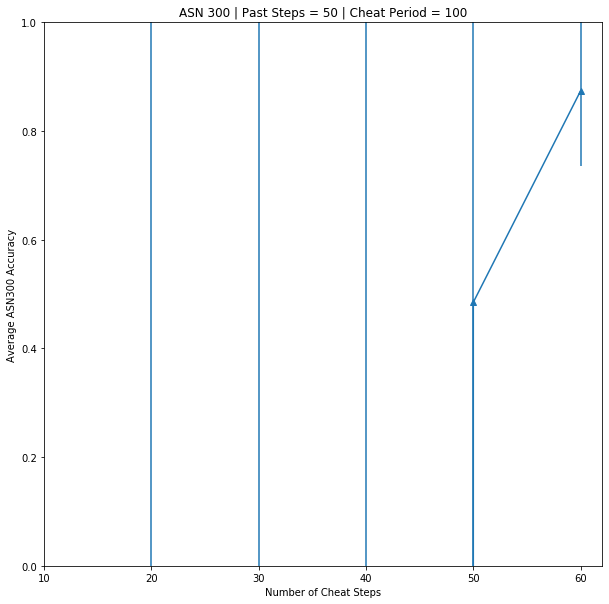

In [129]:
#Plot accuracy vs number of cheat steps
meanAcc=[]
stdAcc=[]
for i in range(len(cheatSteps)):
    meanAcc.append(np.mean(accuracy['ASN300'][i]))
    stdAcc.append(np.std(accuracy['ASN300'][i]))
# plt.plot(meanAcc,'-o')
plt.figure(figsize=(10,10))
plt.errorbar(range(len(cheatSteps)),meanAcc,stdAcc, marker='^')
plt.xticks(range(0,len(ASN300[0]['Accuracy']['Mackey Glass']['Cheat Steps']),1),labels=ASN300[0]['Accuracy']['Mackey Glass']['Cheat Steps'])
plt.xlabel('Number of Cheat Steps')
plt.ylabel('Average ASN300 Accuracy')
plt.title('ASN 300 | Past Steps = 50 | Cheat Period = 100')
# plt.yscale('log')
plt.ylim([0, 1])

In [130]:
stdAcc

[nan,
 1.357855239427236e+138,
 1.2543698188386484e+141,
 6.228895479029544e+85,
 1.0579707516875128,
 0.13849371684516507]

## C. Elegans

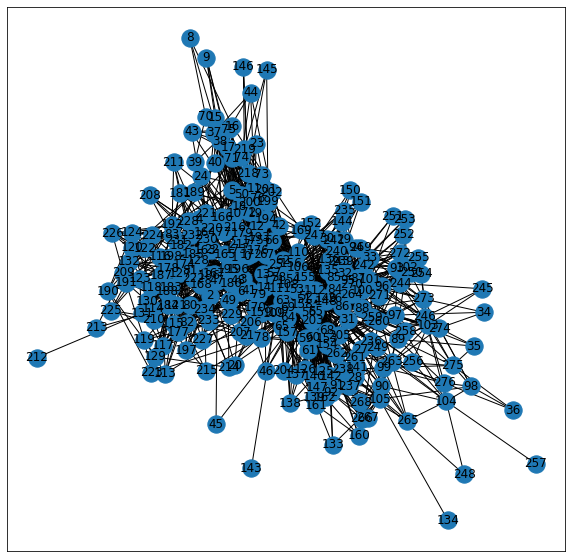

In [131]:
plt.figure(figsize=(10,10))
nx.draw_networkx(elegansGraph)

In [132]:
help(runForecastNew)

Help on function runForecastNew in module __main__:

runForecastNew(connectivity, multi=1, shift=0, training_ratio=0.3, past_steps=50, cheat_period=100, cheat_steps=60, save_fig=False, disable_tqdm=False, inList=0, outList=0)



In [135]:
mseElegans=[]
cheat_steps=[]
#loop through cheat steps + see how accuracy changes
for i in cheatSteps:
    print('Cheat steps = ' + str(i))
    mseElegans.append(runForecastNew(connectivity__(graph=elegansGraph), multi = 1, shift = 0, 
                    training_ratio = 0.3, past_steps = 50,
                    cheat_period = 100, cheat_steps = i,
                    save_fig = False,
                    disable_tqdm = False, inList=8, outList=245))
    cheat_steps.append(i)
#change tau parameter for chaos

Cheat steps = 10


2020-03-26 16:39:41,818:INFO:RNMSE = 2.383758055086071e+42



Cheat steps = 20


2020-03-26 16:39:52,392:INFO:RNMSE = 0.09175322019837824



Cheat steps = 30


2020-03-26 16:40:03,630:INFO:RNMSE = 0.06791955028204147



Cheat steps = 40


2020-03-26 16:40:13,409:INFO:RNMSE = 0.05186822536903713



Cheat steps = 50


2020-03-26 16:40:25,303:INFO:RNMSE = 0.04388272321617386



Cheat steps = 60


2020-03-26 16:40:36,808:INFO:RNMSE = 0.028887843070378512


In [193]:
Elegans['Accuracy']['Mackey Glass']['Cheat Steps']=[]
Elegans['Accuracy']['Mackey Glass']['Accuracy Value']=[]
accuracy['Elegans']=[]
Elegans_MG_accuracy=[[None]*len(Elegans) for i in range(len(cheatSteps))]

for i in range(len(mseElegans)):
    accuracy['Elegans']=1-mseElegans[i]
    Elegans['Accuracy']['Mackey Glass']['Cheat Steps'].append(cheat_steps[i])
    Elegans['Accuracy']['Mackey Glass']['Accuracy Value'].append(accuracy['Elegans'])
    temp=Elegans['Accuracy']['Mackey Glass']['Accuracy Value'][i]
    if temp < 0:
        temp=0
    Elegans_MG_accuracy[i]=temp

[0,
 0.9082467798016217,
 0.9320804497179586,
 0.9481317746309629,
 0.9561172767838262,
 0.9711121569296215]

In [137]:
Elegans['Accuracy']['Mackey Glass']

{'Cheat Steps': [10, 20, 30, 40, 50, 60],
 'Accuracy Value': [-2.383758055086071e+42,
  0.9082467798016217,
  0.9320804497179586,
  0.9481317746309629,
  0.9561172767838262,
  0.9711121569296215]}

Text(0.5, 1.0, 'C Elegans | Past Steps = 50 | Cheat Period = 100')

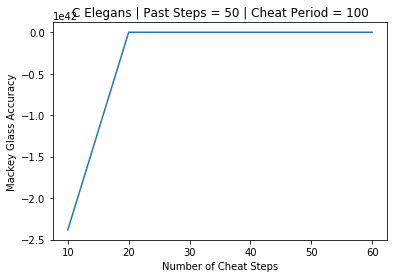

In [138]:
#Plot accuracy vs number of cheat steps
plt.plot(Elegans['Accuracy']['Mackey Glass']['Accuracy Value'])
plt.xticks(range(0,len(Elegans['Accuracy']['Mackey Glass']['Cheat Steps']),1),labels=Elegans['Accuracy']['Mackey Glass']['Cheat Steps'])
plt.xlabel('Number of Cheat Steps')
plt.ylabel('Mackey Glass Accuracy')
plt.title('C Elegans | Past Steps = 50 | Cheat Period = 100')

## Watts-Strogatz
### Grid & Random

In [139]:
ws300[10][1].number_of_nodes()

300

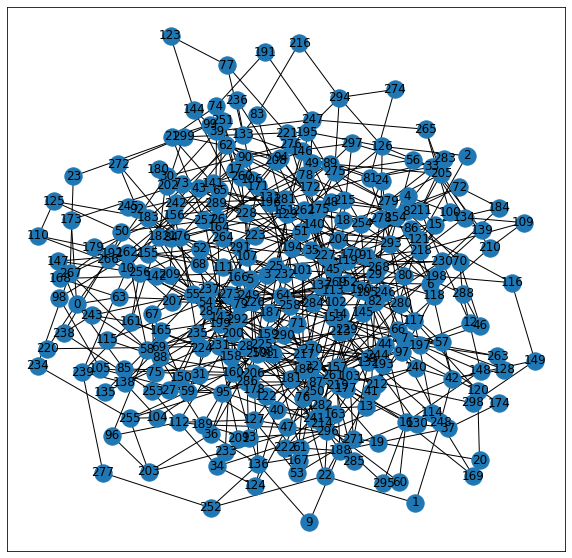

In [140]:
plt.figure(figsize=(10,10))
nx.draw_networkx(ws300[10][1])

In [141]:
cheatSteps=range(10,61,10)
mse300_WS_Grid_cheat=[[None]*len(ws300) for i in range(len(cheatSteps))]
numNodes=len(ws300[0][0])
for i in range(len(ws300)): #number of cheat steps
    adjmat=np.asarray(nx.adjacency_matrix(ws300[i][0]).todense())
    electrodes=edamame.core.getFarthestPairing(adjmat)
    for j in range(len(cheatSteps)): #number of networks
        print('Network ' + str(i))
        print('Cheat Steps ' + str(cheatSteps[j]))        
        #run forcast on network j for i cheat steps 
        mse300_WS_Grid_cheat[j][i]=runForecastNew(connectivity__(graph=ws300[i][0]), multi = 1, shift = 0, 
                        training_ratio = 0.3, past_steps = 50,
                        cheat_period = 100, cheat_steps = cheatSteps[j],
                        save_fig = False,
                        disable_tqdm = False,inList=0,outList=int(numNodes/2))

Network 0
Cheat Steps 10


2020-03-26 16:40:59,648:INFO:RNMSE = 9.230352381656875e+23



Network 0
Cheat Steps 20


2020-03-26 16:41:12,612:INFO:RNMSE = 0.15934609348443174



Network 0
Cheat Steps 30


2020-03-26 16:41:25,050:INFO:RNMSE = 0.07994661519171822



Network 0
Cheat Steps 40


2020-03-26 16:41:38,073:INFO:RNMSE = 0.06216286694716619



Network 0
Cheat Steps 50


2020-03-26 16:41:50,610:INFO:RNMSE = 0.04501118253115901



Network 0
Cheat Steps 60


2020-03-26 16:42:03,689:INFO:RNMSE = 0.03273391839859491



Network 1
Cheat Steps 10


2020-03-26 16:42:14,641:INFO:RNMSE = 0.19129515134929395



Network 1
Cheat Steps 20


2020-03-26 16:42:25,728:INFO:RNMSE = 0.11545054817021418



Network 1
Cheat Steps 30


2020-03-26 16:42:36,728:INFO:RNMSE = 0.09334024844006762



Network 1
Cheat Steps 40


2020-03-26 16:42:47,842:INFO:RNMSE = 0.07560152845440302



Network 1
Cheat Steps 50


2020-03-26 16:42:58,818:INFO:RNMSE = 0.05899285090663889



Network 1
Cheat Steps 60


2020-03-26 16:43:09,827:INFO:RNMSE = 0.044658571397387256



Network 2
Cheat Steps 10


2020-03-26 16:43:20,303:INFO:RNMSE = 0.1622696128423299



Network 2
Cheat Steps 20


2020-03-26 16:43:30,707:INFO:RNMSE = 0.14548249524558932



Network 2
Cheat Steps 30


2020-03-26 16:43:41,822:INFO:RNMSE = 0.1278387649173052



Network 2
Cheat Steps 40


2020-03-26 16:43:52,436:INFO:RNMSE = 0.1097565527705154



Network 2
Cheat Steps 50


2020-03-26 16:44:03,571:INFO:RNMSE = 0.09151300695745157



Network 2
Cheat Steps 60


2020-03-26 16:44:14,074:INFO:RNMSE = 0.07321966189811602



Network 3
Cheat Steps 10


2020-03-26 16:44:24,533:INFO:RNMSE = 0.1574127958120724



Network 3
Cheat Steps 20


2020-03-26 16:44:34,720:INFO:RNMSE = 0.13330044302028898



Network 3
Cheat Steps 30


2020-03-26 16:44:44,929:INFO:RNMSE = 0.12016430695619043



Network 3
Cheat Steps 40


2020-03-26 16:44:55,158:INFO:RNMSE = 0.09660508735243081



Network 3
Cheat Steps 50


2020-03-26 16:45:05,456:INFO:RNMSE = 0.0856425589204276



Network 3
Cheat Steps 60


2020-03-26 16:45:15,749:INFO:RNMSE = 0.07187164706571529



Network 4
Cheat Steps 10


2020-03-26 16:45:25,990:INFO:RNMSE = 2453030169716947.0



Network 4
Cheat Steps 20


2020-03-26 16:45:36,179:INFO:RNMSE = 1.071657377504693



Network 4
Cheat Steps 30


2020-03-26 16:45:47,147:INFO:RNMSE = 0.16007680774941063



Network 4
Cheat Steps 40


2020-03-26 16:45:57,646:INFO:RNMSE = 0.09722613884402137



Network 4
Cheat Steps 50


2020-03-26 16:46:07,849:INFO:RNMSE = 0.06618763591563535



Network 4
Cheat Steps 60


2020-03-26 16:46:18,067:INFO:RNMSE = 0.056062855769911026



Network 5
Cheat Steps 10


2020-03-26 16:46:28,285:INFO:RNMSE = 2453030169716947.0



Network 5
Cheat Steps 20


2020-03-26 16:46:38,516:INFO:RNMSE = 1.071657377504693



Network 5
Cheat Steps 30


2020-03-26 16:46:48,768:INFO:RNMSE = 0.16007680774941063



Network 5
Cheat Steps 40


2020-03-26 16:46:58,833:INFO:RNMSE = 0.09722613884402137



Network 5
Cheat Steps 50


2020-03-26 16:47:09,011:INFO:RNMSE = 0.06618763591563535



Network 5
Cheat Steps 60


2020-03-26 16:47:19,345:INFO:RNMSE = 0.056062855769911026



Network 6
Cheat Steps 10


2020-03-26 16:47:29,553:INFO:RNMSE = 2453030169716947.0



Network 6
Cheat Steps 20


2020-03-26 16:47:40,452:INFO:RNMSE = 1.071657377504693



Network 6
Cheat Steps 30


2020-03-26 16:47:50,672:INFO:RNMSE = 0.16007680774941063



Network 6
Cheat Steps 40


2020-03-26 16:48:01,360:INFO:RNMSE = 0.09722613884402137



Network 6
Cheat Steps 50


2020-03-26 16:48:11,535:INFO:RNMSE = 0.06618763591563535



Network 6
Cheat Steps 60


2020-03-26 16:48:21,809:INFO:RNMSE = 0.056062855769911026



Network 7
Cheat Steps 10


2020-03-26 16:48:32,138:INFO:RNMSE = 2453030169716947.0



Network 7
Cheat Steps 20


2020-03-26 16:48:42,243:INFO:RNMSE = 1.071657377504693



Network 7
Cheat Steps 30


2020-03-26 16:48:52,545:INFO:RNMSE = 0.16007680774941063



Network 7
Cheat Steps 40


2020-03-26 16:49:02,895:INFO:RNMSE = 0.09722613884402137



Network 7
Cheat Steps 50


2020-03-26 16:49:13,153:INFO:RNMSE = 0.06618763591563535



Network 7
Cheat Steps 60


2020-03-26 16:49:23,525:INFO:RNMSE = 0.056062855769911026



Network 8
Cheat Steps 10


2020-03-26 16:49:34,129:INFO:RNMSE = 2453030169716947.0



Network 8
Cheat Steps 20


2020-03-26 16:49:45,029:INFO:RNMSE = 1.071657377504693



Network 8
Cheat Steps 30


2020-03-26 16:49:55,847:INFO:RNMSE = 0.16007680774941063



Network 8
Cheat Steps 40


2020-03-26 16:50:06,142:INFO:RNMSE = 0.09722613884402137



Network 8
Cheat Steps 50


2020-03-26 16:50:16,352:INFO:RNMSE = 0.06618763591563535



Network 8
Cheat Steps 60


2020-03-26 16:50:26,644:INFO:RNMSE = 0.056062855769911026



Network 9
Cheat Steps 10


2020-03-26 16:50:37,001:INFO:RNMSE = 2453030169716947.0



Network 9
Cheat Steps 20


2020-03-26 16:50:47,258:INFO:RNMSE = 1.071657377504693



Network 9
Cheat Steps 30


2020-03-26 16:50:57,657:INFO:RNMSE = 0.16007680774941063



Network 9
Cheat Steps 40


2020-03-26 16:51:08,009:INFO:RNMSE = 0.09722613884402137



Network 9
Cheat Steps 50


2020-03-26 16:51:18,226:INFO:RNMSE = 0.06618763591563535



Network 9
Cheat Steps 60


2020-03-26 16:51:28,633:INFO:RNMSE = 0.056062855769911026



Network 10
Cheat Steps 10


2020-03-26 16:51:39,870:INFO:RNMSE = 2453030169716947.0



Network 10
Cheat Steps 20


2020-03-26 16:51:50,548:INFO:RNMSE = 1.071657377504693



Network 10
Cheat Steps 30


2020-03-26 16:52:01,374:INFO:RNMSE = 0.16007680774941063



Network 10
Cheat Steps 40


2020-03-26 16:52:11,709:INFO:RNMSE = 0.09722613884402137



Network 10
Cheat Steps 50


2020-03-26 16:52:22,100:INFO:RNMSE = 0.06618763591563535



Network 10
Cheat Steps 60


2020-03-26 16:52:32,529:INFO:RNMSE = 0.056062855769911026



Network 11
Cheat Steps 10


2020-03-26 16:52:43,049:INFO:RNMSE = 2453030169716947.0



Network 11
Cheat Steps 20


2020-03-26 16:52:53,307:INFO:RNMSE = 1.071657377504693



Network 11
Cheat Steps 30


2020-03-26 16:53:03,668:INFO:RNMSE = 0.16007680774941063



Network 11
Cheat Steps 40


2020-03-26 16:53:13,907:INFO:RNMSE = 0.09722613884402137



Network 11
Cheat Steps 50


2020-03-26 16:53:24,325:INFO:RNMSE = 0.06618763591563535



Network 11
Cheat Steps 60


2020-03-26 16:53:34,639:INFO:RNMSE = 0.056062855769911026



Network 12
Cheat Steps 10


2020-03-26 16:53:46,436:INFO:RNMSE = 2453030169716947.0



Network 12
Cheat Steps 20


2020-03-26 16:53:57,670:INFO:RNMSE = 1.071657377504693



Network 12
Cheat Steps 30


2020-03-26 16:54:08,467:INFO:RNMSE = 0.16007680774941063



Network 12
Cheat Steps 40


2020-03-26 16:54:19,168:INFO:RNMSE = 0.09722613884402137



Network 12
Cheat Steps 50


2020-03-26 16:54:30,149:INFO:RNMSE = 0.06618763591563535



Network 12
Cheat Steps 60


2020-03-26 16:54:40,916:INFO:RNMSE = 0.056062855769911026



Network 13
Cheat Steps 10


2020-03-26 16:54:52,033:INFO:RNMSE = 2453030169716947.0



Network 13
Cheat Steps 20


2020-03-26 16:55:05,814:INFO:RNMSE = 1.071657377504693



Network 13
Cheat Steps 30


2020-03-26 16:55:16,497:INFO:RNMSE = 0.16007680774941063



Network 13
Cheat Steps 40


2020-03-26 16:55:27,655:INFO:RNMSE = 0.09722613884402137



Network 13
Cheat Steps 50


2020-03-26 16:55:38,591:INFO:RNMSE = 0.06618763591563535



Network 13
Cheat Steps 60


2020-03-26 16:55:49,357:INFO:RNMSE = 0.056062855769911026



Network 14
Cheat Steps 10


2020-03-26 16:56:00,423:INFO:RNMSE = 2453030169716947.0



Network 14
Cheat Steps 20


2020-03-26 16:56:10,997:INFO:RNMSE = 1.071657377504693



Network 14
Cheat Steps 30


2020-03-26 16:56:21,650:INFO:RNMSE = 0.16007680774941063



Network 14
Cheat Steps 40


2020-03-26 16:56:32,138:INFO:RNMSE = 0.09722613884402137



Network 14
Cheat Steps 50


2020-03-26 16:56:42,640:INFO:RNMSE = 0.06618763591563535



Network 14
Cheat Steps 60


2020-03-26 16:56:52,965:INFO:RNMSE = 0.056062855769911026



Network 15
Cheat Steps 10


2020-03-26 16:57:03,471:INFO:RNMSE = 9.92518761312886e+91



Network 15
Cheat Steps 20


2020-03-26 16:57:13,840:INFO:RNMSE = 4.974343089637925e+19



Network 15
Cheat Steps 30


2020-03-26 16:57:24,475:INFO:RNMSE = 1.3020925483705211e+53



Network 15
Cheat Steps 40


2020-03-26 16:57:34,906:INFO:RNMSE = 1664439.4513581696



Network 15
Cheat Steps 50


2020-03-26 16:57:46,242:INFO:RNMSE = 0.9293232573772526



Network 15
Cheat Steps 60


2020-03-26 16:57:57,083:INFO:RNMSE = 3.531055078511629



Network 16
Cheat Steps 10


2020-03-26 16:58:07,486:INFO:RNMSE = 9.92518761312886e+91



Network 16
Cheat Steps 20


2020-03-26 16:58:17,986:INFO:RNMSE = 4.974343089637925e+19



Network 16
Cheat Steps 30


2020-03-26 16:58:28,384:INFO:RNMSE = 1.3020925483705211e+53



Network 16
Cheat Steps 40


2020-03-26 16:58:38,798:INFO:RNMSE = 1664439.4513581696



Network 16
Cheat Steps 50


2020-03-26 16:58:49,292:INFO:RNMSE = 0.9293232573772526



Network 16
Cheat Steps 60


2020-03-26 16:58:59,653:INFO:RNMSE = 3.531055078511629



Network 17
Cheat Steps 10


2020-03-26 16:59:10,156:INFO:RNMSE = 9.92518761312886e+91



Network 17
Cheat Steps 20


2020-03-26 16:59:20,646:INFO:RNMSE = 4.974343089637925e+19



Network 17
Cheat Steps 30


2020-03-26 16:59:31,176:INFO:RNMSE = 1.3020925483705211e+53



Network 17
Cheat Steps 40


2020-03-26 16:59:42,302:INFO:RNMSE = 1664439.4513581696



Network 17
Cheat Steps 50


2020-03-26 16:59:52,921:INFO:RNMSE = 0.9293232573772526



Network 17
Cheat Steps 60


2020-03-26 17:00:03,736:INFO:RNMSE = 3.531055078511629



Network 18
Cheat Steps 10


2020-03-26 17:00:14,429:INFO:RNMSE = 2453030169716947.0



Network 18
Cheat Steps 20


2020-03-26 17:00:25,859:INFO:RNMSE = 1.071657377504693



Network 18
Cheat Steps 30


2020-03-26 17:00:36,461:INFO:RNMSE = 0.16007680774941063



Network 18
Cheat Steps 40


2020-03-26 17:00:47,225:INFO:RNMSE = 0.09722613884402137



Network 18
Cheat Steps 50


2020-03-26 17:00:57,807:INFO:RNMSE = 0.06618763591563535



Network 18
Cheat Steps 60


2020-03-26 17:01:08,690:INFO:RNMSE = 0.056062855769911026



Network 19
Cheat Steps 10


2020-03-26 17:01:19,460:INFO:RNMSE = 2453030169716947.0



Network 19
Cheat Steps 20


2020-03-26 17:01:30,147:INFO:RNMSE = 1.071657377504693



Network 19
Cheat Steps 30


2020-03-26 17:01:41,586:INFO:RNMSE = 0.16007680774941063



Network 19
Cheat Steps 40


2020-03-26 17:01:52,853:INFO:RNMSE = 0.09722613884402137



Network 19
Cheat Steps 50


2020-03-26 17:02:03,584:INFO:RNMSE = 0.06618763591563535



Network 19
Cheat Steps 60


2020-03-26 17:02:14,196:INFO:RNMSE = 0.056062855769911026



Network 20
Cheat Steps 10


2020-03-26 17:02:25,671:INFO:RNMSE = 0.1574127958120724



Network 20
Cheat Steps 20


2020-03-26 17:02:36,837:INFO:RNMSE = 0.13330044302028898



Network 20
Cheat Steps 30


2020-03-26 17:02:48,160:INFO:RNMSE = 0.12016430695619043



Network 20
Cheat Steps 40


2020-03-26 17:03:01,458:INFO:RNMSE = 0.09660508735243081



Network 20
Cheat Steps 50


2020-03-26 17:03:14,719:INFO:RNMSE = 0.0856425589204276



Network 20
Cheat Steps 60


2020-03-26 17:03:27,107:INFO:RNMSE = 0.07187164706571529



Network 21
Cheat Steps 10


2020-03-26 17:03:39,393:INFO:RNMSE = 0.16987860519443077



Network 21
Cheat Steps 20


2020-03-26 17:03:51,387:INFO:RNMSE = 0.15666547297566719



Network 21
Cheat Steps 30


2020-03-26 17:04:02,819:INFO:RNMSE = 0.13065925198386336



Network 21
Cheat Steps 40


2020-03-26 17:04:13,753:INFO:RNMSE = 0.11280094568434838



Network 21
Cheat Steps 50


2020-03-26 17:04:24,734:INFO:RNMSE = 0.09485802774694424



Network 21
Cheat Steps 60


2020-03-26 17:04:35,618:INFO:RNMSE = 0.07730266475450073



Network 22
Cheat Steps 10


2020-03-26 17:04:46,795:INFO:RNMSE = 0.1622696128423299



Network 22
Cheat Steps 20


2020-03-26 17:04:57,774:INFO:RNMSE = 0.14548249524558932



Network 22
Cheat Steps 30


2020-03-26 17:05:08,990:INFO:RNMSE = 0.1278387649173052



Network 22
Cheat Steps 40


2020-03-26 17:05:20,145:INFO:RNMSE = 0.1097565527705154



Network 22
Cheat Steps 50


2020-03-26 17:05:31,324:INFO:RNMSE = 0.09151300695745157



Network 22
Cheat Steps 60


2020-03-26 17:05:43,053:INFO:RNMSE = 0.07321966189811602



Network 23
Cheat Steps 10


2020-03-26 17:05:54,326:INFO:RNMSE = 0.1584845076658466



Network 23
Cheat Steps 20


2020-03-26 17:06:05,770:INFO:RNMSE = 0.1419518754462173



Network 23
Cheat Steps 30


2020-03-26 17:06:17,011:INFO:RNMSE = 0.12595786923852667



Network 23
Cheat Steps 40


2020-03-26 17:06:28,380:INFO:RNMSE = 0.10783710109255758



Network 23
Cheat Steps 50


2020-03-26 17:06:39,439:INFO:RNMSE = 0.09107151423469535



Network 23
Cheat Steps 60


2020-03-26 17:06:50,681:INFO:RNMSE = 0.07278665061696526


In [142]:
# mseRandom300=[None]*len(ws300)
cheatSteps=range(10,61,10)
mse300_WS_Random_cheat=[[None]*len(ws300) for i in range(len(cheatSteps))]

for i in range(len(ws300)): #number of cheat steps
    adjmat=np.asarray(nx.adjacency_matrix(ws300[i][1]).todense())
    electrodes=edamame.core.getFarthestPairing(adjmat)
    for j in range(len(cheatSteps)): #number of networks
        print('Network ' + str(i+1))
        print('Cheat Steps ' + str(cheatSteps[j]))        
        #run forcast on network j for i cheat steps 
        mse300_WS_Random_cheat[j][i]=runForecastNew(connectivity__(graph=ws300[i][1]), multi = 1, shift = 0, 
                        training_ratio = 0.3, past_steps = 50,
                        cheat_period = 100, cheat_steps = cheatSteps[j],
                        save_fig = False,
                        disable_tqdm = False, inList=electrodes[0],outList=electrodes[1])

# #     numNodes=ws300[i][1].number_of_nodes()
#     mseRandom300[i]=runForecastNew(connectivity__(graph=ws300[i][0]), multi = 1, shift = 0, 
#                 training_ratio = 0.3, past_steps = 50,
#                 cheat_period = 100, cheat_steps = 60,
#                 save_fig = False,
#                 disable_tqdm = False,inList=electrodes[0],outList=electrodes[1])

   

Network 1
Cheat Steps 10


2020-03-26 19:04:07,488:INFO:RNMSE = 3.742000051813331



Network 1
Cheat Steps 20


2020-03-26 19:04:21,213:INFO:RNMSE = 0.24284233366666336



Network 1
Cheat Steps 30


2020-03-26 19:04:34,753:INFO:RNMSE = 0.07159491860793052



Network 1
Cheat Steps 40


2020-03-26 19:04:47,851:INFO:RNMSE = 0.4449905505444079



Network 1
Cheat Steps 50


2020-03-26 19:05:01,100:INFO:RNMSE = 0.04075930709818153



Network 1
Cheat Steps 60


2020-03-26 19:05:14,522:INFO:RNMSE = 0.0282285587607781



Network 2
Cheat Steps 10


2020-03-26 19:05:26,210:INFO:RNMSE = 0.23504940096854599



Network 2
Cheat Steps 20


2020-03-26 19:05:38,689:INFO:RNMSE = 0.11715460551657514



Network 2
Cheat Steps 30


2020-03-26 19:05:50,791:INFO:RNMSE = 0.12483727247669832



Network 2
Cheat Steps 40


2020-03-26 19:06:02,580:INFO:RNMSE = 0.238890573314844



Network 2
Cheat Steps 50


2020-03-26 19:06:14,535:INFO:RNMSE = 0.06521283016654839



Network 2
Cheat Steps 60


2020-03-26 19:06:26,300:INFO:RNMSE = 0.04482644043611104



Network 3
Cheat Steps 10


2020-03-26 19:06:37,203:INFO:RNMSE = 5.670064158682124e+16



Network 3
Cheat Steps 20


2020-03-26 19:06:48,177:INFO:RNMSE = 0.1377820307594748



Network 3
Cheat Steps 30


2020-03-26 19:06:59,218:INFO:RNMSE = 0.08801986255845144



Network 3
Cheat Steps 40


2020-03-26 19:07:10,247:INFO:RNMSE = 0.07067233124913097



Network 3
Cheat Steps 50


2020-03-26 19:07:21,300:INFO:RNMSE = 0.05444704708704393



Network 3
Cheat Steps 60


2020-03-26 19:07:32,345:INFO:RNMSE = 0.03947704981398449



Network 4
Cheat Steps 10


2020-03-26 19:07:44,008:INFO:RNMSE = 1.629496218514426e+42



Network 4
Cheat Steps 20


2020-03-26 19:07:55,797:INFO:RNMSE = 0.13254291087070347



Network 4
Cheat Steps 30


2020-03-26 19:08:06,553:INFO:RNMSE = 0.07668133339370627



Network 4
Cheat Steps 40


2020-03-26 19:08:17,366:INFO:RNMSE = 0.06271576072148086



Network 4
Cheat Steps 50


2020-03-26 19:08:28,195:INFO:RNMSE = 0.04840514780379188



Network 4
Cheat Steps 60


2020-03-26 19:08:39,028:INFO:RNMSE = 0.033922188811930196



Network 5
Cheat Steps 10


2020-03-26 19:08:49,765:INFO:RNMSE = 0.18704270256336544



Network 5
Cheat Steps 20


2020-03-26 19:09:00,450:INFO:RNMSE = 0.13438270639875455



Network 5
Cheat Steps 30


2020-03-26 19:09:11,067:INFO:RNMSE = 0.10910211502179584



Network 5
Cheat Steps 40


2020-03-26 19:09:21,758:INFO:RNMSE = 0.0867625427672597



Network 5
Cheat Steps 50


2020-03-26 19:09:32,359:INFO:RNMSE = 0.06807070615739708



Network 5
Cheat Steps 60


2020-03-26 19:09:43,797:INFO:RNMSE = 0.05149952982976643



Network 6
Cheat Steps 10


2020-03-26 19:09:55,030:INFO:RNMSE = 0.18704270256336544



Network 6
Cheat Steps 20


2020-03-26 19:10:05,852:INFO:RNMSE = 0.13438270639875455



Network 6
Cheat Steps 30


2020-03-26 19:10:16,522:INFO:RNMSE = 0.10910211502179584



Network 6
Cheat Steps 40


2020-03-26 19:10:27,307:INFO:RNMSE = 0.0867625427672597



Network 6
Cheat Steps 50


2020-03-26 19:10:38,701:INFO:RNMSE = 0.06807070615739708



Network 6
Cheat Steps 60


2020-03-26 19:10:49,391:INFO:RNMSE = 0.05149952982976643



Network 7
Cheat Steps 10


2020-03-26 19:11:00,192:INFO:RNMSE = 0.18704270256336544



Network 7
Cheat Steps 20


2020-03-26 19:11:11,031:INFO:RNMSE = 0.13438270639875455



Network 7
Cheat Steps 30


2020-03-26 19:11:21,812:INFO:RNMSE = 0.10910211502179584



Network 7
Cheat Steps 40


2020-03-26 19:11:32,692:INFO:RNMSE = 0.0867625427672597



Network 7
Cheat Steps 50


2020-03-26 19:11:44,311:INFO:RNMSE = 0.06807070615739708



Network 7
Cheat Steps 60


2020-03-26 19:11:55,651:INFO:RNMSE = 0.05149952982976643



Network 8
Cheat Steps 10


2020-03-26 19:12:06,441:INFO:RNMSE = 0.18704270256336544



Network 8
Cheat Steps 20


2020-03-26 19:12:17,100:INFO:RNMSE = 0.13438270639875455



Network 8
Cheat Steps 30


2020-03-26 19:12:27,825:INFO:RNMSE = 0.10910211502179584



Network 8
Cheat Steps 40


2020-03-26 19:12:38,572:INFO:RNMSE = 0.0867625427672597



Network 8
Cheat Steps 50


2020-03-26 19:12:49,347:INFO:RNMSE = 0.06807070615739708



Network 8
Cheat Steps 60


2020-03-26 19:13:00,300:INFO:RNMSE = 0.05149952982976643



Network 9
Cheat Steps 10


2020-03-26 19:13:11,173:INFO:RNMSE = 0.18704270256336544



Network 9
Cheat Steps 20


2020-03-26 19:13:21,934:INFO:RNMSE = 0.13438270639875455



Network 9
Cheat Steps 30


2020-03-26 19:13:35,143:INFO:RNMSE = 0.10910211502179584



Network 9
Cheat Steps 40


2020-03-26 19:13:48,695:INFO:RNMSE = 0.0867625427672597



Network 9
Cheat Steps 50


2020-03-26 19:14:02,053:INFO:RNMSE = 0.06807070615739708



Network 9
Cheat Steps 60


2020-03-26 19:14:15,269:INFO:RNMSE = 0.05149952982976643



Network 10
Cheat Steps 10


2020-03-26 19:14:28,369:INFO:RNMSE = 0.18704270256336544



Network 10
Cheat Steps 20


2020-03-26 19:14:41,643:INFO:RNMSE = 0.13438270639875455



Network 10
Cheat Steps 30


2020-03-26 19:14:54,862:INFO:RNMSE = 0.10910211502179584



Network 10
Cheat Steps 40


2020-03-26 19:15:08,091:INFO:RNMSE = 0.0867625427672597



Network 10
Cheat Steps 50


2020-03-26 19:15:21,095:INFO:RNMSE = 0.06807070615739708



Network 10
Cheat Steps 60


2020-03-26 19:15:34,517:INFO:RNMSE = 0.05149952982976643



Network 11
Cheat Steps 10


2020-03-26 19:15:48,511:INFO:RNMSE = 0.18704270256336544



Network 11
Cheat Steps 20


2020-03-26 19:16:02,277:INFO:RNMSE = 0.13438270639875455



Network 11
Cheat Steps 30


2020-03-26 19:16:15,612:INFO:RNMSE = 0.10910211502179584



Network 11
Cheat Steps 40


2020-03-26 19:16:28,871:INFO:RNMSE = 0.0867625427672597



Network 11
Cheat Steps 50


2020-03-26 19:16:42,108:INFO:RNMSE = 0.06807070615739708



Network 11
Cheat Steps 60


2020-03-26 19:16:55,680:INFO:RNMSE = 0.05149952982976643



Network 12
Cheat Steps 10


2020-03-26 19:17:09,105:INFO:RNMSE = 0.18704270256336544



Network 12
Cheat Steps 20


2020-03-26 19:17:22,435:INFO:RNMSE = 0.13438270639875455



Network 12
Cheat Steps 30


2020-03-26 19:17:35,743:INFO:RNMSE = 0.10910211502179584



Network 12
Cheat Steps 40


2020-03-26 19:17:49,616:INFO:RNMSE = 0.0867625427672597



Network 12
Cheat Steps 50


2020-03-26 19:18:03,148:INFO:RNMSE = 0.06807070615739708



Network 12
Cheat Steps 60


2020-03-26 19:18:16,613:INFO:RNMSE = 0.05149952982976643



Network 13
Cheat Steps 10


2020-03-26 19:18:30,103:INFO:RNMSE = 0.18704270256336544



Network 13
Cheat Steps 20


2020-03-26 19:18:43,540:INFO:RNMSE = 0.13438270639875455



Network 13
Cheat Steps 30


2020-03-26 19:18:57,091:INFO:RNMSE = 0.10910211502179584



Network 13
Cheat Steps 40


2020-03-26 19:19:10,593:INFO:RNMSE = 0.0867625427672597



Network 13
Cheat Steps 50


2020-03-26 19:19:24,044:INFO:RNMSE = 0.06807070615739708



Network 13
Cheat Steps 60


2020-03-26 19:19:37,874:INFO:RNMSE = 0.05149952982976643



Network 14
Cheat Steps 10


2020-03-26 19:19:51,591:INFO:RNMSE = 0.18704270256336544



Network 14
Cheat Steps 20


2020-03-26 19:20:05,955:INFO:RNMSE = 0.13438270639875455



Network 14
Cheat Steps 30


2020-03-26 19:20:19,430:INFO:RNMSE = 0.10910211502179584



Network 14
Cheat Steps 40


2020-03-26 19:20:32,724:INFO:RNMSE = 0.0867625427672597



Network 14
Cheat Steps 50


2020-03-26 19:20:46,215:INFO:RNMSE = 0.06807070615739708



Network 14
Cheat Steps 60


2020-03-26 19:20:59,885:INFO:RNMSE = 0.05149952982976643



Network 15
Cheat Steps 10


2020-03-26 19:21:13,577:INFO:RNMSE = 0.18704270256336544



Network 15
Cheat Steps 20


2020-03-26 19:21:27,066:INFO:RNMSE = 0.13438270639875455



Network 15
Cheat Steps 30


2020-03-26 19:21:40,884:INFO:RNMSE = 0.10910211502179584



Network 15
Cheat Steps 40


2020-03-26 19:21:55,045:INFO:RNMSE = 0.0867625427672597



Network 15
Cheat Steps 50


2020-03-26 19:22:14,846:INFO:RNMSE = 0.06807070615739708



Network 15
Cheat Steps 60


2020-03-26 19:22:34,527:INFO:RNMSE = 0.05149952982976643



Network 16
Cheat Steps 10


2020-03-26 19:22:55,108:INFO:RNMSE = 8.007709091441983e+31



Network 16
Cheat Steps 20


2020-03-26 19:23:14,731:INFO:RNMSE = 0.15178786650988071



Network 16
Cheat Steps 30


2020-03-26 19:23:34,329:INFO:RNMSE = 0.07818245252990352



Network 16
Cheat Steps 40


2020-03-26 19:23:54,758:INFO:RNMSE = 0.2175296582249749



Network 16
Cheat Steps 50


2020-03-26 19:24:14,546:INFO:RNMSE = 0.06996137824665893



Network 16
Cheat Steps 60


2020-03-26 19:24:34,280:INFO:RNMSE = 0.052232281258298444



Network 17
Cheat Steps 10


2020-03-26 19:24:54,101:INFO:RNMSE = 8.007709091441983e+31



Network 17
Cheat Steps 20


2020-03-26 19:25:13,787:INFO:RNMSE = 0.15178786650988071



Network 17
Cheat Steps 30


2020-03-26 19:25:33,530:INFO:RNMSE = 0.07818245252990352



Network 17
Cheat Steps 40


2020-03-26 19:25:54,298:INFO:RNMSE = 0.2175296582249749



Network 17
Cheat Steps 50


2020-03-26 19:26:14,238:INFO:RNMSE = 0.06996137824665893



Network 17
Cheat Steps 60


2020-03-26 19:26:34,063:INFO:RNMSE = 0.052232281258298444



Network 18
Cheat Steps 10


2020-03-26 19:26:54,061:INFO:RNMSE = 8.007709091441983e+31



Network 18
Cheat Steps 20


2020-03-26 19:27:14,041:INFO:RNMSE = 0.15178786650988071



Network 18
Cheat Steps 30


2020-03-26 19:27:33,861:INFO:RNMSE = 0.07818245252990352



Network 18
Cheat Steps 40


2020-03-26 19:27:54,434:INFO:RNMSE = 0.2175296582249749



Network 18
Cheat Steps 50


2020-03-26 19:28:14,188:INFO:RNMSE = 0.06996137824665893



Network 18
Cheat Steps 60


2020-03-26 19:28:34,227:INFO:RNMSE = 0.052232281258298444



Network 19
Cheat Steps 10


2020-03-26 19:28:54,826:INFO:RNMSE = 0.18704270256336544



Network 19
Cheat Steps 20


2020-03-26 19:29:15,406:INFO:RNMSE = 0.13438270639875455



Network 19
Cheat Steps 30


2020-03-26 19:29:35,813:INFO:RNMSE = 0.10910211502179584



Network 19
Cheat Steps 40


2020-03-26 19:29:57,621:INFO:RNMSE = 0.0867625427672597



Network 19
Cheat Steps 50


2020-03-26 19:30:18,276:INFO:RNMSE = 0.06807070615739708



Network 19
Cheat Steps 60


2020-03-26 19:30:38,746:INFO:RNMSE = 0.05149952982976643



Network 20
Cheat Steps 10


2020-03-26 19:30:59,362:INFO:RNMSE = 0.18704270256336544



Network 20
Cheat Steps 20


2020-03-26 19:31:19,968:INFO:RNMSE = 0.13438270639875455



Network 20
Cheat Steps 30


2020-03-26 19:31:41,127:INFO:RNMSE = 0.10910211502179584



Network 20
Cheat Steps 40


2020-03-26 19:32:01,860:INFO:RNMSE = 0.0867625427672597



Network 20
Cheat Steps 50


2020-03-26 19:32:22,531:INFO:RNMSE = 0.06807070615739708



Network 20
Cheat Steps 60


2020-03-26 19:32:43,162:INFO:RNMSE = 0.05149952982976643



Network 21
Cheat Steps 10


2020-03-26 19:33:03,966:INFO:RNMSE = 1.629496218514426e+42



Network 21
Cheat Steps 20


2020-03-26 19:33:24,498:INFO:RNMSE = 0.13254291087070347



Network 21
Cheat Steps 30


2020-03-26 19:33:46,026:INFO:RNMSE = 0.07668133339370627



Network 21
Cheat Steps 40


2020-03-26 19:34:10,376:INFO:RNMSE = 0.06271576072148086



Network 21
Cheat Steps 50


2020-03-26 19:34:31,097:INFO:RNMSE = 0.04840514780379188



Network 21
Cheat Steps 60


2020-03-26 19:34:51,885:INFO:RNMSE = 0.033922188811930196



Network 22
Cheat Steps 10


2020-03-26 19:35:13,061:INFO:RNMSE = 7.907876633518726e+28



Network 22
Cheat Steps 20


2020-03-26 19:35:34,027:INFO:RNMSE = 0.11829616679959018



Network 22
Cheat Steps 30


2020-03-26 19:35:55,916:INFO:RNMSE = 0.08099095185226911



Network 22
Cheat Steps 40


2020-03-26 19:36:16,922:INFO:RNMSE = 0.06527557140322557



Network 22
Cheat Steps 50


2020-03-26 19:36:37,955:INFO:RNMSE = 0.05027307878798005



Network 22
Cheat Steps 60


2020-03-26 19:36:58,925:INFO:RNMSE = 0.036177830538671456



Network 23
Cheat Steps 10


2020-03-26 19:37:20,176:INFO:RNMSE = 5.670064158682124e+16



Network 23
Cheat Steps 20


2020-03-26 19:37:41,947:INFO:RNMSE = 0.1377820307594748



Network 23
Cheat Steps 30


2020-03-26 19:38:03,925:INFO:RNMSE = 0.08801986255845144



Network 23
Cheat Steps 40


2020-03-26 19:38:19,071:INFO:RNMSE = 0.07067233124913097



Network 23
Cheat Steps 50


2020-03-26 19:38:40,314:INFO:RNMSE = 0.05444704708704393



Network 23
Cheat Steps 60


2020-03-26 19:39:01,605:INFO:RNMSE = 0.03947704981398449



Network 24
Cheat Steps 10


2020-03-26 19:39:23,048:INFO:RNMSE = 21054481.445587803



Network 24
Cheat Steps 20


2020-03-26 19:39:45,068:INFO:RNMSE = 0.13948008461373496



Network 24
Cheat Steps 30


2020-03-26 19:40:06,920:INFO:RNMSE = 0.08852145615533023



Network 24
Cheat Steps 40


2020-03-26 19:40:28,225:INFO:RNMSE = 0.07142574044265922



Network 24
Cheat Steps 50


2020-03-26 19:40:49,397:INFO:RNMSE = 0.055340617642760825



Network 24
Cheat Steps 60


2020-03-26 19:41:10,793:INFO:RNMSE = 0.04015273036752738


In [143]:
accuracy['WS Random 300']=[[None]*len(ws300) for i in range(len(cheatSteps))]
for i in range(len(cheatSteps)):
    for j in range(len(ws300)):
        if i==0:
            WS_Random[j]['Accuracy']['Mackey Glass']={'Cheat Steps':[],'Accuracy Value':[]}
        print(str(cheatSteps[i]))
        WS_Random[j]['Accuracy']['Mackey Glass']['Cheat Steps'].append(cheatSteps[i])
        accuracy['WS Random 300'][i][j]=1-mse300_WS_Random_cheat[i][j]
        WS_Random[j]['Accuracy']['Mackey Glass']['Accuracy Value'].append(1-mse300_WS_Random_cheat[i][j])

accuracy['WS Grid 300']=[[None]*len(ws300) for i in range(len(cheatSteps))]
for i in range(len(cheatSteps)):
    for j in range(len(ws300)):
        if i==0:
            WS_Grid[j]['Accuracy']['Mackey Glass']={'Cheat Steps':[],'Accuracy Value':[]}
        print(str(cheatSteps[i]))
        WS_Grid[j]['Accuracy']['Mackey Glass']['Cheat Steps'].append(cheatSteps[i])
        accuracy['WS Grid 300'][i][j]=1-mse300_WS_Grid_cheat[i][j]
        WS_Grid[j]['Accuracy']['Mackey Glass']['Accuracy Value'].append(1-mse300_WS_Grid_cheat[i][j])

# for i in range(len(cheatSteps)):
#     for j in range(len(mse300_cheat[i])):
#         accuracy['ASN300'][i][j]=1-mse300_cheat[i][j] #save for analysis


#         ASN300[j]['Accuracy']['Mackey Glass']=accuracy['ASN300'][i][j] #save for plotting

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60


In [145]:
accuracy

{'ASN300': [[-6.99952649847044e+140,
   -inf,
   -1.159932911334576e+148,
   -3.4491438366307525e+113,
   -1.458590610675409e+118,
   -4.723828157306061e+26,
   -2.4053049180866822e+20,
   -1.1953038626328894e+51,
   -23.146542447875785,
   -1.9251692701873892e+16,
   -4.723828157306061e+26,
   -5.865430123339476e+30,
   -21.76060300065049,
   -2.1471568000003323e+55,
   -inf,
   -4.08671993435549e+136,
   -5247151948433805.0,
   -3.4478699376945075e+17,
   -4.723828157306061e+26,
   -3.794065631622424e+109,
   -3.1380790805924414e+139,
   -1.3869138326474984e+140,
   -inf,
   -3.667934727116741e+147],
  [-6.797675514432113e+138,
   -6.069016514073376e+136,
   -2.713707783444291e+130,
   -3.768156370106556e+100,
   -1.0185230661486398e+100,
   -0.048802664187464595,
   0.6026814996525622,
   0.8903015748982503,
   0.44758347528080733,
   0.8696604466771433,
   -0.048802664187464595,
   0.8652497470050067,
   -1.5780669692762177,
   -13.024826691342478,
   -1.5117402807068942e+124,
   -

In [146]:
# best_params_grid

In [166]:
ASN_MG_accuracy=[[None]*len(ASN300) for i in range(len(cheatSteps))]
for i in range(len(ASN300)):
    temp=[]
    for j in range(len(ASN300[i]['Accuracy']['Mackey Glass']['Accuracy Value'])):
        temp=ASN300[i]['Accuracy']['Mackey Glass']['Accuracy Value'][j]
        if temp < 0:
            temp=0
        if j == 0:
            ASN_MG_accuracy[0][i]= temp
        elif j == 1:
            ASN_MG_accuracy[1][i]= temp
        elif j == 2:
            ASN_MG_accuracy[2][i]= temp
        elif j == 3:
            ASN_MG_accuracy[3][i]= temp
        elif j == 4:
            ASN_MG_accuracy[4][i]= temp
        elif j == 5:
            ASN_MG_accuracy[5][i]= temp

In [173]:
WS_MG_Randomaccuracy=[[None]*len(WS_Random) for i in range(len(cheatSteps))]
for i in range(len(ASN300)):
    temp=[]
    for j in range(len(WS_Random[i]['Accuracy']['Mackey Glass']['Accuracy Value'])):
        temp=WS_Random[i]['Accuracy']['Mackey Glass']['Accuracy Value'][j]
        if temp < 0:
            temp=0
        if j == 0:
            WS_MG_Randomaccuracy[0][i]= temp
        elif j == 1:
            WS_MG_Randomaccuracy[1][i]= temp
        elif j == 2:
            WS_MG_Randomaccuracy[2][i]= temp
        elif j == 3:
            WS_MG_Randomaccuracy[3][i]= temp
        elif j == 4:
            WS_MG_Randomaccuracy[4][i]= temp
        elif j == 5:
            WS_MG_Randomaccuracy[5][i]= temp

In [174]:
WS_MG_Randomaccuracy

[[0,
  0.764950599031454,
  0,
  0,
  0.8129572974366346,
  0.8129572974366346,
  0.8129572974366346,
  0.8129572974366346,
  0.8129572974366346,
  0.8129572974366346,
  0.8129572974366346,
  0.8129572974366346,
  0.8129572974366346,
  0.8129572974366346,
  0.8129572974366346,
  0,
  0,
  0,
  0.8129572974366346,
  0.8129572974366346,
  0,
  0,
  0,
  0],
 [0.7571576663333366,
  0.8828453944834249,
  0.8622179692405252,
  0.8674570891292965,
  0.8656172936012454,
  0.8656172936012454,
  0.8656172936012454,
  0.8656172936012454,
  0.8656172936012454,
  0.8656172936012454,
  0.8656172936012454,
  0.8656172936012454,
  0.8656172936012454,
  0.8656172936012454,
  0.8656172936012454,
  0.8482121334901193,
  0.8482121334901193,
  0.8482121334901193,
  0.8656172936012454,
  0.8656172936012454,
  0.8674570891292965,
  0.8817038332004098,
  0.8622179692405252,
  0.860519915386265],
 [0.9284050813920695,
  0.8751627275233017,
  0.9119801374415486,
  0.9233186666062937,
  0.8908978849782041,
  0.

In [175]:
WS_MG_Gridaccuracy=[[None]*len(WS_Grid) for i in range(len(cheatSteps))]
for i in range(len(ASN300)):
    temp=[]
    for j in range(len(WS_Grid[i]['Accuracy']['Mackey Glass']['Accuracy Value'])):
        temp=WS_Grid[i]['Accuracy']['Mackey Glass']['Accuracy Value'][j]
        if temp < 0:
            temp=0
        if j == 0:
            WS_MG_Gridaccuracy[0][i]= temp
        elif j == 1:
            WS_MG_Gridaccuracy[1][i]= temp
        elif j == 2:
            WS_MG_Gridaccuracy[2][i]= temp
        elif j == 3:
            WS_MG_Gridaccuracy[3][i]= temp
        elif j == 4:
            WS_MG_Gridaccuracy[4][i]= temp
        elif j == 5:
            WS_MG_Gridaccuracy[5][i]= temp

In [176]:
labels_MG=['10 Cheat Steps','20 Cheat Steps','30 Cheat Steps','40 Cheat Steps','50 Cheat Steps','60 Cheat Steps']

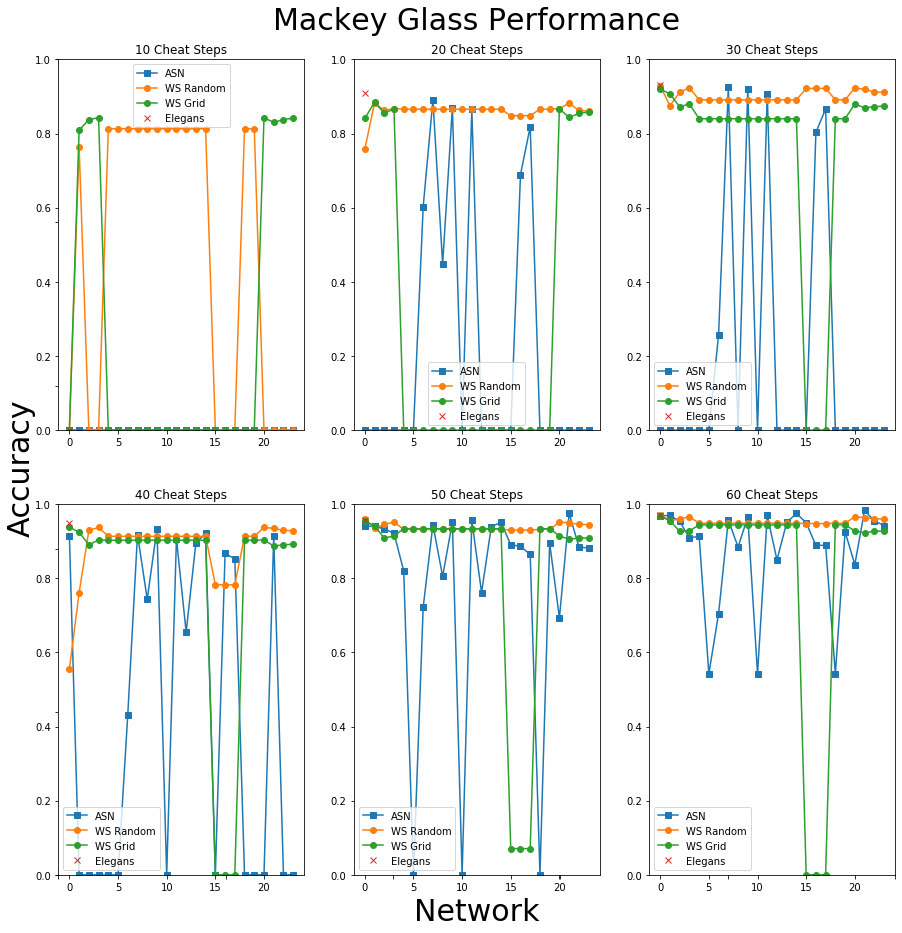

In [199]:
#network junctions switches:
fig1=plt.figure(figsize=(15,15))
ax=[None]*len(cheatSteps)
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
plt.xlabel('Network',fontsize=30,labelpad=15)
plt.ylabel('Accuracy',fontsize=30,labelpad=15)
plt.title('Mackey Glass Performance',fontsize=30,pad=30)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(2, 3, i+1)
    plt.plot(ASN_MG_accuracy[i],'-s',label='ASN')
    plt.plot(WS_MG_Randomaccuracy[i],'-o',label='WS Random')
    plt.plot(WS_MG_Gridaccuracy[i],'-o',label='WS Grid')
    plt.plot(Elegans_MG_accuracy[i],'x',label='Elegans')#,0,24,label='Elegans')
    plt.title(str(labels_MG[i]))
    plt.legend(loc='bottom right')
    plt.ylim(0,1)

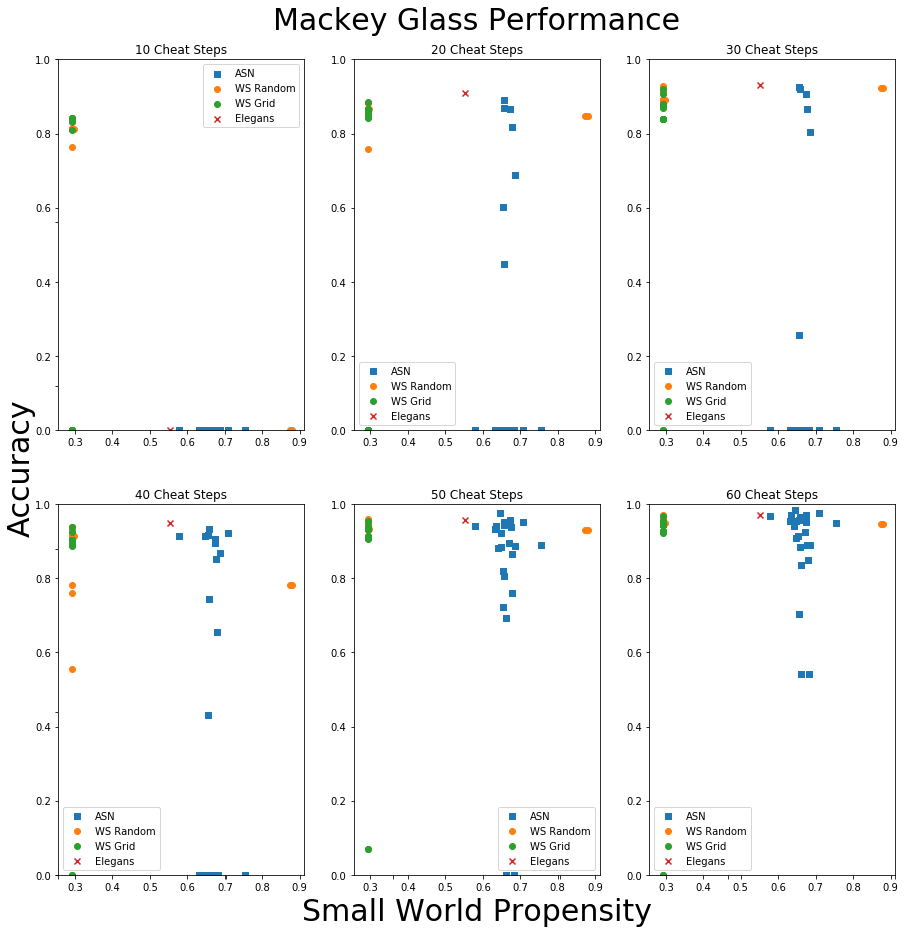

In [198]:
#MG Plot SmallWorldness:
fig1=plt.figure(figsize=(15,15))
ax=[None]*len(cheatSteps)
axBig = fig1.add_subplot(111)
axBig.set_frame_on(False)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
plt.xlabel('Small World Propensity',fontsize=30,labelpad=15)
plt.ylabel('Accuracy',fontsize=30,labelpad=15)
plt.title('Mackey Glass Performance',fontsize=30,pad=30)
for i in range(len(ax)):
    ax[i]=fig1.add_subplot(2, 3, i+1)
    plt.scatter(smallworld,ASN_MG_accuracy[i],label='ASN',marker='s')
    plt.scatter(smallworld_random,WS_MG_Randomaccuracy[i],label='WS Random',marker='o')
    plt.scatter(smallworld_grid,WS_MG_Gridaccuracy[i],label='WS Grid',marker='o')
    plt.scatter(Elegans['Graph Theory']['Small World'],Elegans_MG_accuracy[i],label='Elegans',marker='x')#,0,24,label='Elegans')
    plt.title(str(labels_MG[i]))
    plt.legend(loc='bottom right')
    plt.ylim(0,1)

#DOUBLE CHECK SMALL WORLDNESS 
    
#      #Add correlation line
#       #  ASN300
#     x=np.array(ASNsw, dtype=np.float)
#     y=np.array(ASN_MG_accuracy[i], dtype=np.float)
#     idx = np.isfinite(x) & np.isfinite(y)
#     m, b = np.polyfit(x[idx],y[idx], 1)
#     X_plot = np.linspace(ax[i].get_xlim()[0],ax[i].get_xlim()[1],100)
#     plt.plot(X_plot, m*X_plot + b, '-')
#      #WS Random
#     x=np.array(WS_Randsw, dtype=np.float)
#     y=np.array(WS_MG_Randomaccuracy[i], dtype=np.float)
#     idx = np.isfinite(x) & np.isfinite(y)
#     m, b = np.polyfit(x[idx],y[idx], 1)
#     X_plot = np.linspace(ax[i].get_xlim()[0],ax[i].get_xlim()[1],100)
#     plt.plot(X_plot, m*X_plot + b, '-')
    
#     x=np.array(WS_Gridsw, dtype=np.float)
#     y=np.array(WS_MG_Gridaccuracy[i], dtype=np.float)
#     idx = np.isfinite(x) & np.isfinite(y)
#     m, b = np.polyfit(x[idx],y[idx], 1)
#     X_plot = np.linspace(ax[i].get_xlim()[0],ax[i].get_xlim()[1],100)
#     plt.plot(X_plot, m*X_plot + b, '-')
    plt.savefig(r'C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Data\Figures\Functional Connectivity\'Mackey Glass Accuracy vs Small World Prop.jpg')

#     plt.savefig()

In [179]:
ASN300[4]['Accuracy']['Mackey Glass']['Accuracy Value']

[-1.458590610675409e+118,
 -1.0185230661486398e+100,
 -2.721713678508163e+91,
 -7.171115657651738e+38,
 0.8195920912021477,
 0.9133531081985092]

In [225]:
MGnw=[]
networkListMG=[]
for i in range(len(ASN_MG_accuracy)):
    for j in range(len(ASN_MG_accuracy[i])):
        if np.isnan(np.array(ASN_MG_accuracy[i][j],dtype=np.float)):
            ASNaccuracy[i][j]=0
    MGnw.append(np.argsort(ASN_MG_accuracy[i]))
    networkListMG.append(MGnw[i][-1])
    
networkListMG=np.unique(networkListMG)

In [226]:
networkListMG

array([ 7,  9, 21, 23], dtype=int64)

In [227]:
# networkListMG=[]
for i in range(len(MGnw)):
    print('Best Network for '+labels_MG[i]+' cheatsteps MG:')
    print('Network Num: ' + str(MGnw[i][-1]))
    print(ASN300[MGnw[i][-1]]['Accuracy'])
    print('')

Best Network for 10 Cheat Steps cheatsteps MG:
Network Num: 23
{'Linear Transformation': [0.6032958213418851, 0.6669619939539387, 0.6957472029640871, 0.7321114811807657, 0.7743765140025256, 0.8037368677093503], 'Mackey Glass': {'Cheat Steps': [10, 20, 30, 40, 50, 60], 'Accuracy Value': [-3.667934727116741e+147, -2.9766570824613056e+135, -2.0663934748344297e+109, -27.132633940863208, 0.8808496284612387, 0.9423959376911456]}, 'MNIST': []}

Best Network for 20 Cheat Steps cheatsteps MG:
Network Num: 7
{'Linear Transformation': [0.6743236879601386, 0.7336594304063183, 0.7578718476333915, 0.7735342206388774, 0.7885128703255101, 0.797703634554831], 'Mackey Glass': {'Cheat Steps': [10, 20, 30, 40, 50, 60], 'Accuracy Value': [-1.1953038626328894e+51, 0.8903015748982503, 0.9242657829934171, 0.9180595785839144, 0.9443997970233442, 0.9574552099991247]}, 'MNIST': []}

Best Network for 30 Cheat Steps cheatsteps MG:
Network Num: 7
{'Linear Transformation': [0.6743236879601386, 0.7336594304063183, 0.

In [228]:
LTnw=[]
networkListLT=[]
for i in range(len(ASNaccuracy)):
    for j in range(len(ASNaccuracy[i])):
        if np.isnan(np.array(ASNaccuracy[i][j],dtype=np.float)):
            ASNaccuracy[i][j]=0
    LTnw.append(np.argsort(ASNaccuracy[i]))
    networkListLT.append(LTnw[i][-1])
    
networkListLT=np.unique(networkListLT)

In [229]:
for i in range(len(LTnw)):
    print('Best Network for '+ labels[i] + ' Nodes LT:')
    print('Network Num: ' + str(LTnw[i][-1]))
    print(ASN300[LTnw[i][-1]]['Accuracy'])
    print('')

Best Network for 50 Nodes Nodes LT:
Network Num: 16
{'Linear Transformation': [0.7223196704199829, 0.7520997111573764, 0.7653558060638826, 0.7705109963285343, 0.7733378649652404], 'Mackey Glass': {'Cheat Steps': [10, 20, 30, 40, 50, 60], 'Accuracy Value': [0, 0.6894027730362734, 0.8032347597947875, 0.8671642890520914, 0.8862323778766069, 0.8885842572121425]}, 'MNIST': []}

Best Network for 100 Nodes Nodes LT:
Network Num: 16
{'Linear Transformation': [0.7223196704199829, 0.7520997111573764, 0.7653558060638826, 0.7705109963285343, 0.7733378649652404], 'Mackey Glass': {'Cheat Steps': [10, 20, 30, 40, 50, 60], 'Accuracy Value': [0, 0.6894027730362734, 0.8032347597947875, 0.8671642890520914, 0.8862323778766069, 0.8885842572121425]}, 'MNIST': []}

Best Network for 101-149 Nodes Nodes LT:
Network Num: 22
{'Linear Transformation': [0.684734931907032, 0.7339895139897901, 0.7692681066712549, 0.7941712472505329, 0.8073361676989751, 0.814229962352448], 'Mackey Glass': {'Cheat Steps': [10, 20, 30,

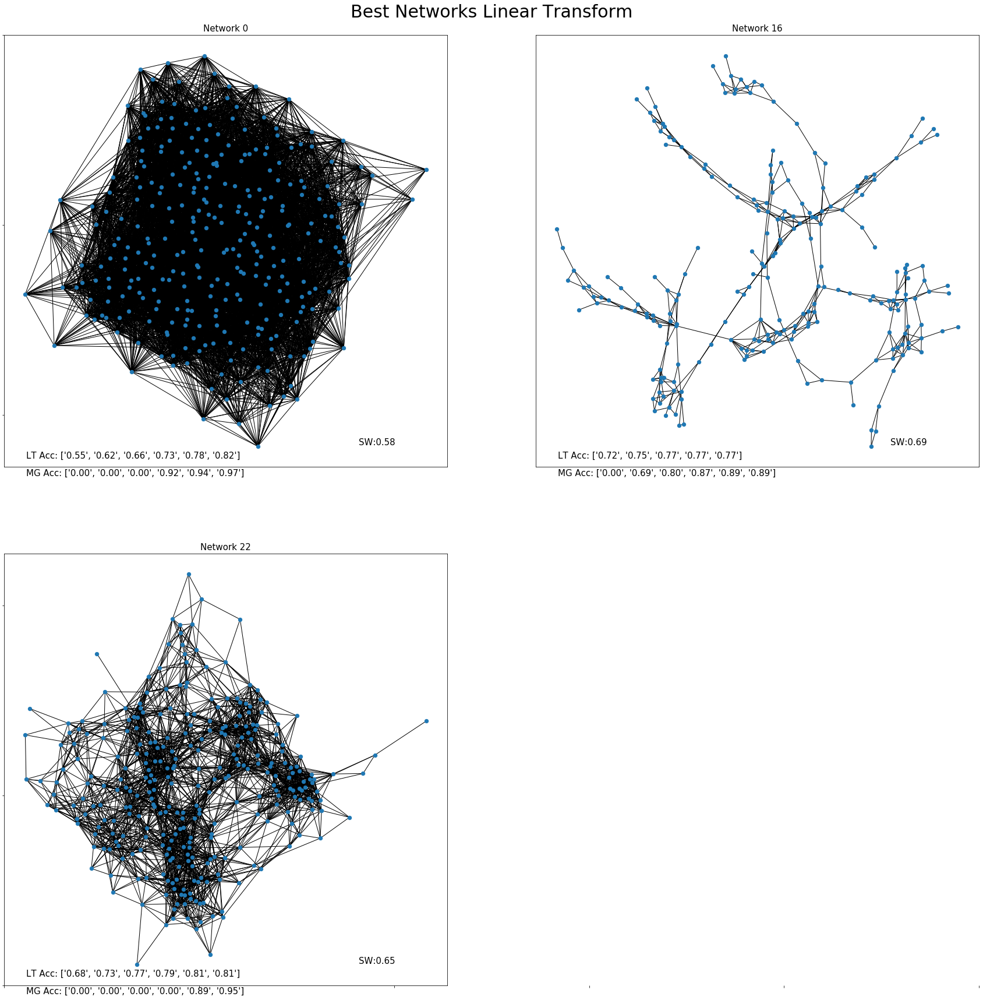

In [230]:
#Plot Best Networks
fig1=plt.figure(figsize=(30,30))

ax=[None]*len(networkListLT)

axBig = fig1.add_subplot(111)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
plt.title('Best Networks Linear Transform',fontsize=30,pad=30)
# plt.xlabel('PCoeff',fontsize=30,labelpad=15)
# plt.ylabel('MZ',fontsize=30,labelpad=15)
for i in range(len(ax)):
    thisNW=networkListLT[i]
    for j in range(len(ASN300[thisNW]['Accuracy']['Mackey Glass']['Accuracy Value'])):
        if ASN300[thisNW]['Accuracy']['Mackey Glass']['Accuracy Value'][j]<0:
            ASN300[thisNW]['Accuracy']['Mackey Glass']['Accuracy Value'][j]=0
    accuraciesMG=["%.2f"%item for item in ASN300[thisNW]['Accuracy']['Mackey Glass']['Accuracy Value']]
    accuraciesLT=["%.2f"%item for item in ASN300[thisNW]['Accuracy']['Linear Transformation']]
    ax[i]=fig1.add_subplot(2, 2, i+1) #change rows and columns to be factors of ASN300 length
    nx.draw_networkx(ASN300[thisNW]['G'],node_size=40,with_labels=False)
    ax[i].set_title('Network ' + str(thisNW),fontsize=15)
    plt.text(0.8,0.05,'SW:'+"{0:.2f}".format(smallworld[thisNW]),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot
    plt.text(0.05,0.02,'LT Acc: '+ str(accuraciesLT),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot
    plt.text(0.05,-0.02,'MG Acc: '+ str(accuraciesMG),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot

    
    #     ax[i].set_ylim(-1.5,1.5)
#     ax[i].set_xlim(-1.5,1.5)

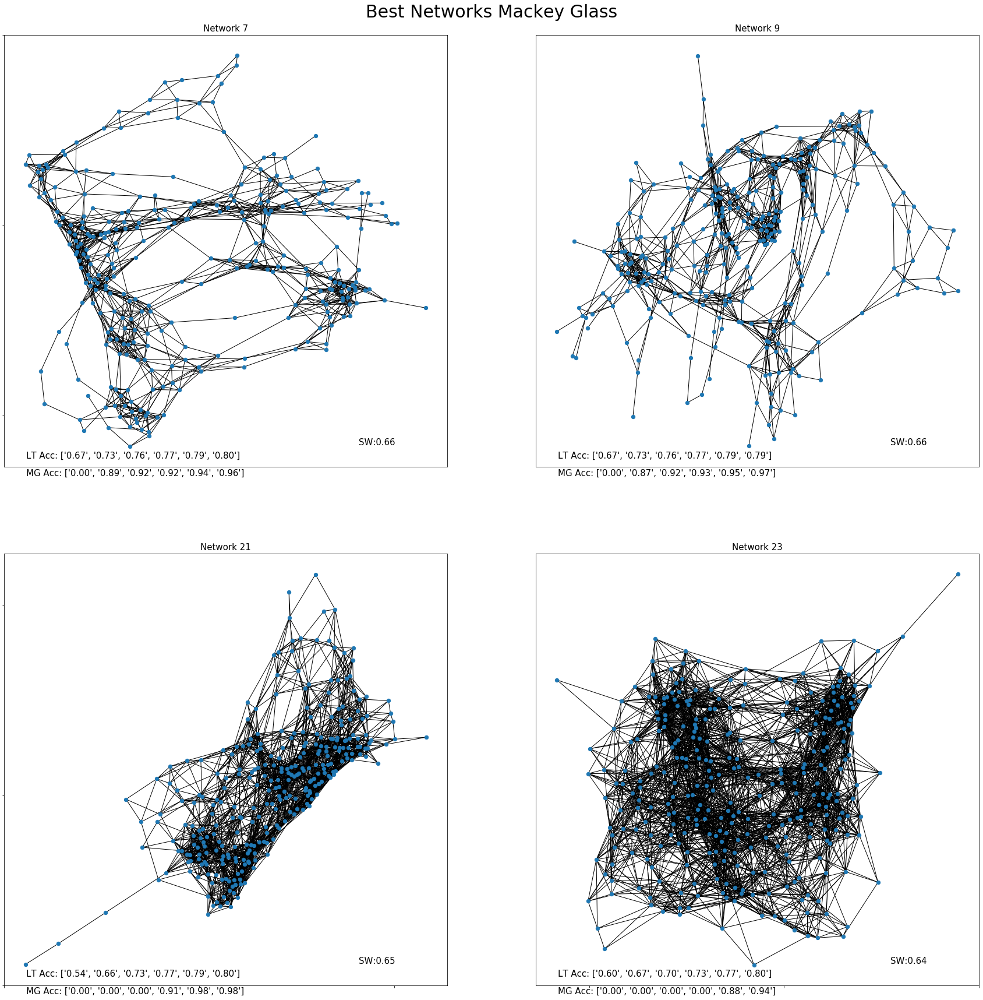

In [244]:
#Plot Best Networks
fig1=plt.figure(figsize=(30,30))

ax=[None]*len(networkListMG)

axBig = fig1.add_subplot(111)
axBig.set_yticklabels([])
axBig.set_xticklabels([])
axBig.set_frame_on(False)
plt.title('Best Networks Mackey Glass',fontsize=30,pad=30)
# plt.xlabel('PCoeff',fontsize=30,labelpad=15)
# plt.ylabel('MZ',fontsize=30,labelpad=15)
for i in range(len(ax)):
    thisNW2=networkListMG[i]
    for j in range(len(ASN300[thisNW]['Accuracy']['Mackey Glass']['Accuracy Value'])):
        if ASN300[thisNW2]['Accuracy']['Mackey Glass']['Accuracy Value'][j]<0:
            ASN300[thisNW2]['Accuracy']['Mackey Glass']['Accuracy Value'][j]=0
    accuraciesMG=["%.2f"%item for item in ASN300[thisNW2]['Accuracy']['Mackey Glass']['Accuracy Value']]
    accuraciesLT=["%.2f"%item for item in ASN300[thisNW2]['Accuracy']['Linear Transformation']]    
    ax[i]=fig1.add_subplot(2, 2, i+1) #change rows and columns to be factors of ASN300 length
    nx.draw_networkx(ASN300[thisNW2]['G'],node_size=40,with_labels=False)
    ax[i].set_title('Network ' + str(thisNW2),fontsize=15)
    plt.text(0.8,0.05,'SW:'+"{0:.2f}".format(smallworld[thisNW2]),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot
    plt.text(0.05,-0.02,'MG Acc: '+ str(accuraciesMG),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot
    plt.text(0.05,0.02,'LT Acc: '+ str(accuraciesLT),transform=ax[i].transAxes,fontsize=15) #this plots Smallworldness as text in a relative position on each subplot

    #     ax[i].set_ylim(-1.5,1.5)
#     ax[i].set_xlim(-1.5,1.5)